#### In this notebook, I have attempted to do the EDA, Feature selection, Clustering, and model building to predict the salary to be offered to a new candidate. This project was a part of my certification course and the data was sourced by them.

##### The use cases of this project could be:-

1.   Estimating a competitive and a fair salary to be offered to the candidate by minimizing human judgement 
2.   Understanding the parameters that affect the remuneration across various profiles
3. Assessing the similar kind of profiles in an unbiased way





In [893]:
from google.colab import drive

In [894]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [895]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold,cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,roc_curve,precision_recall_curve
import statsmodels.formula.api as sm
from xgboost import XGBClassifier
import datetime
from datetime import *
import lightgbm as lgbm
from sklearn.metrics import log_loss
import time
raw_text = u"\u20B9"

In [896]:
#The data was given by Great Learning capstone team
df = pd.read_csv('/content/gdrive/MyDrive/Capstone - HR /expected_ctc.csv')

In [897]:
#Looking at the shape of the dataset
df.shape

(25000, 29)

In [898]:
#Dropping IDX and Applicant_ID columns
df.drop(columns=["IDX","Applicant_ID"],axis=1,inplace=True)

In [899]:
#Datatypes of all the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 27 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Total_Experience                   25000 non-null  int64  
 1   Total_Experience_in_field_applied  25000 non-null  int64  
 2   Department                         22222 non-null  object 
 3   Role                               24037 non-null  object 
 4   Industry                           24092 non-null  object 
 5   Organization                       24092 non-null  object 
 6   Designation                        21871 non-null  object 
 7   Education                          25000 non-null  object 
 8   Graduation_Specialization          18820 non-null  object 
 9   University_Grad                    18820 non-null  object 
 10  Passing_Year_Of_Graduation         18820 non-null  float64
 11  PG_Specialization                  17308 non-null  obj

In [900]:
#Renaming of some columns for the ease of comprehension
df.rename(columns={"Total_Experience_in_field_applied":"Relevant_experience","Curent_location":"Current_location"},inplace=True)

In [901]:
#Changing the unique values of Inhand_Offer column from Yes and No to 0 and 1
df["Inhand_Offer"]=df["Inhand_Offer"].map({'N':0,'Y':1})

In [902]:
#Separating out the categorical and numerical columns
cat_col = df.select_dtypes(exclude=['int','float']).columns.tolist()
cont_col = df.select_dtypes(include=['int','float']).columns.tolist()
print("Number of categorical columns in the dataset are : {} \nNumber of numerical columns in the dataset are : {}".format(len(cat_col),len(cont_col)))

Number of categorical columns in the dataset are : 15 
Number of numerical columns in the dataset are : 12


In [903]:
#Number of unique values in the categorical features of the dataset
def num_unique_values(df):
    data = []
    for i in df.columns:
         data.append(df[i].nunique())
    s=pd.DataFrame({"Name of column":df.columns,"Number of unique values":data})
    return s.sort_values(by="Number of unique values",ascending=False)

In [904]:
num_unique_values(df[cat_col])

,Name of column,Number of unique values
1,Role,24
4,Designation,18
3,Organization,16
12,Curent_Location,15
13,Preferred_location,15
7,University_Grad,13
9,University_PG,13
11,University_PHD,13
0,Department,12
2,Industry,11


#### Descriptive Statistics

In [905]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Total_Experience,25000.00,NaN,NaN,NaN,12.49,7.47,0.00,6.00,12.00,19.00,25.00
Relevant_experience,25000.00,NaN,NaN,NaN,6.26,5.82,0.00,1.00,5.00,10.00,25.00
Department,22222,12,Marketing,2379,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Role,24037,24,Others,2248,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Industry,24092,11,Training,2237,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Organization,24092,16,M,1574,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Designation,21871,18,HR,1648,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,25000,4,PG,6326,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Graduation_Specialization,18820,11,Chemistry,1785,NaN,NaN,NaN,NaN,NaN,NaN,NaN
University_Grad,18820,13,Bhubaneswar,1510,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [906]:
#Inferences from descriptive statistics(need to be validated using visualization):
#1: Outliers are evident in Current CTC, Relevant experience
#2: Not many candidates have done certifications as less than 75% of candidates have done only 1 certifications
#3: Most of the values in passing year of Graduation,Post Graduation, and PHD are null values
#4: Current CTC and Expected CTC are left-skewed distribution. Total experience and Relevant experience are almost symmetric

##### Null values analysis



In [907]:
#Null values in each of the columns
df.isnull().sum()

Total_Experience                  0
Relevant_experience               0
Department                     2778
Role                            963
Industry                        908
Organization                    908
Designation                    3129
Education                         0
Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
Curent_Location                   0
Preferred_location                0
Current_CTC                       0
Inhand_Offer                      0
Last_Appraisal_Rating           908
No_Of_Companies_worked            0
Number_of_Publications            0
Certifications                    0
International_degree_any          0
Expected_CTC                      0
dtype: int64

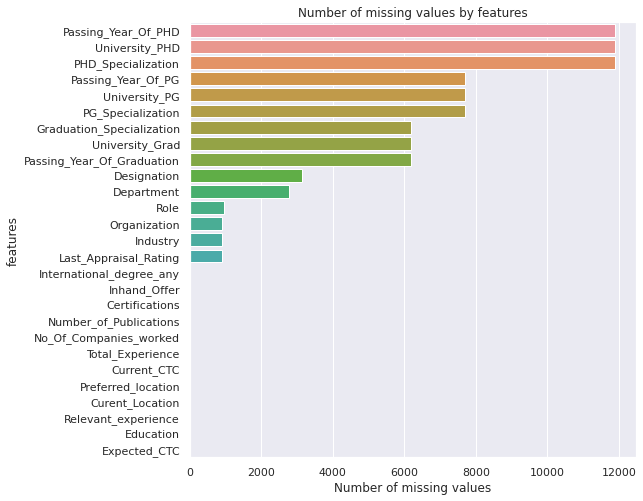

In [908]:
#Visually assessing null values
plt.figure(figsize=(8,8))
sns.barplot(x=df.isnull().sum().values,y=df.isnull().sum().index,order=df.isnull().sum().reset_index().sort_values(by=0,ascending=False)["index"])
plt.title('Number of missing values by features')
plt.xlabel('Number of missing values')
plt.ylabel('features')
plt.show()

In [909]:
null_value_features=list(df.isnull().sum()[df.isnull().sum()!=0].index)

In [910]:
perc_null=(df[null_value_features].isnull().sum()/df.shape[0])*100

In [911]:
perc_null=pd.DataFrame(perc_null)

In [912]:
perc_null

,0
Department,11.11
Role,3.85
Industry,3.63
Organization,3.63
Designation,12.52
Graduation_Specialization,24.72
University_Grad,24.72
Passing_Year_Of_Graduation,24.72
PG_Specialization,30.77
University_PG,30.77


In [913]:
perc_null.sort_values(by=0,ascending=False)[0].values

array([47.524, 47.524, 47.524, 30.768, 30.768, 30.768, 24.72 , 24.72 ,
       24.72 , 12.516, 11.112,  3.852,  3.632,  3.632,  3.632])

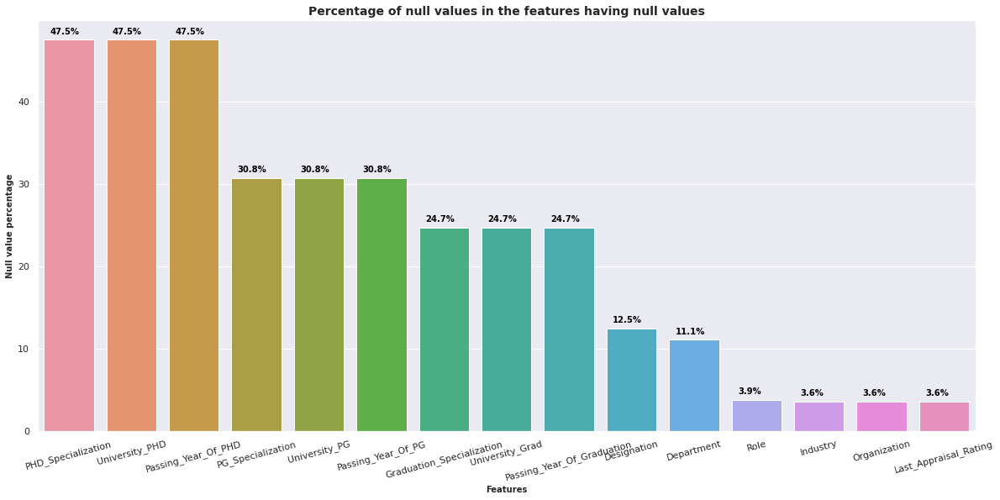

In [914]:
plt.figure(figsize=(20,9))
sns.barplot(x=perc_null.index,y=perc_null[0],order=perc_null.sort_values(by=0,ascending=False).index)
for (i,j) in enumerate(perc_null.sort_values(by=0,ascending=False)[0].values):
    plt.text(x=i-0.3,y=j+0.7,s="{:.1f}%".format(j),color="black",fontsize=10,fontweight="bold")
plt.xticks(rotation=15)
plt.title('Percentage of null values in the features having null values',fontdict={'fontsize':14,'weight':'bold'})
plt.xlabel('Features',fontdict={'fontsize':10,'weight':'bold'})
plt.ylabel('Null value percentage',fontdict={'fontsize':10,'weight':'bold'})
plt.show()

# Exploratory Data Analysis

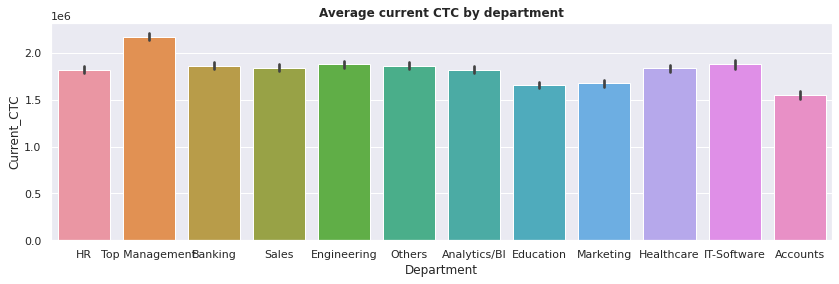

In [915]:
plt.figure(figsize=(14,4))
p=sns.barplot(x=df["Department"],y=df["Current_CTC"],estimator=np.mean)
p.set_title("Average current CTC by department",fontdict={'weight':'bold'})
plt.show()

In [916]:
data = df.copy()

In [917]:
#Here I have binned the Total experience feature into different intervals to do an analysis according to how job postings need the experience be
data["Total_Experience_range"]=pd.cut(data["Total_Experience"],bins=[0,2,6,11,16,21,25],
                              labels=['0-1','2-5','6-10','11-15','16-20','21-25'])

In [918]:
r1=range(data["Total_Experience_range"].nunique())

In [919]:
v1 = sorted(data["Total_Experience_range"].value_counts(1).values*100)
v1

[8.085671592229787,
 15.822679727710442,
 15.926448613647684,
 19.882118545575295,
 20.05229951851237,
 20.230782002324425]

In [920]:
v2 = sorted(data["Total_Experience_range"].value_counts())
v2

[1948, 3812, 3837, 4790, 4831, 4874]

In [921]:
data.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Total_Experience_range'],
      dtype='object')

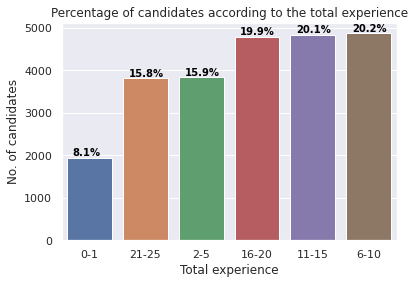

In [922]:
sns.countplot(x=data["Total_Experience_range"],order=data["Total_Experience_range"].value_counts().sort_values().index)
for (i,j,k) in zip(r1,v1,v2):
      plt.text(x=i-0.3,y=k+46,s="{:.1f}%".format(j),color="black",fontsize=10,fontweight="bold")
plt.ylabel('No. of candidates')
plt.xlabel('Total experience')
plt.title("Percentage of candidates according to the total experience")
plt.show()

In [923]:
print(df["Total_Experience"].describe())

print("Skewness in total experience is {} :".format(df["Total_Experience"].skew()))

count   25000.00
mean       12.49
std         7.47
min         0.00
25%         6.00
50%        12.00
75%        19.00
max        25.00
Name: Total_Experience, dtype: float64
Skewness in total experience is 0.0041087183649387215 :


In [924]:
#Doing the same binning with relevant experience
df["Relevant_experience"].unique()

array([ 0, 14, 12,  8,  5,  3,  1, 11,  7, 15, 10,  9,  4,  6,  2, 20, 16,
       25, 13, 19, 21, 22, 23, 17, 18, 24])

In [925]:
data["Relevant_experience_range"]=pd.cut(data["Relevant_experience"],bins=[0,2,6,11,16,21,25],
                              labels=['0-1','2-5','6-10','11-15','16-20','21-25'])

In [926]:
r2=range(data["Relevant_experience_range"].nunique())
r2

range(0, 6)

In [927]:
v3 = sorted(data["Relevant_experience_range"].value_counts(1).values*100)
v3

[1.7538923278934533,
 6.903020071281185,
 13.984243106359031,
 23.063215156631024,
 23.438379290939785,
 30.85725004689552]

In [928]:
v4 = sorted(data["Relevant_experience_range"].value_counts())
v4

[374, 1472, 2982, 4918, 4998, 6580]

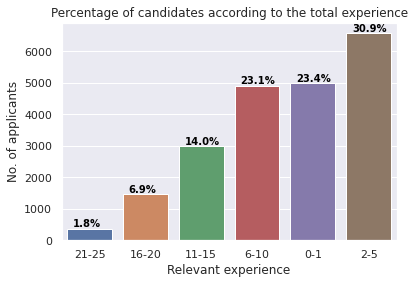

In [929]:
sns.countplot(x=data["Relevant_experience_range"],order=data["Relevant_experience_range"].value_counts().sort_values().index)
for (i,j,k) in zip(r2,v3,v4):
      plt.text(x=i-0.3,y=k+46,s="{:.1f}%".format(j),color="black",fontsize=10,fontweight="bold")
plt.ylabel('No. of applicants')
plt.xlabel('Relevant experience')
plt.title("Percentage of candidates according to the total experience")
plt.show()

In [930]:
#Cross-tabulation to analyse the proportion of relevant experience out of total experience
pd.set_option('display.float_format', lambda x: '{:.2f}%'.format(x))
data2 = pd.crosstab(index=data["Total_Experience_range"],columns=data["Relevant_experience_range"],normalize="index")*100
data2

Relevant_experience_range,0-1,2-5,6-10,11-15,16-20,21-25
Total_Experience_range,,,,,,
0-1,100.00%,0.00%,0.00%,0.00%,0.00%,0.00%
2-5,47.81%,52.19%,0.00%,0.00%,0.00%,0.00%
6-10,22.31%,47.25%,30.45%,0.00%,0.00%,0.00%
11-15,13.86%,29.27%,35.67%,21.19%,0.00%,0.00%
16-20,10.38%,21.51%,25.49%,27.24%,15.37%,0.00%
21-25,8.64%,16.37%,22.25%,21.43%,21.10%,10.22%


In [931]:
data2.to_csv('data2.csv')

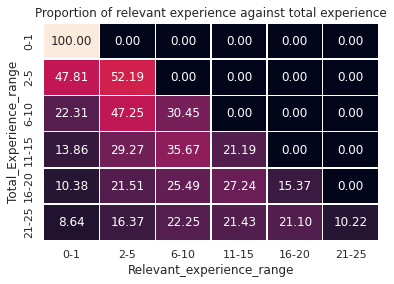

In [932]:
p=sns.heatmap(data2,annot=True,fmt='.2f',mask=np.triu(data2,+1),cbar=False,lw=0.5)
p.set_title('Proportion of relevant experience against total experience')
plt.show()

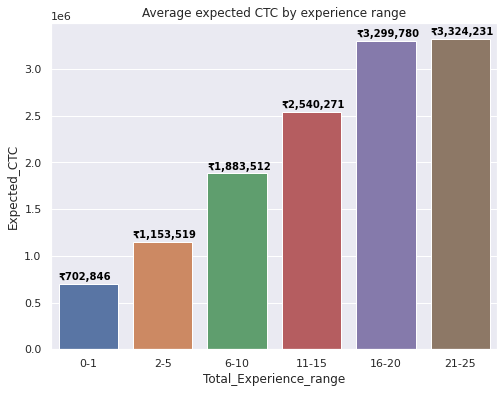

In [933]:
#Average expected CTC by total experience range
d1=data.groupby("Total_Experience_range").agg({"Expected_CTC":"mean"})["Expected_CTC"]
plt.figure(figsize=(8,6))
sns.barplot(x="Total_Experience_range",y="Expected_CTC",data=data,ci=False)
for (i,j) in enumerate(d1):
      plt.text(x=i-0.4,y=j+40000,s="{}{:,.0f}".format(raw_text,j),color="black",fontsize=10,fontweight="bold")
plt.title("Average expected CTC by experience range")
plt.show()

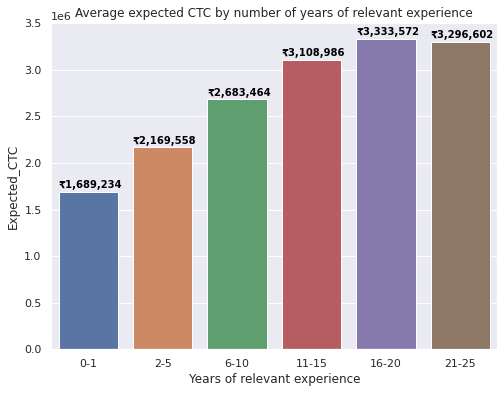

In [934]:
#Average expected CTC by relevant experience
d2 = data.groupby("Relevant_experience_range").agg({"Expected_CTC":"mean"})["Expected_CTC"]
plt.figure(figsize=(8,6))
sns.barplot(x="Relevant_experience_range",y="Expected_CTC",data=data,ci=False)
for (i,j) in enumerate(d2):
      plt.text(x=i-0.4,y=j+40000,s="{}{:,.0f}".format(raw_text,j),color="black",fontsize=10,fontweight="bold")
plt.title("Average expected CTC by number of years of relevant experience")
plt.xlabel("Years of relevant experience")
plt.show()

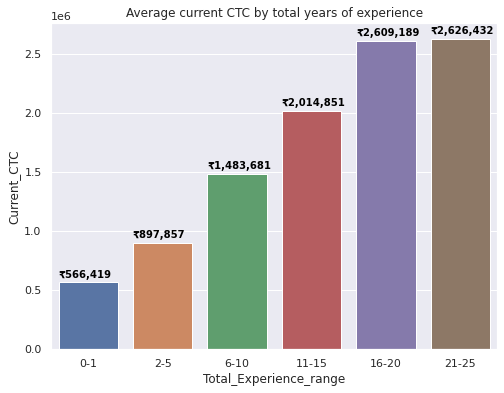

In [935]:
#Average current CTC by total years of experience
d3=data.groupby("Total_Experience_range").agg({"Current_CTC":"mean"})["Current_CTC"]
plt.figure(figsize=(8,6))
sns.barplot(x="Total_Experience_range",y="Current_CTC",data=data,ci=False)
for (i,j) in enumerate(d3):
      plt.text(x=i-0.4,y=j+40000,s="{}{:,.0f}".format(raw_text,j),color="black",fontsize=10,fontweight="bold")
plt.title("Average current CTC by total years of experience")
plt.show()

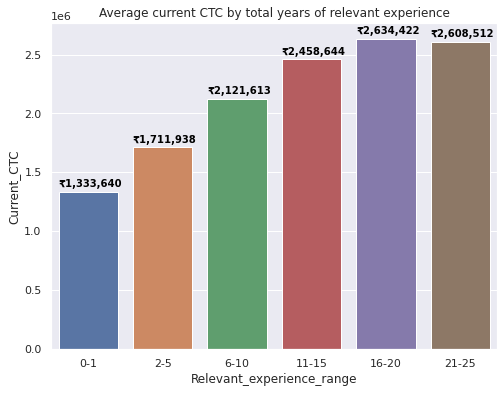

In [936]:
#Average current CTC by total years of relevant experience
d4=data.groupby("Relevant_experience_range").agg({"Current_CTC":"mean"})["Current_CTC"]
plt.figure(figsize=(8,6))
sns.barplot(x="Relevant_experience_range",y="Current_CTC",data=data,ci=False)
for (i,j) in enumerate(d4):
      plt.text(x=i-0.4,y=j+40000,s="{}{:,.0f}".format(raw_text,j),color="black",fontsize=10,fontweight="bold")
plt.title("Average current CTC by total years of relevant experience")
plt.show()

In [937]:
#Value counts of the industry feature
df.Industry.value_counts(dropna=False)

Training      2237
IT            2228
Insurance     2219
BFSI          2207
Automobile    2202
Analytics     2201
Retail        2195
Telecom       2190
Aviation      2183
FMCG          2180
Others        2050
NaN            908
Name: Industry, dtype: int64

In [938]:
#Value counts of the department feature
df["Department"].value_counts(dropna=False)

NaN               2778
Marketing         2379
Analytics/BI      2096
Healthcare        2062
Others            2041
Sales             1991
HR                1988
Banking           1952
Education         1948
Engineering       1937
Top Management    1632
Accounts          1118
IT-Software       1078
Name: Department, dtype: int64

In [939]:
def dist_qq_and_box_plot(df,cont):
    import statsmodels.api as SM1
    fig,axes=plt.subplots(nrows=len(df[cont].columns),ncols=3,figsize=(15,30))
    m=0
    for i in df[cont].columns:
        n=0
        sns.distplot(df[i],ax=axes[m][n])
        axes[m][n].set_title("Distribution plot of "+str(i))
        n+=1
        SM1.qqplot(df[i],ax=axes[m][n],line="s")
        axes[m][n].set_title("QQ plot of "+str(i))
        n+=1
        sns.boxplot(df[i],ax=axes[m][n])
        axes[m][n].set_title("Box plot of "+str(i))
        m+=1
    plt.tight_layout()

In [940]:
df5 = df.copy()

In [941]:
df5.dropna(inplace=True)

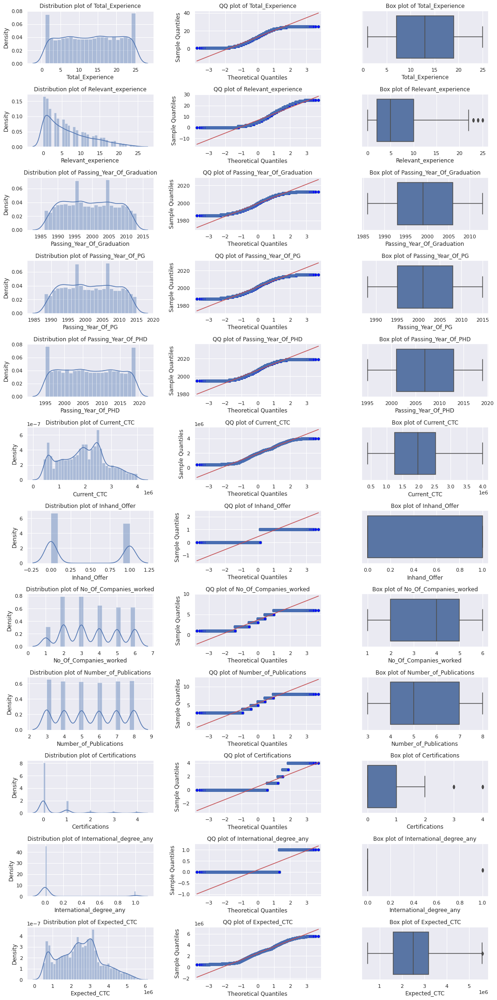

In [942]:
#Analysing the distribution of each of the numerical feature
dist_qq_and_box_plot(df5,cont_col)

In [943]:
p = df.copy()
p.isnull().sum()[p.isnull().sum()!=0]

Department                     2778
Role                            963
Industry                        908
Organization                    908
Designation                    3129
Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
Last_Appraisal_Rating           908
dtype: int64

In [944]:
# Countplot and Boxplot of Department,Role,Industry, and Organization

In [945]:
#Function to get the countplots of all the levels in the categorical features
def count_plot(df,col):
  """
  Count plot of all the levels in the categorical features
  df : Dataframe for which this information is needed
  col : Column name
  
  """
  plt.figure(figsize=(17,4))
  p=df[col].value_counts().values
  r=df[col].value_counts(1)*100
  sns.countplot(x=df[col],order=r.index)
  for (i,j) in enumerate(r.values):
    plt.text(x=i-0.3,y=0.7+p[i],s="{:.1f}%".format(j),color="black",fontsize=10,fontweight="bold")
  plt.title("Count of the different levels of "+str(col))
  #plt.title("Count of the applicants with current location as : {}".format(data1["Curent_Location"].unique()[0]))
  plt.xticks(rotation=30)

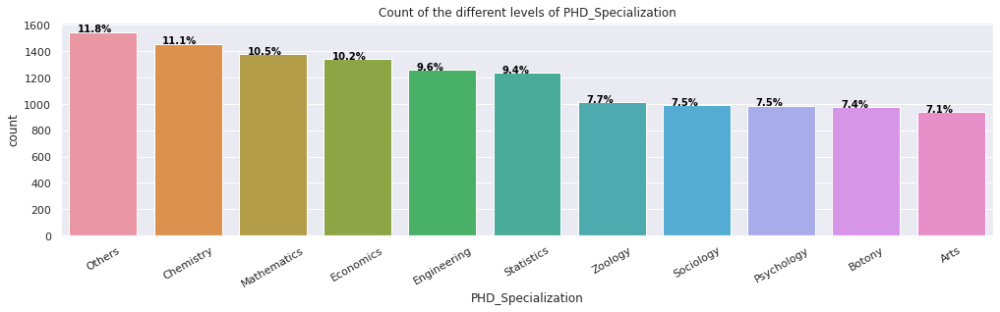

In [946]:
count_plot(df,cat_col[10])

In [947]:
#Function to get the distribution of current CTC across different levels of the categorical features
def cat_plot(df,col):
  #plt.figure(figsize=(40,4))
  #p=df[col].value_counts().values
  #r=df[col].value_counts(1)*100
  sns.catplot(x=col,y='Current_CTC',data=df,kind='box')
  plt.title("Boxplot of current CTC with "+str(col))
  sns.set(font_scale=1.0)
  plt.xticks(rotation=30)

In [948]:
#Function to get the distribution of expected CTC across different levels of the categorical features
def cat_plot1(df,col):
  #plt.figure(figsize=(40,4))
  #p=df[col].value_counts().values
  #r=df[col].value_counts(1)*100
  sns.catplot(x=col,y='Expected_CTC',data=df,kind='box')
  plt.title("Boxplot of expected CTC with "+str(col))
  sns.set(font_scale=1.0)
  plt.xticks(rotation=20)

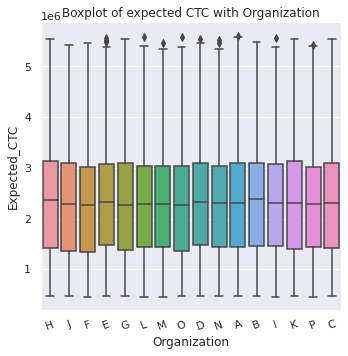

In [949]:
cat_plot1(df,cat_col[3])

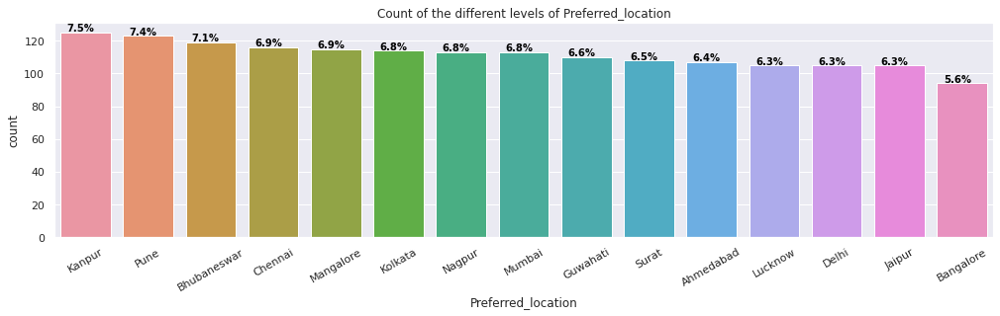

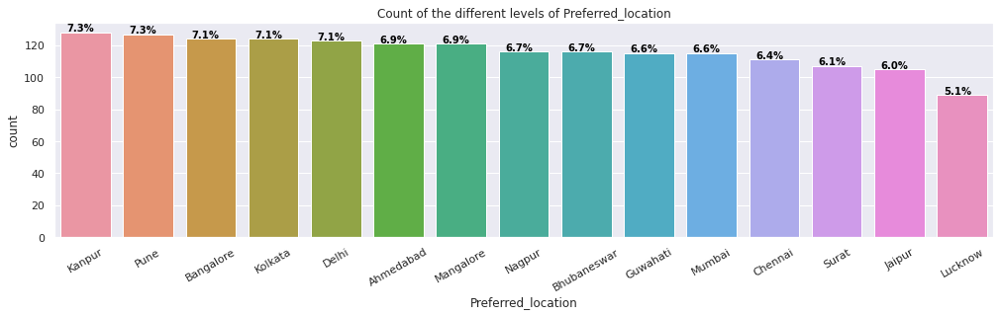

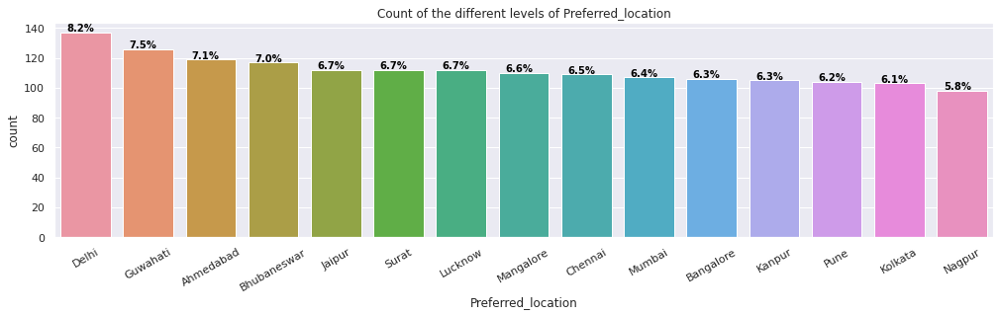

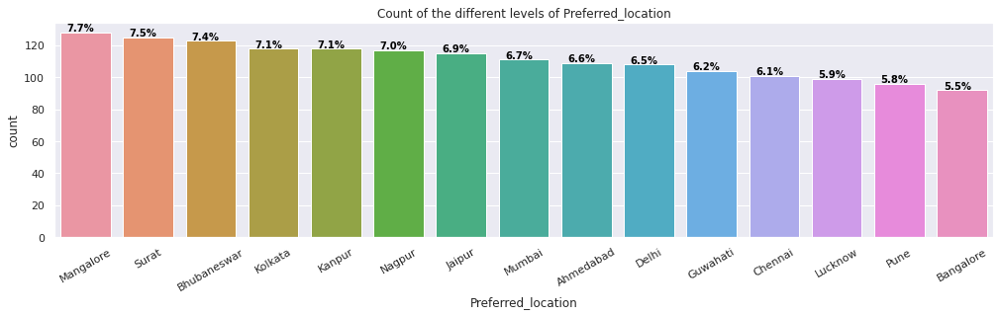

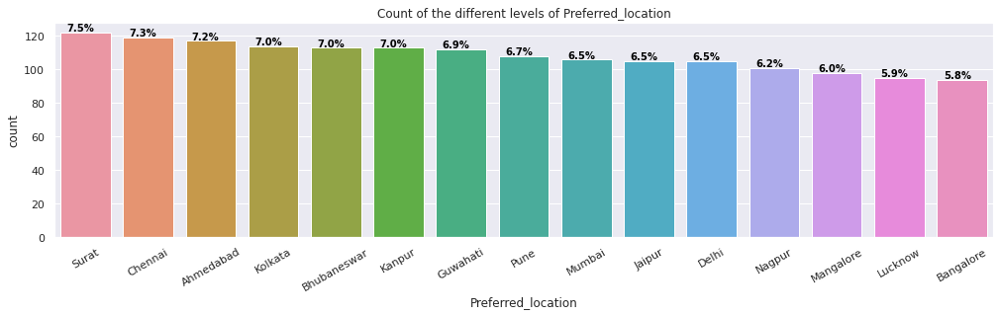

...

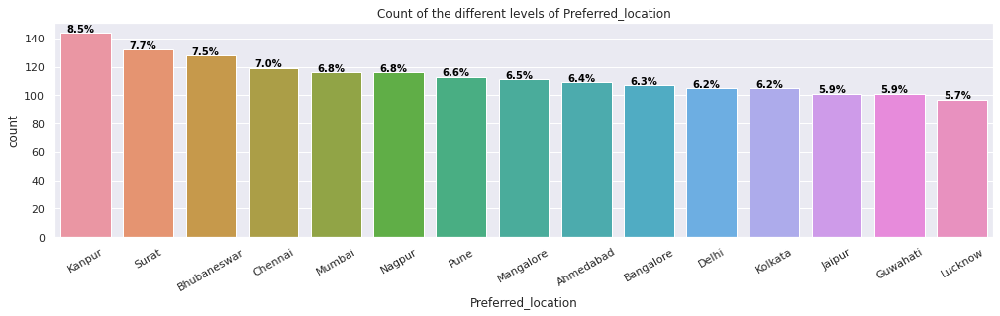

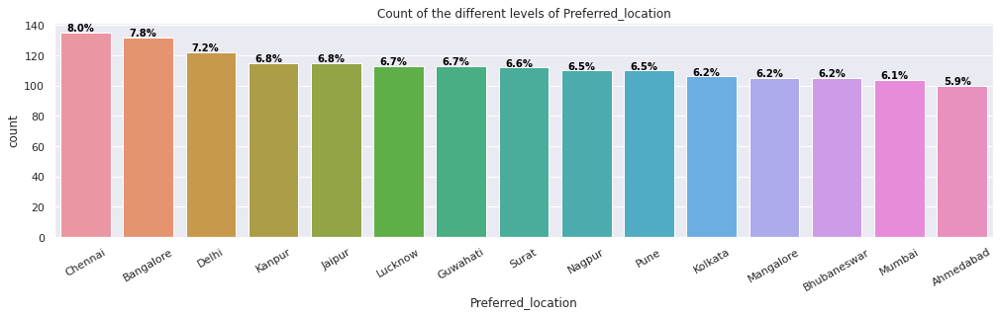

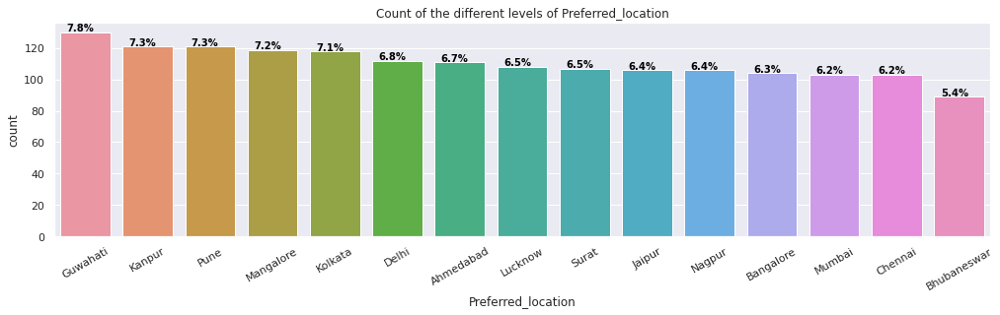

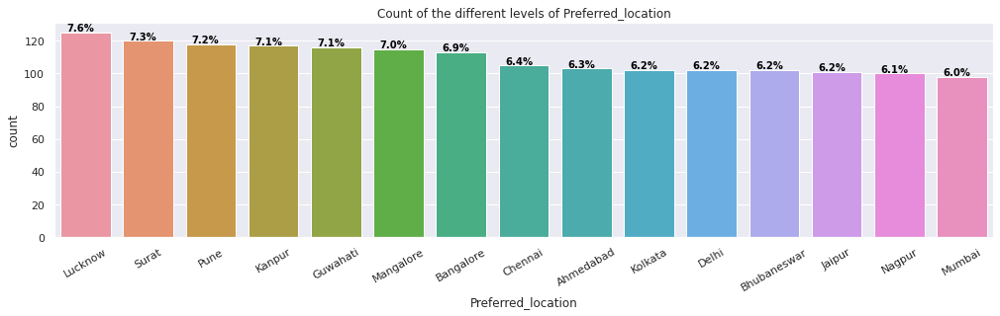

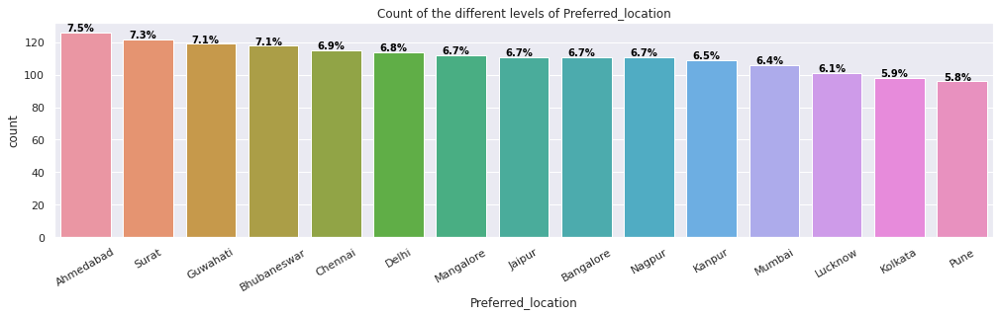

In [950]:
#Count plot of the different levels of preferred location against every current location
l1 = df["Curent_Location"].unique().tolist()
for i in l1:
  data1 = df.loc[df["Curent_Location"]==i]
  count_plot(data1,cat_col[13])

In [951]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df.loc[df["Inhand_Offer"]=='N',"Current_CTC"].describe()

count   0.00
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Current_CTC, dtype: float64

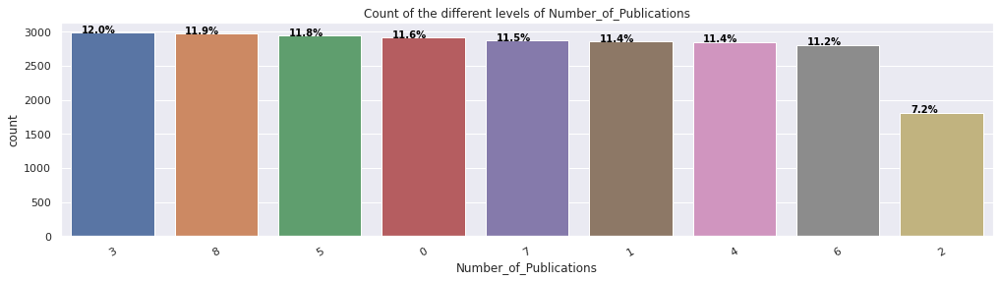

In [952]:
#Count plot of the different levels of Number of publications
count_plot(df,'Number_of_Publications')

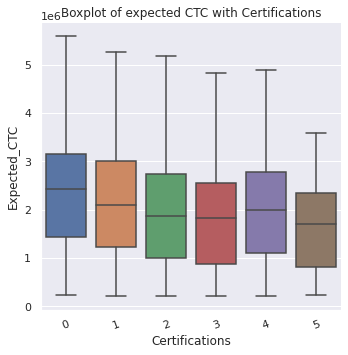

In [953]:
#Distribution of expected CTC against certifications
cat_plot1(df,'Certifications')

##### Missing value imputation begins here!

In [954]:
df.isnull().sum()

Total_Experience                  0
Relevant_experience               0
Department                     2778
Role                            963
Industry                        908
Organization                    908
Designation                    3129
Education                         0
Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
Curent_Location                   0
Preferred_location                0
Current_CTC                       0
Inhand_Offer                      0
Last_Appraisal_Rating           908
No_Of_Companies_worked            0
Number_of_Publications            0
Certifications                    0
International_degree_any          0
Expected_CTC                      0
dtype: int64

###### On investigating the reason of missing values in Role, Designation, Industry, Organization, and Department. It was found that these columns have missing values for each of the records for which the total experience is 0 i.e. the candidate is fresher.

In [955]:
df.loc[df["Department"].isna()==True,["Total_Experience","Relevant_experience","Role","Industry","Organization","Designation"]].head()

,Total_Experience,Relevant_experience,Role,Industry,Organization,Designation
0,0,0,NaN,NaN,NaN,NaN
13,0,0,NaN,NaN,NaN,NaN
30,4,4,Bio statistician,Others,O,Medical Officer
32,12,0,Senior Researcher,BFSI,N,Marketing Manager
40,9,8,Senior Researcher,Insurance,M,Sr.Manager


In [956]:
#filt1=((df["Total_Experience"]==0)&(df["Relevant_experience"]==0))
filt1=((df["Total_Experience"]==0))
W=df.loc[filt1,["Role","Industry","Organization","Designation","Department"]]

In [957]:
W

,Role,Industry,Organization,Designation,Department
0,NaN,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN,NaN
140,NaN,NaN,NaN,NaN,NaN
150,NaN,NaN,NaN,NaN,NaN
176,NaN,NaN,NaN,NaN,NaN
181,NaN,NaN,NaN,NaN,NaN
206,NaN,NaN,NaN,NaN,NaN
281,NaN,NaN,NaN,NaN,NaN
311,NaN,NaN,NaN,NaN,NaN
356,NaN,NaN,NaN,NaN,NaN


In [958]:
#Imputing fresher in place of missing values which satisfy the below condition
for i in ["Department","Role","Industry","Organization","Designation"]:
  df[i]=np.where(df["Total_Experience"]==0,'Fresher',df[i])

In [959]:
#It was noticed that last_appraisal_rating column also has missing values for the records where candidate has 0 total experience

In [960]:
filt = ((df["Last_Appraisal_Rating"].isna()==True) & (df["Department"]=="Fresher") & (df["Role"]=="Fresher") & (df["Industry"]=="Fresher") & (df["Organization"]=="Fresher") & (df["Designation"]=="Fresher"))
df.loc[filt,["Department","Role","Industry","Organization","Designation"]].shape

(908, 5)

In [961]:
df["Last_Appraisal_Rating"]=np.where(filt,"Fresher",df["Last_Appraisal_Rating"])

In [962]:
df.isnull().sum()[df.isnull().sum()!=0]

Department                     1870
Role                             55
Designation                    2221
Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
dtype: int64

In [963]:
df["Department_missing"]=np.where(df["Department"].isna(),1,0)
df["Role_missing"]=np.where(df["Role"].isna(),1,0)

In [964]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Department_missing',
       'Role_missing'],
      dtype='object')

In [965]:
p = df.copy()
p.isnull().sum()[p.isnull().sum()!=0]

Department                     1870
Role                             55
Designation                    2221
Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
dtype: int64

In [966]:
df["Designation_missing"]=np.where(df["Designation"].isna(),1,0)

In [967]:
data_Designation_missing = df.loc[df["Designation_missing"]==1,["Role","Industry","Organization","Department"]]
data_Role_missing = df.loc[df["Role_missing"]==1,["Designation","Industry","Organization","Department"]]
data_Department_missing = df.loc[df["Department_missing"]==1,["Role","Industry","Organization","Designation"]]

In [968]:
def countplot_1(data):
  fig,axes = plt.subplots(4,1,figsize=(25,15))
  for (i,j) in enumerate(data.columns):
    sns.countplot(x=j,data=data,ax=axes[i],order=data[j].value_counts().index)
    for (a,b) in enumerate(data[j].value_counts()):
        axes[i].text(x=a-0.3,y=b+0.7,s=b,color="black",fontsize=10,fontweight="bold")


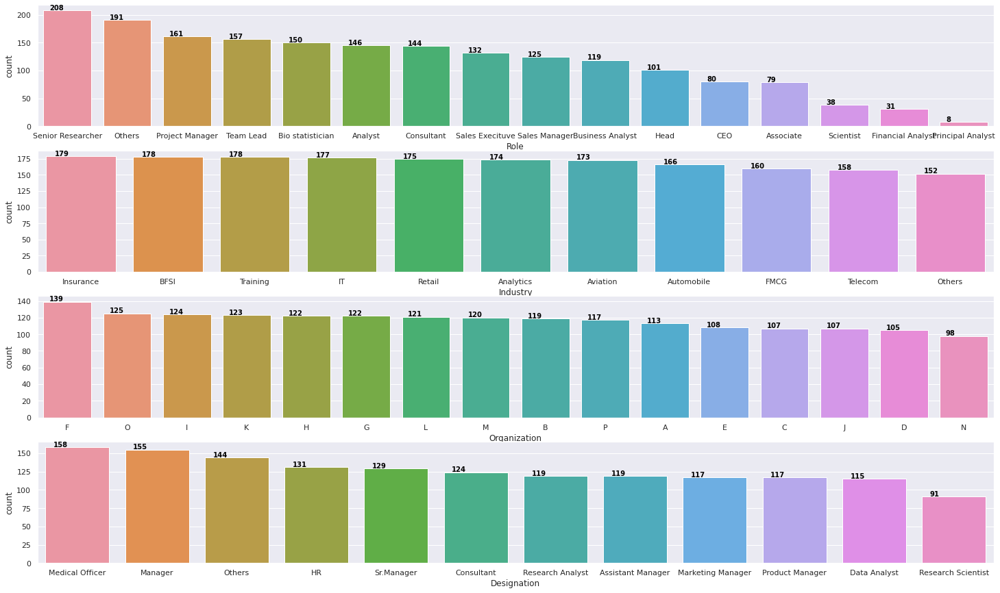

In [969]:
#Checking the counplot to see if the department is missing systematically 
countplot_1(data_Department_missing)

In [970]:
#As the values in the columns Role, Designation, Department are not missing at random
#It was chosen not to impute the values in these columns by simple imputer methods. Instead, I utilized CatBoostClassifier to
#predict the values

In [971]:
def null_cols(df):
  null_cols=df.isnull().sum()[df.isnull().sum()!=0].index.tolist()
  return null_cols

In [972]:
null_columns=null_cols(df)
null_columns

['Department',
 'Role',
 'Designation',
 'Graduation_Specialization',
 'University_Grad',
 'Passing_Year_Of_Graduation',
 'PG_Specialization',
 'University_PG',
 'Passing_Year_Of_PG',
 'PHD_Specialization',
 'University_PHD',
 'Passing_Year_Of_PHD']

##### Method to impute missing values using CatBoostClassifer

In [973]:
#Step 1 : Separating out the indices of the records for which the column has missing values
#Designation_non_null_index=df[df["Designation_missing"]==0].index
#Designation_null_index=df[df["Designation_missing"]==1].index

In [974]:
list1 = []
for i in df.drop(columns=null_columns,axis=1).columns:
  list1.append(df.columns.tolist().index(i))

In [975]:
list1.append(df.columns.tolist().index('Designation'))

In [976]:
list1

[0, 1, 4, 5, 7, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 6]

In [977]:
list2 = list1.copy()

In [978]:
list2

[0, 1, 4, 5, 7, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 6]

In [979]:
#Step 2 : Storing these indices in separate dataframes
#Designation_train = df.iloc[Designation_non_null_index,list1]
#Designation_test = df.iloc[Designation_null_index,list2]

In [980]:
#Step 3: Instantiating the model

#!pip install catboost

#import catboost as cb

#from catboost import Pool
#cbc = cb.CatBoostClassifier()

In [981]:
#Step 4: Separating the train and test

#X_train=Designation_train.drop("Designation",axis=1)
#Y_train=Designation_train["Designation"]

#X_test=Designation_test.drop("Designation",axis=1)
#Y_test=Designation_test["Designation"]

In [982]:
#Step 5: cat_features

#cat_features_train = X_train.select_dtypes(exclude=['int','float']).columns.tolist()
#cat_features_test = X_test.select_dtypes(exclude=['int','float']).columns.tolist()

In [983]:
#Step 6: Pool

#pool_train = Pool(X_train,Y_train,cat_features=cat_features_train)
#pool_test = Pool(X_test,Y_test,cat_features=cat_features_test)

In [984]:
#Step 7 : Training the data

#cbc.fit(pool_train)

In [985]:
#Step 8 : Predicting the class

#Designation_pred = cbc.predict(X_test)

In [986]:
#Step 9: Imputing the missing values

#for (i,j) in zip(range(len(Designation_pred)),Designation_null_index):
  #df.iloc[j,2] = Designation_pred[i][0]

In [987]:
#This was a long process as it took around 2-3 hours to impute the values 

In [988]:
df1 = pd.read_csv("/content/gdrive/MyDrive/Capstone - HR /With_null_values.csv")

In [989]:
df = df1

In [990]:
df.columns

Index(['Unnamed: 0', 'Total_Experience', 'Relevant_experience', 'Department',
       'Role', 'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Total_Experience_range',
       'Relevant_experience_range', 'Department_missing', 'Role_missing',
       'Designation_missing'],
      dtype='object')

In [991]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [992]:
df.isnull().sum()[df.isnull().sum()!=0]

Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
Last_Appraisal_Rating           908
dtype: int64

In [993]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Total_Experience_range',
       'Relevant_experience_range', 'Department_missing', 'Role_missing',
       'Designation_missing'],
      dtype='object')

In [994]:
data = df.copy()

In [995]:
#Dropping the variables that were created for EDA and imputation
df.drop(columns=['Department_missing', 'Role_missing','Designation_missing'],axis=1,inplace=True)

In [996]:
df.drop(columns=["Total_Experience_range","Relevant_experience_range"],axis=1,inplace=True)

In [997]:
#df.drop(columns=["Curent_Location","Preferred_location","Passing_Year_Of_Graduation",'Passing_Year_Of_PHD','Passing_Year_Of_PG'],axis=1,inplace=True)

### Feature engineering

In [998]:
#1. If Current location and preferred location is same
df["Willing_to_relocate"]=np.where(df["Preferred_location"]==df["Curent_Location"],0,1)

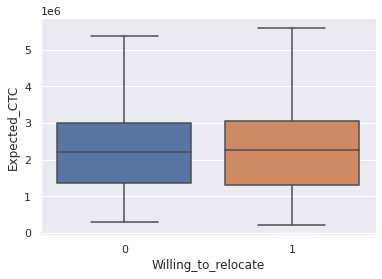

In [999]:
sns.boxplot(x=df["Willing_to_relocate"],y=df["Expected_CTC"])

In [1000]:
df.groupby("Willing_to_relocate").agg({"Expected_CTC":"mean"})

,Expected_CTC
Willing_to_relocate,
0,2228278.45
1,2251784.92


In [1001]:
df["Curent_Location"].unique()

array(['Guwahati', 'Bangalore', 'Ahmedabad', 'Kanpur', 'Pune', 'Delhi',
       'Surat', 'Nagpur', 'Jaipur', 'Kolkata', 'Bhubaneswar', 'Mangalore',
       'Mumbai', 'Lucknow', 'Chennai'], dtype=object)

In [1002]:
#df.columns

In [1003]:
#df["No_Of_Companies_worked"].unique()

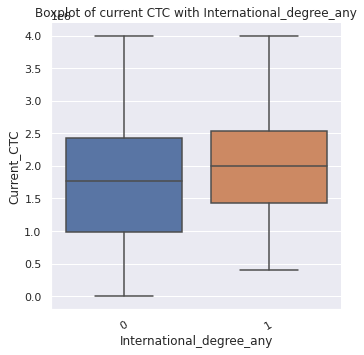

In [1004]:
cat_plot(df,"International_degree_any")

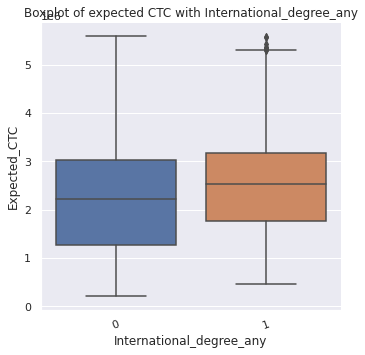

In [1005]:
cat_plot1(df,"International_degree_any")

##### Assessing outliers in the data

In [1006]:
def number_of_outliers(df):
    IQR = df.quantile(0.75) - df.quantile(0.25)
    Number = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR)))).sum()
    Outlier = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR))))
    dataframe = pd.DataFrame({"Number of Outliers":Number})
    return (dataframe.sort_values(by="Number of Outliers",ascending=False))

In [1007]:
Q3 = df.Relevant_experience.quantile(0.75)
Q1 = df.Relevant_experience.quantile(0.25)
IQR = Q3 - Q1
outlier_value=[]
for i in df.Relevant_experience:
  if ((i<(Q1-(1.5*IQR)))|(i>(Q3+(1.5*IQR)))):
    outlier_value.append(i)

In [1008]:
list(set(outlier_value))

[24, 25]

In [1009]:
filt=((df["Relevant_experience"]==24) | (df["Relevant_experience"]==25))
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
a=df.loc[filt,:]

In [1010]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Willing_to_relocate'],
      dtype='object')

In [1011]:
#2. Creating a feature candidate in demand for the candidates who have an offer in hand and received key performer rating in last appraisal
df["Candidate_in_demand"]=np.where(((df["Inhand_Offer"]=='Y')&(df["Last_Appraisal_Rating"]=="Key_Performer")),1,0)

In [1012]:
df.groupby("Candidate_in_demand").agg({"Expected_CTC":"mean"})

,Expected_CTC
Candidate_in_demand,
0,2175148.46
1,2762970.20


In [1013]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation', 'PG_Specialization', 'University_PG',
       'Passing_Year_Of_PG', 'PHD_Specialization', 'University_PHD',
       'Passing_Year_Of_PHD', 'Curent_Location', 'Preferred_location',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Number_of_Publications', 'Certifications',
       'International_degree_any', 'Expected_CTC', 'Willing_to_relocate',
       'Candidate_in_demand'],
      dtype='object')

### Further assessment of missing values

In [1014]:
null_cols=df.isnull().sum()[df.isnull().sum()!=0]
null_cols

Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
Last_Appraisal_Rating           908
dtype: int64

In [1015]:
filt = ((df["Last_Appraisal_Rating"].isna()==True) & (df["Department"]=="Fresher") & (df["Role"]=="Fresher") & (df["Industry"]=="Fresher") & (df["Organization"]=="Fresher") & (df["Designation"]=="Fresher"))
df.loc[filt,["Department","Role","Industry","Organization","Designation"]].shape

(908, 5)

In [1016]:
df["Last_Appraisal_Rating"].dtypes

dtype('O')

In [1017]:
#Imputing missing values in Last_appraisal_rating. Wherever the last_appraisal_rating is missing fresher is being 
#imputed
df["Last_Appraisal_Rating"]=np.where(filt,"Fresher",df["Last_Appraisal_Rating"])

In [1018]:
def null_cols(df):
  null_cols=df.isnull().sum()[df.isnull().sum()!=0]
  return null_cols

In [1019]:
null_cols(df)

Graduation_Specialization      6180
University_Grad                6180
Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
dtype: int64

##### On investigating the reason of missing values in the column Graduation specialization, University grad, and passing year of graduation, it was found that the education for these records was 'Under grad' i.e., they were not even graduated

In [1020]:
filt1 = ((df["Graduation_Specialization"].isna()==True) & (df["University_Grad"].isna()==True) & (df["Passing_Year_Of_Graduation"].isna()==True))
df.loc[filt1,"Education"].shape

(6180,)

In [1021]:
#Wherever graduation specialization, university graduation, and passing year of graduation are null
#Education is under grad which means the candidate is not even graduate
df.loc[filt1,"Education"].unique()

array(['Under Grad'], dtype=object)

In [1022]:
null_cols1 = null_cols(df)
null_cols1[:3].index

Index(['Graduation_Specialization', 'University_Grad',
       'Passing_Year_Of_Graduation'],
      dtype='object')

In [1023]:
#Consequently, the values in these columns were imputed as Did not do graduation
for i in null_cols1[:2].index.tolist():
  df[i]=np.where(df[i].isna()==True,"Did not do graduation",df[i])

In [1024]:
null_cols1 = null_cols(df)
null_cols1

Passing_Year_Of_Graduation     6180
PG_Specialization              7692
University_PG                  7692
Passing_Year_Of_PG             7692
PHD_Specialization            11881
University_PHD                11881
Passing_Year_Of_PHD           11881
dtype: int64

In [1025]:
def corr_heatmap(data):
    cm=data.corr()
    #plt.figure(figsize=())
    sns.heatmap(cm,cbar=True,annot=True,fmt=".2f",lw=0.5,mask=np.triu(cm,+1))

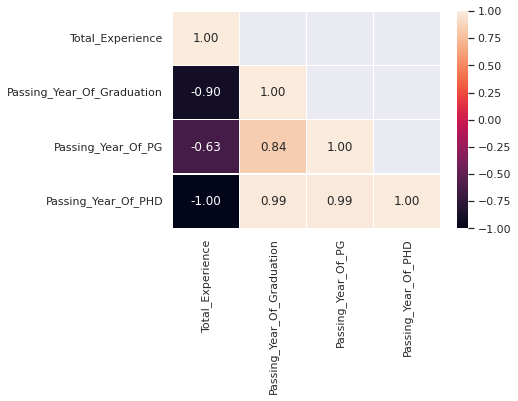

In [1026]:
#Assessing the correlation between passing year of graduation, PG, and/or PHD with Total experience. Prima facie, they might be strongly 
#correlated with each other
data1 = df[["Total_Experience","Passing_Year_Of_Graduation","Passing_Year_Of_PG","Passing_Year_Of_PHD"]]
corr_heatmap(data1)


In [1027]:
#Since passing year of graduation, passing year of PG, and passing year of PHD are highly correlated with 
#total experience. I  am choosing to drop them.
df.drop(columns=["Passing_Year_Of_Graduation","Passing_Year_Of_PG","Passing_Year_Of_PHD"],axis=1,inplace=True)

In [1028]:
null_cols1 = null_cols(df)
null_cols1

PG_Specialization      7692
University_PG          7692
PHD_Specialization    11881
University_PHD        11881
dtype: int64

##### On further investigating the missing values in columns like PG Specialization and University PG. It was found that 6180 candidates who are not even graduated have their PG specialization and University pg fields missing

In [1029]:
filt1 = ((df["PG_Specialization"].isna()==True) & (df["University_PG"].isna()==True))
df.loc[filt1,"Education"].shape

(7692,)

In [1030]:
df.loc[filt1,"Education"].unique()

array(['PG', 'Under Grad', 'Grad', 'Doctorate'], dtype=object)

In [1031]:
#filt2 = ((df["Education"]=="Grad") | (df["Education"]=="Under Grad"))
filt3 = (df["Education"]=="Under Grad")
df.loc[filt3,["PG_Specialization","University_PG","Education"]].isnull().sum()
#6180 candidates who are not even graduated have their PG specialization and University pg fields missing

PG_Specialization    6180
University_PG        6180
Education               0
dtype: int64

In [1032]:
df.loc[filt3,["PG_Specialization","University_PG","Education"]].shape

(6180, 3)

In [1033]:
null_cols1 = null_cols(df)
null_cols1[-2:].index

Index(['PHD_Specialization', 'University_PHD'], dtype='object')

In [1034]:
for i in null_cols1[:2].index:
  df[i]=np.where(df["Education"]=="Under Grad","Did not do PG",df[i])

In [1035]:
null_cols1 = null_cols(df)
null_cols1

PG_Specialization      1512
University_PG          1512
PHD_Specialization    11881
University_PHD        11881
dtype: int64

In [1036]:
filt4 =((df["PHD_Specialization"].isna()==True) & (df["University_PHD"].isna()==True) & (df["Education"].isin(["Grad","Under Grad","PG"])))
filt5 = df["Education"].isin(["Grad","Under Grad","PG"])
#df.loc[filt4,"Education"].shape
df.loc[filt4,"Education"].unique()
#df.loc[filt4].shape
#df.loc[filt5,["PHD_Specialization","University_PHD"]].head()

array(['PG', 'Under Grad', 'Grad'], dtype=object)

In [1037]:
for i in null_cols1[-2:].index:
  df[i]=np.where(df["Education"].isin(["Grad","Under Grad","PG"]),"Did not do PHD",df[i])

In [1038]:
null_cols1 = null_cols(df)
null_cols1

PG_Specialization     1512
University_PG         1512
PHD_Specialization    1918
University_PHD        1918
dtype: int64

In [1039]:
filt1 = ((df["PG_Specialization"].isna()==True) & (df["University_PG"].isna()==True))
filt2 = df["Education"].isin(["Under Grad","Grad"])
df.loc[(filt1 & filt2),["Education"]].index

Int64Index([   43,    98,   105,   225,   231,   260,   366,   385,   442,
              499,
            ...
            24421, 24438, 24443, 24449, 24477, 24517, 24846, 24862, 24885,
            24926],
           dtype='int64', length=484)

In [1040]:
df.columns.tolist().index("University_PG")

11

In [1041]:
for i in df.loc[(filt1 & filt2),["Education"]].index:
  df.iloc[i,[10,11]]=["Did not do PG","Did not do PG"]

In [1042]:
null_cols1 = null_cols(df)
null_cols1

PG_Specialization     1028
University_PG         1028
PHD_Specialization    1918
University_PHD        1918
dtype: int64

In [1043]:
# 506 candidates with Doctorate level of education have PG specialization, university PG, PHD specialization, university PHD
# missing

In [1044]:
PHD_missing = ((df["PHD_Specialization"].isna()==True)&(df["University_PHD"].isna()==True))
PG_missing = ((df["PG_Specialization"].isna()==True)&(df["University_PG"].isna()==True))

In [1045]:
data1=df.loc[PHD_missing]
data1.groupby("Education")["Role"].count()

Education
Doctorate    1918
Name: Role, dtype: int64

In [1046]:
# All the candidates who have University PHD and PHD specialization missing have Doctorate level of education

In [1047]:
data2 = df.loc[PG_missing]
data2.groupby("Education")["Role"].count()

Education
Doctorate    506
PG           522
Name: Role, dtype: int64

In [1048]:
null_cols1 = null_cols(df)
null_cols1

PG_Specialization     1028
University_PG         1028
PHD_Specialization    1918
University_PHD        1918
dtype: int64

In [1049]:
df1=df.copy()
df1.drop(columns=null_cols1.index,axis=1,inplace=True)

In [1050]:
df1.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad', 'Curent_Location',
       'Preferred_location', 'Current_CTC', 'Inhand_Offer',
       'Last_Appraisal_Rating', 'No_Of_Companies_worked',
       'Number_of_Publications', 'Certifications', 'International_degree_any',
       'Expected_CTC', 'Willing_to_relocate', 'Candidate_in_demand'],
      dtype='object')

In [1051]:
## This implies that 1028 candidates who are atleast post graduate have their PG university and PG specialization missing
## 1918 who all are doctorate have their PHD university and PHD specialization missing

In [1052]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad', 'PG_Specialization',
       'University_PG', 'PHD_Specialization', 'University_PHD',
       'Curent_Location', 'Preferred_location', 'Current_CTC', 'Inhand_Offer',
       'Last_Appraisal_Rating', 'No_Of_Companies_worked',
       'Number_of_Publications', 'Certifications', 'International_degree_any',
       'Expected_CTC', 'Willing_to_relocate', 'Candidate_in_demand'],
      dtype='object')

#### Assessing the correlation among the categorical and numerical features. Dython was used to assess the correlation.

#### More information on Dython can be found [here](https://pypi.org/project/dython).

In [1053]:
#!pip install dython

In [1054]:
# import dython

In [1055]:
# from dython.nominal import associations
# plt.figure(figsize=(20,50))
# assoc=associations(df,plot=False,clustering=True)
# correlations=assoc['corr']
# #correlations,_=cluster_correlations(correlations)

In [1056]:
# #Heatmap of the correlation among all the variables of the dataset regardless whether they are categorical or numerical
# plt.figure(figsize=(20,20))
# sns.heatmap(assoc["corr"],annot=True,fmt='.2f',cbar=True,lw=0.5);

In [1057]:
# data=assoc['corr']

In [1058]:
# data.loc[data.index=="Expected_CTC"].T.sort_values(by="Expected_CTC",ascending=True)

##### Feature selection based on correlation

In [1059]:
## Dropping variables based on correlation. These features had minimum correlation with the target variable hence they were dropped.
## Besides, 

#df.drop(columns=["Curent_Location","Preferred_location","University_PG","PG_Specialization","Number_of_Publications","Willing_to_relocate"],axis=1,inplace=True)
df.drop(columns=["Curent_Location","Preferred_location","University_PG","Number_of_Publications","Willing_to_relocate"],axis=1,inplace=True)

### Observations based on correlation

1. Current location and preferred location are giving little to no information about expected CTC. 
2.	University grad and university pg are same for 17K+ records 
3.	Grad specialization and PG specialization are same for 14K+ records
4.	This pattern of specialization and university is not same for PG and PHD
5.	Surprisingly, certifications have a negative impact on expected CTC which means rising number of certifications may not be good which can further mean company is looking for specialists not generalists assuming certifications are of different nature





In [1060]:
#df.to_csv("Output1.csv",index=False)

In [1061]:
from google.colab import files
#files.download("Output1.csv")

###### It was decided to drop the missing values altogether

In [1062]:
#Dropping null values
df.dropna(inplace=True)

### Feature selection using mutual information gain

In [1063]:
cat_col1 = df.select_dtypes(exclude=['int','float']).columns.tolist()

In [1064]:
df_dummy = pd.get_dummies(data=df,columns=cat_col1,drop_first=True)

In [1065]:
X_dummy = df_dummy.drop("Expected_CTC",axis=1)
Y_dummy = df_dummy["Expected_CTC"]
X = df.drop("Expected_CTC",axis=1)
Y = df["Expected_CTC"]

In [1066]:
print(X_dummy.shape)
print(X.shape)
print(Y_dummy.shape)
print(Y.shape)

(22560, 156)
(22560, 20)
(22560,)
(22560,)


In [1067]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)
X_dummy_train,X_test_dummy,Y_train,Y_test = train_test_split(X_dummy,Y,test_size=0.3,random_state=1)

In [1068]:
from sklearn.feature_selection import mutual_info_regression

In [1069]:
arr2=mutual_info_regression(X_dummy_train,Y_train)

In [1070]:
mutual_information_features = pd.DataFrame(index=X_dummy_train.columns,data=arr2,columns=["Gain"])
data = mutual_information_features.sort_values(by="Gain",ascending=False)

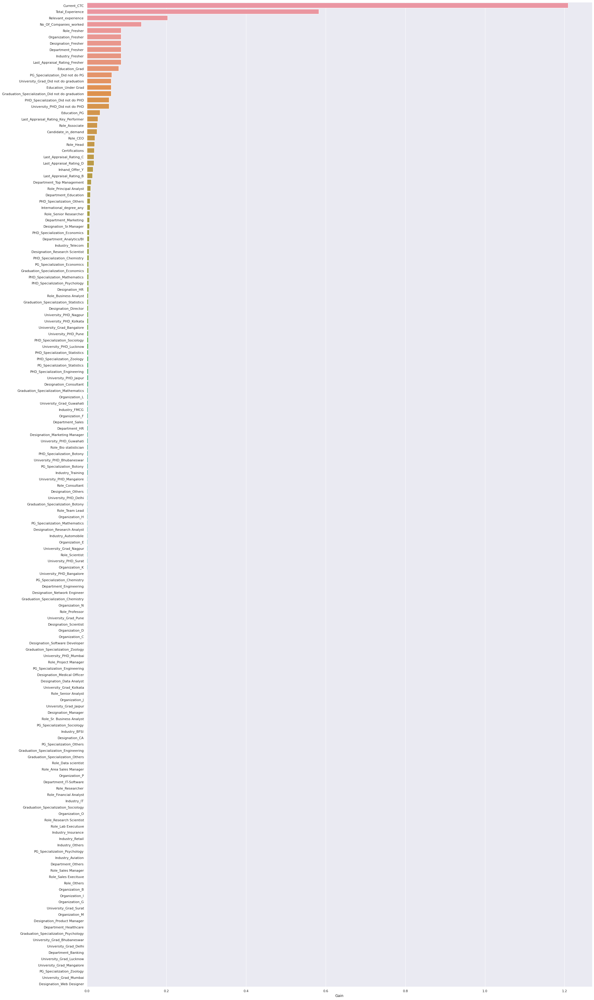

In [1071]:
fig,axes = plt.subplots(nrows=1,ncols=1,figsize=(30,60))
sns.barplot(x=data["Gain"],y=data.index)

In [1072]:
#Eliminating all the features which do not convey any information about the outcome at all

In [1073]:
zero_gain_features=data.loc[data["Gain"]==0].index.tolist()
len(zero_gain_features)

25

In [1074]:
zero_gain_features

['Industry_Insurance',
 'Industry_Retail',
 'Industry_Others',
 'PG_Specialization_Psychology',
 'Industry_Aviation',
 'Department_Others',
 'Role_Sales Manager',
 'Role_Sales Execituve',
 'Role_Others',
 'Organization_B',
 'Organization_I',
 'Organization_G',
 'University_Grad_Surat',
 'Organization_M',
 'Designation_Product Manager',
 'Department_Healthcare',
 'Graduation_Specialization_Psychology',
 'University_Grad_Bhubaneswar',
 'University_Grad_Delhi',
 'Department_Banking',
 'University_Grad_Lucknow',
 'University_Grad_Mangalore',
 'PG_Specialization_Zoology',
 'University_Grad_Mumbai',
 'Designation_Web Designer']

In [1075]:
X_dummy_train.drop(columns=zero_gain_features,inplace=True,axis=1)

In [1076]:
X_test_dummy.drop(columns=zero_gain_features,inplace=True,axis=1)

In [1077]:
#X_dummy.drop(columns=zero_gain_features,inplace=True,axis=1)
print(X_dummy.shape)

(22560, 156)


In [1078]:
# Out of 145, 23 features were dropped as they were not conveying any information about the outcome at all

In [1079]:
df.drop(columns=["Candidate_in_demand"],axis=1,inplace=True)

In [1080]:
df["Inhand_Offer"] = df["Inhand_Offer"].map({"N":0,"Y":1})

In [1081]:
df1 = df.copy()

In [1082]:
df = df1.copy()

In [1083]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'University_Grad', 'PG_Specialization',
       'PHD_Specialization', 'University_PHD', 'Current_CTC', 'Inhand_Offer',
       'Last_Appraisal_Rating', 'No_Of_Companies_worked', 'Certifications',
       'International_degree_any', 'Expected_CTC'],
      dtype='object')

In [1084]:
##Removing features like University_Grad and University_PHD. As these features anyway bring some biasness to the result
df.drop(columns=['University_Grad','University_PHD'],axis=1,inplace=True)

In [1085]:
df.columns

Index(['Total_Experience', 'Relevant_experience', 'Department', 'Role',
       'Industry', 'Organization', 'Designation', 'Education',
       'Graduation_Specialization', 'PG_Specialization', 'PHD_Specialization',
       'Current_CTC', 'Inhand_Offer', 'Last_Appraisal_Rating',
       'No_Of_Companies_worked', 'Certifications', 'International_degree_any',
       'Expected_CTC'],
      dtype='object')

### Modeling starts

In [1087]:
#1. Linear Regression

#Pre-processing the data for Linear Regression

df.replace(to_replace="Sr. Business Analyst",value="Senior Business Analyst",inplace=True)
df.replace(to_replace='Sr.Manager',value="Senior Manager",inplace=True)
df.replace(to_replace='Analytics/BI',value="Analytics or BI",inplace=True)
df.replace(to_replace='IT-Software',value="IT and Software",inplace=True)

In [1088]:
##Saving a copy of dataframe before one-hot encoding the dataframe
data = df.copy()

In [1157]:
df = data.copy()

In [1159]:
#One-hotencoding

def ohe(df):
  cat_col = df.select_dtypes(exclude=[np.number]).columns.tolist()
  df = pd.get_dummies(data=df,columns=cat_col)
  new = []
  for i in df.columns:
    new.append("_".join(i.split()))
  for (i,j) in zip(df.columns,new):
    df.rename(columns={i:j},inplace=True)
  return df,list(df.columns)

In [1160]:
df,list1 = ohe(df)

In [1161]:
df.shape

(22560, 140)

In [1162]:
df_139 = df.copy()

In [1163]:
print("At the first instance after doing one-hot encoding the dataset has {} features".format((df.shape[1])-1))

At the first instance after doing one-hot encoding the dataset has 139 features


In [1164]:
#Removing some of the columns to compare the coefficients of the features against
cols = ['Department_Others','Role_Others','Industry_Others','Organization_O','Education_Grad','Graduation_Specialization_Did_not_do_graduation','Designation_Others','Last_Appraisal_Rating_D']

In [1165]:
#Dropping the columns
def cols_to_be_dropped(df,cols):
  df.drop(columns=cols,axis=1,inplace=True)
  return df

In [1166]:
df=cols_to_be_dropped(df,cols)

In [1167]:
print("After removing some columns from the dataset against which the coefficients of the feature can be compared the dataset has {} features".format((df.shape[1])-1))

After removing some columns from the dataset against which the coefficients of the feature can be compared the dataset has 131 features


### VIF

In [1168]:
import statsmodels.formula.api as sm
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    VIF = []
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        VIF.append(vif)
        #print (xvar_names[i], " VIF = " , vif)
    df = pd.DataFrame(index=xvar_names,data=VIF,columns=["VIF"])
    return df.sort_values(by='VIF',ascending=False)

In [1169]:
input_data = df.drop(columns=["Expected_CTC",'PHD_Specialization_Others','Organization_Fresher','PG_Specialization_Did_not_do_PG','PG_Specialization_Others','Role_Fresher', 'Industry_Fresher', 'Department_Fresher','PHD_Specialization_Did_not_do_PHD','Graduation_Specialization_Others','Designation_Fresher'],axis=1)

In [1170]:
input_data.shape

(22560, 121)

In [1171]:
VIF_df = vif_cal(input_data)

In [1172]:
VIF_df.loc[VIF_df["VIF"]==np.inf].shape

(0, 1)

In [1173]:
##Observation : 
#After running 1st iteration, 31 features had infinite VIF which means they were completely explained by rest of the features
#After running 2nd iteration where 'PHD_Specialization_Others' was removed, 20 features had infinite VIF
#In the 3rd iteration i.e., after running 2nd iteration I decided to drop 'Organization_Fresher', 'Role_Fresher', 'Industry_Fresher', 'Department_Fresher' because having 'Last_Appraisal_Rating_Fresher'
#will give me sufficient information i.e., candidate is a fresher. Doing so, 16 features had infinite VIF
#In the 4th iteration 'PHD_Specialization_Did_not_do_PHD' was removed, 14 features had infinite VIF
#In the 5th iteration 'Graduation_Specialization_Others','Designation_Fresher' were removed, 0 features had infinite VIF

In [1174]:
VIF_df.loc[VIF_df["VIF"]==np.inf].index

Index([], dtype='object')

In [1175]:
VIF_df.sort_values(by="VIF",ascending=False).head(30)

,VIF
Education_Doctorate,7.80
Education_Under_Grad,6.65
Graduation_Specialization_Chemistry,6.12
PG_Specialization_Chemistry,6.11
Graduation_Specialization_Economics,5.75
PG_Specialization_Mathematics,5.74
Graduation_Specialization_Statistics,5.74
PG_Specialization_Statistics,5.71
PG_Specialization_Economics,5.67
PG_Specialization_Engineering,5.64


In [1176]:
#features removed to bring the VIF down to less than 10
VIF_Features=['PHD_Specialization_Others','Organization_Fresher','PG_Specialization_Did_not_do_PG','PG_Specialization_Others','Role_Fresher', 'Industry_Fresher', 'Department_Fresher','PHD_Specialization_Did_not_do_PHD','Graduation_Specialization_Others','Designation_Fresher']

#### Statsmodels

In [1177]:
def model(target,features,df):
  import statsmodels.formula.api as sm
  formula = str(target)+"~"+"+".join(features)
  model = sm.ols(formula,df).fit()
  return model

In [1178]:
features = df.drop(columns=["Expected_CTC",'PHD_Specialization_Others','Organization_Fresher','PG_Specialization_Did_not_do_PG','PG_Specialization_Others','Role_Fresher', 'Industry_Fresher', 'Department_Fresher','PHD_Specialization_Did_not_do_PHD','Graduation_Specialization_Others','Designation_Fresher'],axis=1).columns.tolist()

In [1179]:
print("For OLS {} features were given to the dataset".format(len(features)))

For OLS 121 features were given to the dataset


In [1180]:
model=model('Expected_CTC',features,df)

In [1181]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Expected_CTC   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 4.535e+04
Date:                Mon, 03 Oct 2022   Prob (F-statistic):               0.00
Time:                        21:38:08   Log-Likelihood:            -2.8453e+05
No. Observations:               22560   AIC:                         5.693e+05
Df Residuals:                   22438   BIC:                         5.703e+05
Df Model:                         121                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                             -2.004e+05   4941.736    -40.544      0.000    -2.1e+05   -1.91e+05
Total_Experience                      -1684.6454    151.536    -11.117      0.000   -1981.666   -1387.625
Relevant_experience                       5.1235    109.746      0.047      0.963    -209.986     220.233
Current_CTC                               1.2685      0.001   1024.392      0.000       1.266       1.271
Inhand_Offer                           5.673e+04   1306.414     43.426      0.000    5.42e+04    5.93e+04
No_Of_Companies_worked                   37.7253    331.112      0.114      0.909    -611.277     686.728
Certifications                          -61.7374    477.678     -0.129      0.897    -998.020     874.545
International_degree_any               1195.8713   2406.758      0.497      0.619   -3521.542    5913.284
Department_Accounts                    4713.2501   2811.440      1.676      0.094    -797.368    1.02e+04
Department_Analytics_or_BI             1723.9623   2422.900      0.712      0.477   -3025.092    6473.016
Department_Banking                     2669.5870   2371.077      1.126      0.260   -1977.889    7317.063
Department_Education                   5008.8313   2390.325      2.095      0.036     323.628    9694.035
Department_Engineering                  -31.8776   2364.918     -0.013      0.989   -4667.282    4603.527
Department_HR                          1595.1979   2340.227      0.682      0.495   -2991.810    6182.206
Department_Healthcare                  2291.2255   2374.863      0.965      0.335   -2363.672    6946.123
Department_IT_and_Software                4.8317   2838.357      0.002      0.999   -5558.546    5568.209
Department_Marketing                   4356.3222   2226.999      1.956      0.050      -8.752    8721.396
Department_Sales                       1693.6054   2344.443      0.722      0.470   -2901.667    6288.878
Department_Top_Management              -746.4830   2666.565     -0.280      0.780   -5973.137    4480.171
Role_Analyst                           2629.0633   2451.326      1.073      0.284   -2175.707    7433.833
Role_Area_Sales_Manager                5893.8391   7232.273      0.815      0.415   -8281.920    2.01e+04
Role_Associate                         1674.1932   3307.822      0.506      0.613   -4809.368    8157.755
Role_Bio_statistician                  3557.0186   2439.585      1.458      0.145   -1224.737    8338.775
Role_Business_Analyst                  1277.7579   2541.758      0.503      0.615   -3704.264    6259.780
Role_CEO                              -3139.4310   3102.920     -1.012      0.312   -9221.371    2942.509
Role_Consultant                        4145.2585   2485.928      1.667      0.095    -727.334    9017.851
Role_Data

In [1182]:
## There is still some multicollinearity problems but as the features having high VIF are seemingly important in predicting the target
# we will go ahead with this model and use ridge/lasso to work with multicollinearity/feature selection respectively

In [1183]:
df.drop(columns=['PHD_Specialization_Others','Organization_Fresher','PG_Specialization_Did_not_do_PG','PG_Specialization_Others','Role_Fresher', 'Industry_Fresher', 'Department_Fresher','PHD_Specialization_Did_not_do_PHD','Graduation_Specialization_Others','Designation_Fresher'],axis=1,inplace=True)

In [1184]:
df_VIF_eliminated = df.copy()

In [1185]:
print(df_139.shape)
print(df_VIF_eliminated.shape)

(22560, 140)
(22560, 122)


#### Significant features

In [1186]:
def generating_coef_table(lr_mod):
  coef_table =pd.read_html(lr_mod.summary2().as_html())[1]
  coef_table.drop(0,axis=0,inplace=True)
  coef_table.columns = ["var_name","coef","std_err","t_stat","p_val","cof_25","conf_975"]
  sig_features = list(coef_table.loc[coef_table["p_val"].astype('float') <= 0.05, "var_name"].values)
  sig_features = [x for x in sig_features if x != "Intercept"]
  sig_coef=coef_table.loc[coef_table["var_name"].isin(sig_features),["var_name","coef"]]
  sig_coef["coef"]=sig_coef["coef"].astype('float')
  #return sig_coef
  import seaborn as sns
  import matplotlib.pyplot as plt
  plt.figure(figsize=(12,12))
  p=sns.barplot(y=sig_coef["var_name"],x=sig_coef["coef"],order=sig_coef.sort_values(by="coef",ascending=False).var_name)
  p.set_title("Coefficients of the significant features")
  p.set_xlabel("Coefficients")
  p.set_ylabel("Name of the features")
  sns.set_style('darkgrid')
  plt.show()
  return sig_features

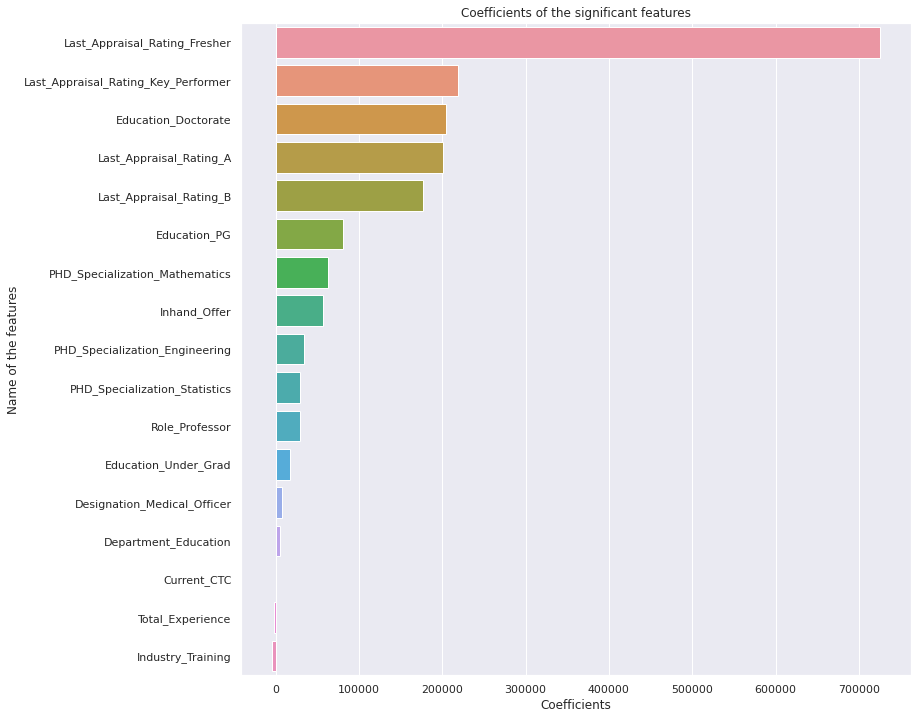

In [1187]:
#Assessing the features which were significant. Out of 121 features, 17 features were significant
sig_coef=generating_coef_table(model)
#sig_coef.var_name.unique()

In [1188]:
sig_features_lr=sig_coef
len(sig_features_lr)

17

In [1189]:
print("When {} features were given to the dataset, {} were only significant".format(len(features),len(sig_features_lr)))

When 121 features were given to the dataset, 17 were only significant


### Model's predictive performance

In [1190]:
print("At this instance, I am giving all the features even without drop_first setting true i.e., this dataset has {} features".format(df_139.shape[1]-1))

At this instance, I am giving all the features even without drop_first setting true i.e., this dataset has 139 features


In [1191]:
X = df_139.drop(columns=["Expected_CTC"],axis=1)
Y = df_139["Expected_CTC"]
X1 = df_VIF_eliminated.drop(columns=["Expected_CTC"],axis=1)
Y1 = df_VIF_eliminated["Expected_CTC"]

In [1192]:
from sklearn.metrics import r2_score
def linear_regression(X,Y,model_name):
  from sklearn.linear_model import LinearRegression
  from sklearn.model_selection import train_test_split
  X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)
  lr = LinearRegression()
  lr.fit(X_train,Y_train)
  train_pred = lr.predict(X_train)
  test_pred = lr.predict(X_test)
  from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error,mean_absolute_error
  rmse_train = mean_squared_error(train_pred,Y_train,squared=False)
  mae_train = mean_absolute_error(train_pred,Y_train)
  mape_train = mean_absolute_percentage_error(train_pred,Y_train)
  r_sq_train = r2_score(train_pred,Y_train)
  rmse_test = mean_squared_error(test_pred,Y_test,squared=False)
  mae_test = mean_absolute_error(test_pred,Y_test)
  mape_test = mean_absolute_percentage_error(test_pred,Y_test)
  r_sq_test = r2_score(test_pred,Y_test)
  Metrics1 = pd.DataFrame(index=["Train_RMSE","Test_RMSE","Train_MAE","Test_MAE","Train R-squared","Test R-squared"],columns=[model_name],data=[rmse_train,rmse_test,mae_train,mae_test,r_sq_train,r_sq_test])
  return Metrics1

In [1193]:
Metrics = pd.DataFrame()

In [1194]:
Metrics=linear_regression(X,Y,"LR:with 139 features")
Metrics

,LR:with 139 features
Train_RMSE,72904.69
Test_RMSE,72194.49
Train_MAE,48942.48
Test_MAE,49055.30
Train R-squared,1.00
Test R-squared,1.00


In [1195]:
Metrics2=linear_regression(X1,Y1,"LR:with no infinite VIF")
Metrics = pd.concat([Metrics,Metrics2],axis=1)

In [1196]:
Metrics

,LR:with 139 features,LR:with no infinite VIF
Train_RMSE,72904.69,72912.74
Test_RMSE,72194.49,72192.82
Train_MAE,48942.48,48922.12
Test_MAE,49055.30,49047.15
Train R-squared,1.00,1.00
Test R-squared,1.00,1.00


In [1197]:
#As the train and test R-squared are perfect 1. It is clear that the model is overfitting a bit

### Tackling overfitting 

In [1198]:
#Strategy #1: Capping outliers

def number_of_outliers(df):
    IQR = df.quantile(0.75) - df.quantile(0.25)
    Number = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR)))).sum()
    Outlier = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR))))
    dataframe = pd.DataFrame({"Number of Outliers":Number})
    return (dataframe.sort_values(by="Number of Outliers",ascending=False))

In [1199]:
outliers=number_of_outliers(data)

In [1200]:
outliers

,Number of Outliers
Certifications,2943
International_degree_any,1860
Relevant_experience,105
Department,0
Designation,0
Education,0
Expected_CTC,0
Graduation_Specialization,0
Industry,0
Inhand_Offer,0


In [1201]:
# There aren't many outliers to cap. Whatever, there are they are present in discrete features so I decided not to cap them

In [1202]:
# Strategy #2: Regularization

from sklearn.linear_model import Ridge,RidgeCV

In [1203]:
rcv = RidgeCV()

In [1204]:
X = df_139.drop(columns=["Expected_CTC"],axis=1)
Y = df_139["Expected_CTC"]

In [1205]:
#Scaling the data
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_sc = pd.DataFrame(data=ss.fit_transform(X),columns=X.columns)

In [1206]:
len(X_sc.columns)

139

In [1207]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=10)

In [1208]:
#rcv=RidgeCV(np.linspace(0.001,30,2000),cv=kf,scoring=None)
#rcv.fit(X_sc,Y)

In [1209]:
#rcv.alpha_

In [1210]:
#Best alpha over the range of 0.001 to 30 came out to be 1.01

In [1211]:
best_ridge = Ridge(alpha=1.01)

In [1212]:
from sklearn.metrics import r2_score
def ridge_regression(X,Y,alpha,model_name):
  from sklearn.linear_model import LinearRegression
  from sklearn.model_selection import train_test_split
  X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)
  ridge = Ridge(alpha=alpha)
  ridge.fit(X_train,Y_train)
  train_pred = ridge.predict(X_train)
  test_pred = ridge.predict(X_test)
  from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error,mean_absolute_error
  rmse_train = mean_squared_error(train_pred,Y_train,squared=False)
  mae_train = mean_absolute_error(train_pred,Y_train)
  mape_train = mean_absolute_percentage_error(train_pred,Y_train)
  r_sq_train = r2_score(train_pred,Y_train)
  rmse_test = mean_squared_error(test_pred,Y_test,squared=False)
  mae_test = mean_absolute_error(test_pred,Y_test)
  mape_test = mean_absolute_percentage_error(test_pred,Y_test)
  r_sq_test = r2_score(test_pred,Y_test)
  Metrics1 = pd.DataFrame(index=["Train_RMSE","Test_RMSE","Train_MAE","Test_MAE","Train R-squared","Test R-squared"],columns=[model_name],data=[rmse_train,rmse_test,mae_train,mae_test,r_sq_train,r_sq_test])
  features = X_train.columns
  return Metrics1,ridge,features,X_train

In [1217]:
Metrics2,ridge_alpha_10,features,X_train=ridge_regression(X_sc,Y,10,"Ridge:alpha=10")
Metrics = pd.concat([Metrics,Metrics2],axis=1)

In [1218]:
Metrics

,LR:with 139 features,LR:with no infinite VIF,Ridge:alpha=5,Ridge:alpha=10
Train_RMSE,72904.69,72912.74,72909.60,72924.20
Test_RMSE,72194.49,72192.82,72196.56,72208.38
Train_MAE,48942.48,48922.12,48918.82,48904.44
Test_MAE,49055.30,49047.15,49022.77,48997.18
Train R-squared,1.00,1.00,1.00,1.00
Test R-squared,1.00,1.00,1.00,1.00


In [ ]:
#Since not much difference is coming in the difference between train RMSE and test RMSE or train MAE & test MAE. 
#Therefore, we will go with alpha = 5

#### Assessing the coefficients of the features from ridge regression

In [1219]:
!pip install regressors

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1220]:
import regressors

In [1221]:
from regressors import stats

In [ ]:
#Assessing the same for alpha = 5
ridge = Ridge(alpha=5)

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X_sc,Y,test_size=0.3,random_state=1)

In [ ]:
ridge.fit(X_train,Y_train)

Ridge(alpha=5)

In [ ]:
pval=stats.coef_pval(ridge,X_train,Y_train)

In [ ]:
pval_df = pd.DataFrame(data=pval,index=df_109.columns,columns=["p_val"])

In [ ]:
sig_features_ridge_df=pval_df.loc[pval_df["p_val"]<=0.05]

In [ ]:
sig_features_ridge = sig_features_ridge_df.index

In [ ]:
ridge_coef = pd.DataFrame(index=features,columns=["coef"],data=ridge.coef_)

In [ ]:
sig_features_coef=ridge_coef.loc[sig_features_ridge,:]

In [ ]:
sig_features_coef.shape

(35, 1)

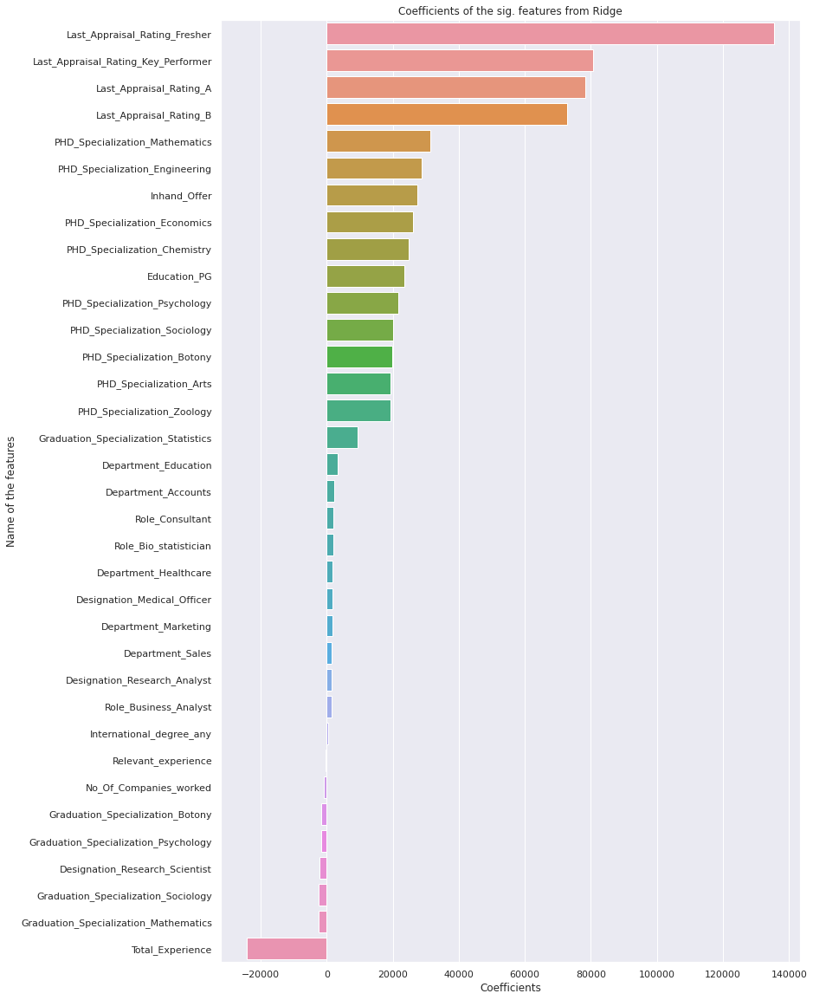

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,20))
p=sns.barplot(y=sig_features_coef.index,x=sig_features_coef["coef"],order=sig_features_coef.sort_values(by="coef",ascending=False).index)
p.set_title("Coefficients of the sig. features from Ridge")
p.set_xlabel("Coefficients")
p.set_ylabel("Name of the features")
sns.set_style('darkgrid')
plt.show()

In [ ]:
#Out of 109 features, 35 features are significant

In [ ]:
add_sig_features=[]
for i in sig_features_ridge:
  if i not in sig_features_lr:
    add_sig_features.append(i)
    

In [ ]:
#features significant according to Ridge but not so according to linear
add_sig_features

['Relevant_experience',
 'No_Of_Companies_worked',
 'International_degree_any',
 'Department_Healthcare',
 'Department_Sales',
 'Role_Bio_statistician',
 'Role_Business_Analyst',
 'Role_Consultant',
 'Graduation_Specialization_Botony',
 'Graduation_Specialization_Psychology',
 'Graduation_Specialization_Sociology']

In [ ]:
add_sig_features1=[]
for i in sig_features_lr:
  if i not in sig_features_ridge:
    add_sig_features1.append(i)

In [ ]:
#features significant according to LR but not so according to Ridge
add_sig_features1

['Current_CTC', 'Certifications', 'Role_Head']

#### Lasso regression : Seeing if this will help in reducing the difference between the train and test metrics

In [ ]:
from sklearn.linear_model import Lasso,LassoCV

In [ ]:
lcv = LassoCV(alphas=np.linspace(0.0001,30,2000),cv=kf)
lcv.fit(X_sc,Y)

LassoCV(alphas=array([1.00000000e-04, 1.51074537e-02, 3.01149075e-02, ...,
       2.99699851e+01, 2.99849925e+01, 3.00000000e+01]),
        cv=KFold(n_splits=10, random_state=None, shuffle=False))

In [ ]:
lcv.alpha_

29.984992546273133

In [ ]:
from sklearn.metrics import r2_score
def lasso_regression(X,Y,alpha,model_name):
  from sklearn.linear_model import LinearRegression
  from sklearn.model_selection import train_test_split
  X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)
  lasso = Lasso(alpha=alpha)
  lasso.fit(X_train,Y_train)
  train_pred = lasso.predict(X_train)
  test_pred = lasso.predict(X_test)
  from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error,mean_absolute_error
  rmse_train = mean_squared_error(train_pred,Y_train,squared=False)
  mae_train = mean_absolute_error(train_pred,Y_train)
  mape_train = mean_absolute_percentage_error(train_pred,Y_train)
  r_sq_train = r2_score(train_pred,Y_train)
  rmse_test = mean_squared_error(test_pred,Y_test,squared=False)
  mae_test = mean_absolute_error(test_pred,Y_test)
  mape_test = mean_absolute_percentage_error(test_pred,Y_test)
  r_sq_test = r2_score(test_pred,Y_test)
  Metrics1 = pd.DataFrame(index=["Train_RMSE","Test_RMSE","Train_MAE","Test_MAE","Train R-squared","Test R-squared"],columns=[model_name],data=[rmse_train,rmse_test,mae_train,mae_test,r_sq_train,r_sq_test])
  features = X_train.columns
  return Metrics1,lasso,features,X_train

In [ ]:
Metrics2,lasso_alpha_best,features,X_train=lasso_regression(X_sc,Y,lcv.alpha_,"Lasso:best")
Metrics = pd.concat([Metrics,Metrics2],axis=1)

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best
Train_RMSE,71944.33,81056.73,81061.19,81059.09
Test_RMSE,73825.19,83581.19,83583.49,83559.56
Train_MAE,48826.28,56410.65,56363.26,56399.75
Test_MAE,49343.86,56969.58,56925.04,56935.88
Train R-squared,1.00,0.99,0.99,0.99
Test R-squared,1.00,0.99,0.99,0.99


In [ ]:
lasso_coef = pd.DataFrame(index=X_train.columns,columns=["coef"],data=lasso_alpha_best.coef_)

In [ ]:
zero_coef=lasso_coef.loc[lasso_coef["coef"]==0].index.tolist()

In [ ]:
X2 = X_sc.copy()

In [ ]:
X2.drop(columns=zero_coef,axis=1,inplace=True)

In [ ]:
Metrics2,lasso_alpha_best,features,X_train=lasso_regression(X_sc,Y,lcv.alpha_,"Lasso:zero_coef removed")
Metrics = pd.concat([Metrics,Metrics2],axis=1)

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88
Train R-squared,1.00,0.99,0.99,0.99,0.99
Test R-squared,1.00,0.99,0.99,0.99,0.99


##### Assessing the coefficients of the features from ridge regression

In [ ]:
from regressors import stats

In [ ]:
#Assessing the same for alpha = 29.98
lasso = Lasso(alpha=lcv.alpha_)

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X_sc,Y,test_size=0.3,random_state=1)

In [ ]:
lasso.fit(X_train,Y_train)

Lasso(alpha=29.984992546273133)

In [ ]:
pval=stats.coef_pval(lasso,X_train,Y_train)

In [ ]:
pval_df = pd.DataFrame(data=pval,index=df_109.columns,columns=["p_val"])

In [ ]:
sig_features_lasso_df=pval_df.loc[pval_df["p_val"]<=0.05]

In [ ]:
sig_features_lasso = sig_features_lasso_df.index

In [ ]:
lasso_coef = pd.DataFrame(index=features,columns=["coef"],data=lasso.coef_)
sig_features_coef=lasso_coef.loc[sig_features_lasso,:]
sig_features_coef.shape

(30, 1)

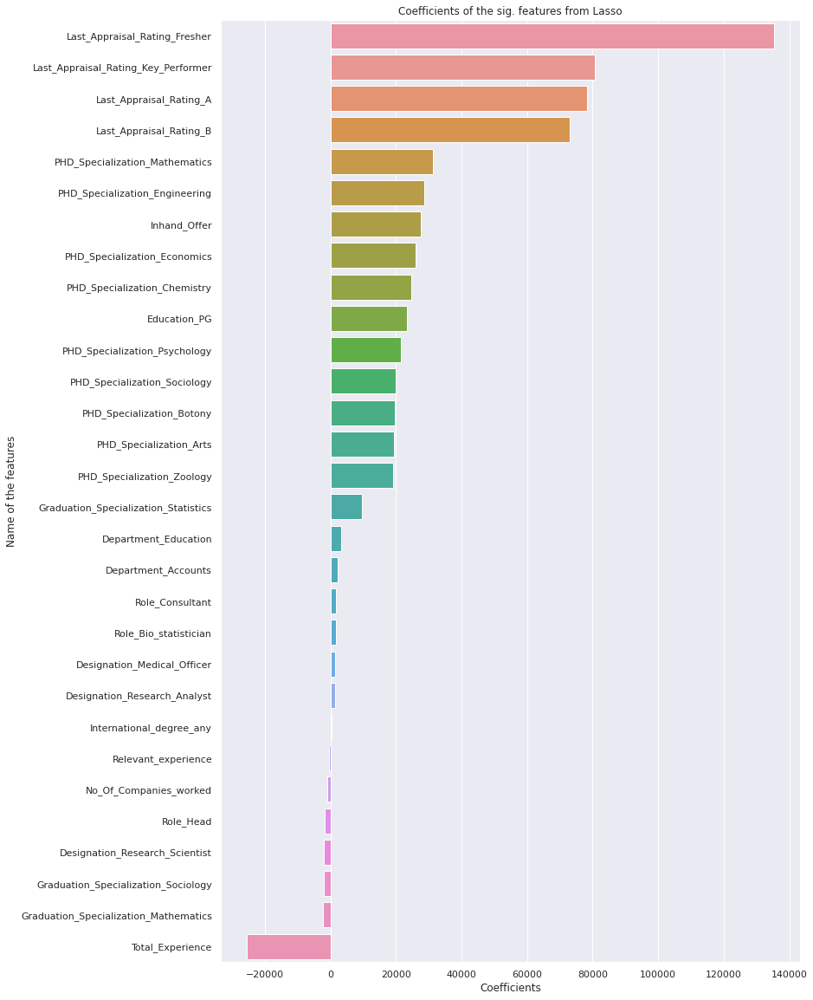

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,20))
p=sns.barplot(y=sig_features_coef.index,x=sig_features_coef["coef"],order=sig_features_coef.sort_values(by="coef",ascending=False).index)
p.set_title("Coefficients of the sig. features from Lasso")
p.set_xlabel("Coefficients")
p.set_ylabel("Name of the features")
sns.set_style('darkgrid')
plt.show()


In [ ]:
print("Out of 109 features, {} features are significant".format(len(sig_features_lasso)))

Out of 109 features, 30 features are significant


In [ ]:
add_sig_features=[]
for i in sig_features_lasso:
  if i not in sig_features_lr:
    add_sig_features.append(i)

In [ ]:
#features significant according to Lasso but not so according to linear
add_sig_features

['Relevant_experience',
 'No_Of_Companies_worked',
 'International_degree_any',
 'Role_Bio_statistician',
 'Role_Consultant',
 'Graduation_Specialization_Sociology']

In [ ]:
add_sig_features1=[]
for i in sig_features_lr:
  if i not in sig_features_lasso:
    add_sig_features1.append(i)

In [ ]:
#features significant according to LR but not so according to Lasso
add_sig_features1

['Current_CTC', 'Certifications', 'Department_Marketing']

##### Conclusion
###### Linear regression models be it OLS,Lasso,or Ridge have more or less same accuracy but the significance of coefficients is varying this issue can be sorted by sampling more data

In [ ]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error

In [ ]:
def metrics(Y_test,test_pred):
  rmse = mean_squared_error(Y_test,test_pred,squared=False)
  mae = mean_absolute_error(Y_test,test_pred)
  mape = mean_absolute_percentage_error(Y_test,test_pred)
  return rmse,mae,mape

#### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
X = df_127.drop("Expected_CTC",axis=1)
Y = df_127["Expected_CTC"]

In [ ]:
print(X.shape)
print(Y.shape)

(23082, 127)
(23082,)


In [ ]:
dtr = DecisionTreeRegressor()

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(16157, 127)
(6925, 127)
(16157,)
(6925,)


In [ ]:
dtr.fit(X_train,Y_train)

DecisionTreeRegressor()

In [ ]:
train_pred_dtr = dtr.predict(X_train)
test_pred_dtr = dtr.predict(X_test)
rmse_train_dtr,mae_train_dtr,mape_train_dtr=metrics(Y_train,train_pred_dtr)
rmse_test_dtr,mae_test_dtr,mape_test_dtr=metrics(Y_test,test_pred_dtr)
r_sq_dtr_train = r2_score(Y_train,train_pred_dtr)
r_sq_dtr_test = r2_score(Y_test,test_pred_dtr)

In [ ]:
Metrics2 = pd.DataFrame(index=["Train_RMSE","Test_RMSE","Train_MAE","Test_MAE","Train R-squared","Test R-squared"],columns=["Decision tree : default"],data=[rmse_train_dtr,rmse_test_dtr,mae_train_dtr,mae_test_dtr,r_sq_dtr_train,r_sq_dtr_test])

In [ ]:
Metrics = pd.concat([Metrics,Metrics2],axis=1)

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00


In [ ]:
#Seeing the huge difference between train and test mae, this is clear that the model is overfitted.
#Moving forward with hyperparameter tuning to deal with overfitting

In [ ]:
#Optuna
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 5.1 MB/s 
     |████████████████████████████████| 81 kB 9.1 MB/s 
     |████████████████████████████████| 209 kB 65.9 MB/s 
     |████████████████████████████████| 78 kB 6.8 MB/s 
     |████████████████████████████████| 49 kB 6.0 MB/s 
     |████████████████████████████████| 112 kB 67.2 MB/s 
     |████████████████████████████████| 147 kB 55.1 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=a12fdd0f55c2dc284f3cc814f01cae0233dde755b166403bf5dd9c9fbf072d23
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import optuna

In [ ]:
dtr = DecisionTreeRegressor()

In [ ]:
from sklearn.model_selection import KFold

In [ ]:
def objective(trial,data=X,target=Y):
    max_depth=trial.suggest_int("max_depth",3,15,step=1)
    min_samples_leaf=trial.suggest_int("min_samples_leaf",170,750,step=10)
    min_samples_split=trial.suggest_int("min_samples_split",340,1500,step=10)
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X,Y)):
      X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
      X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
      dtr = DecisionTreeRegressor(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split)
      dtr.fit(X_train,Y_train)
      preds = dtr.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [ ]:
study = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 19:01:30,829] A new study created in memory with name: rmse-min


In [ ]:
study.optimize(objective,n_trials=100)

[I 2022-10-03 19:01:32,347] Trial 0 finished with value: 153105.17398030643 and parameters: {'max_depth': 7, 'min_samples_leaf': 470, 'min_samples_split': 740}. Best is trial 0 with value: 153105.17398030643.
[I 2022-10-03 19:01:33,826] Trial 1 finished with value: 158985.5966899541 and parameters: {'max_depth': 8, 'min_samples_leaf': 630, 'min_samples_split': 860}. Best is trial 0 with value: 153105.17398030643.
[I 2022-10-03 19:01:35,169] Trial 2 finished with value: 157688.92667333345 and parameters: {'max_depth': 9, 'min_samples_leaf': 600, 'min_samples_split': 780}. Best is trial 0 with value: 153105.17398030643.
[I 2022-10-03 19:01:36,108] Trial 3 finished with value: 213822.9095158365 and parameters: {'max_depth': 3, 'min_samples_leaf': 340, 'min_samples_split': 740}. Best is trial 0 with value: 153105.17398030643.
[I 2022-10-03 19:01:37,495] Trial 4 finished with value: 159545.20810476184 and parameters: {'max_depth': 6, 'min_samples_leaf': 640, 'min_samples_split': 860}. Best 

In [ ]:
study.best_trial

FrozenTrial(number=86, values=[117691.09424557032], datetime_start=datetime.datetime(2022, 10, 3, 19, 4, 7, 481871), datetime_complete=datetime.datetime(2022, 10, 3, 19, 4, 9, 200632), params={'max_depth': 10, 'min_samples_leaf': 170, 'min_samples_split': 520}, distributions={'max_depth': IntDistribution(high=15, log=False, low=3, step=1), 'min_samples_leaf': IntDistribution(high=750, log=False, low=170, step=10), 'min_samples_split': IntDistribution(high=1500, log=False, low=340, step=10)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=86, state=TrialState.COMPLETE, value=None)

In [ ]:
study.best_params

{'max_depth': 10, 'min_samples_leaf': 170, 'min_samples_split': 520}

In [ ]:
best_decision_tree = DecisionTreeRegressor(**study.best_params)

In [ ]:
best_decision_tree.fit(X_train,Y_train)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=170, min_samples_split=520)

In [ ]:
train_pred_dtr = best_decision_tree.predict(X_train)
test_pred_dtr = best_decision_tree.predict(X_test)
rmse_train_dtr,mae_train_dtr,mape_train_dtr=metrics(Y_train,train_pred_dtr)
rmse_test_dtr,mae_test_dtr,mape_test_dtr=metrics(Y_test,test_pred_dtr)
r_sq_dtr_train = r2_score(Y_train,train_pred_dtr)
r_sq_dtr_test = r2_score(Y_test,test_pred_dtr)

In [ ]:
Metrics["Decision tree : tuned"] = [rmse_train_dtr,rmse_test_dtr,mae_train_dtr,mae_test_dtr,r_sq_dtr_train,r_sq_dtr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99


In [ ]:
#Decision tree : 
#Tuned decision tree is highly inaccurate with MAPE and RMSE far greater than Linear regression

##### RandomForest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rfr = RandomForestRegressor()

In [ ]:
rfr.fit(X_train,Y_train)

RandomForestRegressor()

In [ ]:
train_pred_rfr = rfr.predict(X_train)
test_pred_rfr = rfr.predict(X_test)
rmse_train_rfr,mae_train_rfr,mape_train_rfr=metrics(Y_train,train_pred_rfr)
rmse_test_rfr,mae_test_rfr,mape_test_rfr=metrics(Y_test,test_pred_rfr)
r_sq_rfr_train = r2_score(Y_train,train_pred_rfr)
r_sq_rfr_test = r2_score(Y_test,test_pred_rfr)

In [ ]:
Metrics["Random forest : default"] = [rmse_train_rfr,rmse_test_rfr,mae_train_rfr,mae_test_rfr,r_sq_rfr_train,r_sq_rfr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00


In [ ]:
#Again the model is overfitted. So, using optuna to do the hyperparameter search here

In [ ]:
def objective(trial,data=X,target=Y):
    max_depth=trial.suggest_int("max_depth",3,15,step=1)
    min_samples_leaf=trial.suggest_int("min_samples_leaf",170,750,step=10)
    min_samples_split=trial.suggest_int("min_samples_split",340,1500,step=10)
    n_estimators=trial.suggest_int("n_estimators",100,1000,step=1)
    max_features=trial.suggest_categorical("max_features",choices=["auto","sqrt","log2"])
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X,Y)):
      X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
      X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
      rfr = RandomForestRegressor(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,max_features=max_features,n_estimators=n_estimators,n_jobs=-1)
      rfr.fit(X_train,Y_train)
      preds = rfr.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [ ]:
study = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 19:05:08,085] A new study created in memory with name: rmse-min


In [ ]:
#study.optimize(objective,n_trials=20)

In [ ]:
best_params = {'max_depth':6, 'min_samples_leaf':340, 'min_samples_split':590, 'n_estimators':578}

In [ ]:
rfr_gs = RandomForestRegressor(max_depth=6,min_samples_leaf=340,min_samples_split=590,n_estimators=578)

In [ ]:
rfr_gs.fit(X_train,Y_train)

RandomForestRegressor(max_depth=6, min_samples_leaf=340, min_samples_split=590,
                      n_estimators=578)

In [ ]:
train_pred_rfr = rfr_gs.predict(X_train)
test_pred_rfr = rfr_gs.predict(X_test)
rmse_train_rfr,mae_train_rfr,mape_train_rfr=metrics(Y_train,train_pred_rfr)
rmse_test_rfr,mae_test_rfr,mape_test_rfr=metrics(Y_test,test_pred_rfr)
r_sq_rfr_train = r2_score(Y_train,train_pred_rfr)
r_sq_rfr_test = r2_score(Y_test,test_pred_rfr)

In [ ]:
Metrics["Random forest:tuned"] = [rmse_train_rfr,rmse_test_rfr,mae_train_rfr,mae_test_rfr,r_sq_rfr_train,r_sq_rfr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55,151106.70
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48,154169.08
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48,112361.61
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60,114738.10
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98


###### Conclusion from random forest

In [ ]:
#The accuracy of the random forest model is very low. Therefore, we move onto next models

###### GradientBoosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
gbr = GradientBoostingRegressor()

In [ ]:
gbr.fit(X_train,Y_train)

GradientBoostingRegressor()

In [ ]:
train_pred_gbr = gbr.predict(X_train)
test_pred_gbr = gbr.predict(X_test)
rmse_train_gbr,mae_train_gbr,mape_train_gbr=metrics(Y_train,train_pred_gbr)
rmse_test_gbr,mae_test_gbr,mape_test_gbr=metrics(Y_test,test_pred_gbr)
r_sq_gbr_train = r2_score(Y_train,train_pred_gbr)
r_sq_gbr_test = r2_score(Y_test,test_pred_gbr)

In [ ]:
Metrics["GBR:default"] = [rmse_train_gbr,rmse_test_gbr,mae_train_gbr,mae_test_gbr,r_sq_gbr_train,r_sq_gbr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55,151106.70,36178.09
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48,154169.08,39782.06
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48,112361.61,22248.30
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60,114738.10,23629.61
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00


In [ ]:
#Default Gradient boosted tree regressor is a little overfitted but the degree of overfitting is less than what it was in Random forest default
# or decision tree default

In [ ]:
#Tuning Gradient boosted trees

In [ ]:
def objective(trial,data=X,target=Y):
  max_depth=trial.suggest_int("max_depth",3,15,step=1)
  min_samples_leaf=trial.suggest_int("min_samples_leaf",170,750,step=10)
  min_samples_split=trial.suggest_int("min_samples_split",340,1500,step=10)
  n_estimators=trial.suggest_int("n_estimators",100,1000,step=10)
  learning_rate=trial.suggest_float("learning_rate",1e-7,0.3,log=True)
  cv = KFold(n_splits=10,random_state=1,shuffle=True)
  cv_scores = []
  for (train_idx,test_idx) in (cv.split(X,Y)):
    X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
    X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
    gbr = GradientBoostingRegressor(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,n_estimators=n_estimators,
                                      learning_rate=learning_rate)
    gbr.fit(X_train,Y_train)
    preds = gbr.predict(X_test)
    rmse = mean_squared_error(Y_test,preds,squared=False)
    cv_scores.append(rmse)
  return np.mean(cv_scores)

In [ ]:
#study = optuna.create_study(direction="minimize",study_name="rmse-min")

In [ ]:
#study.optimize(objective,n_trials=20)

In [ ]:
best_params = {'max_depth': 9, 'min_samples_leaf': 200, 'min_samples_split': 1410, 'n_estimators': 660, 'learning_rate': 0.1426556087435088}

In [ ]:
gbr_gs = GradientBoostingRegressor(max_depth=9,min_samples_leaf=200,min_samples_split=1410,n_estimators=660,learning_rate=0.1426556087435088)

In [ ]:
gbr_gs.fit(X_train,Y_train)

GradientBoostingRegressor(learning_rate=0.1426556087435088, max_depth=9,
                          min_samples_leaf=200, min_samples_split=1410,
                          n_estimators=660)

In [ ]:
train_pred_gbr = gbr_gs.predict(X_train)
test_pred_gbr = gbr_gs.predict(X_test)
rmse_train_gbr,mae_train_gbr,mape_train_gbr=metrics(Y_train,train_pred_gbr)
rmse_test_gbr,mae_test_gbr,mape_test_gbr=metrics(Y_test,test_pred_gbr)
r_sq_gbr_train = r2_score(Y_train,train_pred_gbr)
r_sq_gbr_test = r2_score(Y_test,test_pred_gbr)

In [ ]:
Metrics["GBR:tuned"] = [rmse_train_gbr,rmse_test_gbr,mae_train_gbr,mae_test_gbr,r_sq_gbr_train,r_sq_gbr_test]

In [ ]:
pd.set_option('display.float_format',lambda x:"{:,.2f}".format(x))
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00


##### Conclusion about Gradient Boosted trees

In [ ]:
#The value of RMSE for test set has decreased once Gradient boosting was tuned. MAE went down by a lot.

#### XGBoost

In [ ]:
# !pip install optuna
# import optuna
#!pip install CatBoost
#import catboost

In [ ]:
import xgboost as xgb

In [ ]:
xgbr = xgb.XGBRegressor()

In [ ]:
xgbr.fit(X_train,Y_train)

[19:06:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [ ]:
train_pred_xgb = xgbr.predict(X_train)
test_pred_xgb = xgbr.predict(X_test)
rmse_train_xgb,mae_train_xgb,mape_train_xgb=metrics(Y_train,train_pred_xgb)
rmse_test_xgb,mae_test_xgb,mape_test_xgb=metrics(Y_test,test_pred_xgb)
r_sq_xgb_train = r2_score(Y_train,train_pred_xgb)
r_sq_xgb_test = r2_score(Y_test,test_pred_xgb)

In [ ]:
Metrics["XGB:default"] = [rmse_train_xgb,rmse_test_xgb,mae_train_xgb,mae_test_xgb,r_sq_xgb_train,r_sq_xgb_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86","36,219.46"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77","39,854.97"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24","21,730.14"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36","23,007.24"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00


In [ ]:
def objective(trial,data=X,target=Y):
  max_depth=trial.suggest_int("max_depth",12,15,step=1)
  min_samples_leaf=trial.suggest_int("min_samples_leaf",170,300,step=10)
  min_samples_split=trial.suggest_int("min_samples_split",500,1000,step=10)
  n_estimators=trial.suggest_int("n_estimators",700,1000,step=50)
  learning_rate=trial.suggest_float("learning_rate",0.03,0.3,log=True)
  min_child_weight=trial.suggest_int("min_child_weight",10,15,step=1)
  gamma = trial.suggest_float("gamma",1e-5,0.5,log=True)
  colsample_bytree=trial.suggest_categorical("colsample_bytree",[0.5,0.7,0.8,0.9])
  subsample = trial.suggest_categorical("subsample",[0.5,0.7,0.8,0.9])
  pruning_callback = optuna.integration.XGBoostPruningCallback(trial, "rmse")
  cv = KFold(n_splits=10,random_state=1,shuffle=True)
  cv_scores = []
  for (train_idx,test_idx) in (cv.split(X,Y)):
    X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
    X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
    xgbr = xgb.XGBRegressor(objective='reg:squarederror',max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,
                            learning_rate=learning_rate,n_estimators=n_estimators,min_child_weight=min_child_weight,
                            gamma=gamma,subsample=subsample,colsample_bytree=colsample_bytree)
    xgbr.fit(X_train,Y_train,eval_set=[(X_test,Y_test)],early_stopping_rounds=100,verbose=False)
    preds = xgbr.predict(X_test)
    rmse = mean_squared_error(Y_test,preds,squared=False)
    cv_scores.append(rmse)
  return np.mean(cv_scores)

In [ ]:
study_xgb = optuna.create_study(pruner=optuna.pruners.MedianPruner(n_warmup_steps=5),direction="minimize",study_name="rmse-min")

[I 2022-10-03 19:07:03,610] A new study created in memory with name: rmse-min


In [ ]:
#study_xgb.optimize(objective,n_trials=5)

In [ ]:
#study_xgb.best_params

In [ ]:
best_xgb_params={'max_depth': 13, 'min_samples_leaf': 170, 'min_samples_split': 960, 'n_estimators': 950, 'learning_rate': 0.06729154923556518, 'min_child_weight': 10, 'gamma': 7.656228466090153e-05, 'colsample_bytree': 0.9, 'subsample': 0.8}

In [ ]:
best_xgb = xgb.XGBRegressor(**best_xgb_params)

In [ ]:
best_xgb.fit(X_train,Y_train)

[19:07:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(colsample_bytree=0.9, gamma=7.656228466090153e-05,
             learning_rate=0.06729154923556518, max_depth=13,
             min_child_weight=10, min_samples_leaf=170, min_samples_split=960,
             n_estimators=950, subsample=0.8)

In [ ]:
train_pred_xgb = best_xgb.predict(X_train)
test_pred_xgb = best_xgb.predict(X_test)
rmse_train_xgb,mae_train_xgb,mape_train_xgb=metrics(Y_train,train_pred_xgb)
rmse_test_xgb,mae_test_xgb,mape_test_xgb=metrics(Y_test,test_pred_xgb)
r_sq_xgb_train = r2_score(Y_train,train_pred_xgb)
r_sq_xgb_test = r2_score(Y_test,test_pred_xgb)

In [ ]:
Metrics["XGB:tuned"] = [rmse_train_xgb,rmse_test_xgb,mae_train_xgb,mae_test_xgb,r_sq_xgb_train,r_sq_xgb_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86","36,219.46","17,478.74"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77","39,854.97","27,115.72"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24","21,730.14","3,429.24"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36","23,007.24","11,081.24"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00


###### Conclusion about XGBoost

In [ ]:
#XGBoost tuned performed far better than its default settings counterpart but it is overfitted. Moving onto LightGBM and CatBoost to see if 
#ther performance as well as the overfitting situation can be made better

##### LightGBM

In [ ]:
import lightgbm as lgb

In [ ]:
X = df_127.drop("Expected_CTC",axis=1)
Y = df_127["Expected_CTC"]

In [ ]:
lgbr = lgb.LGBMRegressor()

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)

In [ ]:
lgbr.fit(X_train,Y_train)

LGBMRegressor()

In [ ]:
train_pred_lgbr = lgbr.predict(X_train)
test_pred_lgbr = lgbr.predict(X_test)
rmse_train_lgbr,mae_train_lgbr,mape_train_lgbr=metrics(Y_train,train_pred_lgbr)
rmse_test_lgbr,mae_test_lgbr,mape_test_lgbr=metrics(Y_test,test_pred_lgbr)
r_sq_lgbr_train = r2_score(Y_train,train_pred_lgbr)
r_sq_lgbr_test = r2_score(Y_test,test_pred_lgbr)

In [ ]:
Metrics["LightGBM:default"] = [rmse_train_lgbr,rmse_test_lgbr,mae_train_lgbr,mae_test_lgbr,r_sq_lgbr_train,r_sq_lgbr_test]

In [ ]:
##Conclusion about default LightGBM


In [ ]:
def objective(trial,data=X,target=Y):
    n_estimators=trial.suggest_int("n_estimators",100,500,step=10)
    learning_rate=trial.suggest_float("learning_rate",1e-7,0.8,log=True)
    max_depth=trial.suggest_int("max_depth",-1,12,step=1)
    min_split_gain=trial.suggest_float("min_split_gain",0.0001,1.5,log=True)
    min_child_weight=trial.suggest_int("min_child_weight",1,15,step=1)
    min_child_samples=trial.suggest_int("min_child_samples",15,50,step=5)
    gamma=trial.suggest_float("gamma",1e-5,0.5,log=True)
    subsample=trial.suggest_float("subsample",0.5,1,log=True)
    colsample_bytree=trial.suggest_float("colsample_bytree",0.5,1,log=True)
    reg_lambda=trial.suggest_int("reg_lambda",0,50,step=1)
    reg_alpha=trial.suggest_int("reg_alpha",0,50,step=1)
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X,Y)):
      X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
      X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
      lgbm = lgb.LGBMRegressor(n_estimators=n_estimators,learning_rate=learning_rate,
                            max_depth=max_depth,min_child_weight=min_child_weight,gamma=gamma,
                            subsample=subsample,colsample_bytree=colsample_bytree,reg_lambda=reg_lambda,
                            reg_alpha=reg_alpha,min_split_gain=min_split_gain)
      lgbm.fit(X_train,Y_train,eval_set=[(X_test,Y_test)],early_stopping_rounds=100)
      preds = lgbm.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [ ]:
study_lgb = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 19:10:34,373] A new study created in memory with name: rmse-min


In [ ]:
#study_lgb.optimize(objective,n_trials=30)

In [ ]:
lgb_best_params = {'colsample_bytree':0.888660479200049, 'gamma':0.012548358597181874, 'learning_rate':0.13964155029335537, 'max_depth':12, 'min_child_samples':35, 'min_child_weight':8, 'min_split_gain':0.0003979192636725304, 'n_estimators':250, 'reg_alpha':27, 'reg_lambda':10, 'subsample':0.7534073671762276}

In [ ]:
best_lightGBM = lgb.LGBMRegressor(**lgb_best_params)

In [ ]:
best_lightGBM.fit(X_train,Y_train)

LGBMRegressor(colsample_bytree=0.888660479200049, gamma=0.012548358597181874,
              learning_rate=0.13964155029335537, max_depth=12,
              min_child_samples=35, min_child_weight=8,
              min_split_gain=0.0003979192636725304, n_estimators=250,
              reg_alpha=27, reg_lambda=10, subsample=0.7534073671762276)

In [ ]:
train_pred_lgbr = best_lightGBM.predict(X_train)
test_pred_lgbr = best_lightGBM.predict(X_test)
rmse_train_lgbr,mae_train_lgbr,mape_train_lgbr=metrics(Y_train,train_pred_lgbr)
rmse_test_lgbr,mae_test_lgbr,mape_test_lgbr=metrics(Y_test,test_pred_lgbr)
r_sq_lgbr_train = r2_score(Y_train,train_pred_lgbr)
r_sq_lgbr_test = r2_score(Y_test,test_pred_lgbr)

In [ ]:
Metrics["LightGBM:tuned"] = [rmse_train_lgbr,rmse_test_lgbr,mae_train_lgbr,mae_test_lgbr,r_sq_lgbr_train,r_sq_lgbr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86","36,219.46","17,478.74","24,871.71","24,180.80"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77","39,854.97","27,115.72","29,665.89","29,452.71"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24","21,730.14","3,429.24","12,519.70","11,961.08"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36","23,007.24","11,081.24","13,677.46","14,202.82"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00


#### LightGBM on non-encoded features

In [ ]:
#Applying ordinal encoding on education column
df["Education"] = df["Education"].map({'Under Grad':0,'Grad':1,'PG':2,'Doctorate':3})

In [ ]:
df.dropna(inplace=True)

In [ ]:
X1 = df.drop("Expected_CTC",axis=1)
Y1 = df["Expected_CTC"]

In [ ]:
features=pd.DataFrame(data=X1.columns,columns=["Name of the features"])
features

,Name of the features
0,Total_Experience
1,Relevant_experience
2,Department
3,Role
4,Industry
5,Organization
6,Designation
7,Education
8,Graduation_Specialization
9,PG_Specialization


In [ ]:
cat_features = X1.select_dtypes(exclude=np.number).columns.to_list()
cat_idx = [X1.columns.get_loc(col) for col in cat_features]

In [ ]:
for col in cat_features:
    X1[col]=pd.Categorical(X1[col])

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X1,Y1,test_size=0.3,random_state=1)

In [ ]:
lgbr = lgb.LGBMRegressor()

In [ ]:
lgbr.fit(X_train,Y_train)

LGBMRegressor()

In [ ]:
train_pred_lgbr = lgbr.predict(X_train)
test_pred_lgbr = lgbr.predict(X_test)
rmse_train_lgbr,mae_train_lgbr,mape_train_lgbr=metrics(Y_train,train_pred_lgbr)
rmse_test_lgbr,mae_test_lgbr,mape_test_lgbr=metrics(Y_test,test_pred_lgbr)
r_sq_lgbr_train = r2_score(Y_train,train_pred_lgbr)
r_sq_lgbr_test = r2_score(Y_test,test_pred_lgbr)

In [ ]:
Metrics["LightGBM:Non-encoded"] = [rmse_train_lgbr,rmse_test_lgbr,mae_train_lgbr,mae_test_lgbr,r_sq_lgbr_train,r_sq_lgbr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned,CatBoost:default,CatBoost:tuned,LightGBM:Non-encoded,LightGBM:Non-encoded:Tuned
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55,151106.70,36178.09,29518.86,36219.46,17478.74,24871.71,24180.80,20488.55,21672.88,21272.52,24036.39
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48,154169.08,39782.06,33576.77,39854.97,27115.72,29665.89,29452.71,26262.89,39952.41,24860.40,25619.95
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48,112361.61,22248.30,13632.24,21730.14,3429.24,12519.70,11961.08,9761.75,9761.75,10703.85,12436.68
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60,114738.10,23629.61,14961.36,23007.24,11081.24,13677.46,14202.82,10974.92,10974.92,11985.39,13206.15
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


##### LightGBM tuning on non-encoded features

In [ ]:
def objective(trial,data=X1,target=Y1):
    n_estimators=trial.suggest_int("n_estimators",100,500,step=10)
    learning_rate=trial.suggest_float("learning_rate",1e-7,0.8,log=True)
    max_depth=trial.suggest_int("max_depth",-1,12,step=1)
    min_split_gain=trial.suggest_float("min_split_gain",0.0001,1.5,log=True)
    min_child_weight=trial.suggest_int("min_child_weight",1,15,step=1)
    min_child_samples=trial.suggest_int("min_child_samples",15,50,step=5)
    gamma=trial.suggest_float("gamma",1e-5,0.5,log=True)
    subsample=trial.suggest_float("subsample",0.5,1,log=True)
    colsample_bytree=trial.suggest_float("colsample_bytree",0.5,1,log=True)
    reg_lambda=trial.suggest_int("reg_lambda",0,50,step=1)
    reg_alpha=trial.suggest_int("reg_alpha",0,50,step=1)
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X1,Y1)):
      X_train,Y_train = X1.iloc[train_idx],Y1.iloc[train_idx]
      X_test,Y_test = X1.iloc[test_idx],Y1.iloc[test_idx]
      lgbm = lgb.LGBMRegressor(n_estimators=n_estimators,learning_rate=learning_rate,
                            max_depth=max_depth,min_child_weight=min_child_weight,gamma=gamma,
                            subsample=subsample,colsample_bytree=colsample_bytree,reg_lambda=reg_lambda,
                            reg_alpha=reg_alpha,min_split_gain=min_split_gain)
      lgbm.fit(X_train,Y_train,eval_set=[(X_test,Y_test)],early_stopping_rounds=100)
      preds = lgbm.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [ ]:
study_lgb = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 20:08:11,263] A new study created in memory with name: rmse-min


In [818]:
study_lgb.optimize(objective,n_trials=30)

[1]	valid_0's l2: 6.00947e+11
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 4.51298e+11
[3]	valid_0's l2: 2.81899e+11
[4]	valid_0's l2: 2.54252e+11
[5]	valid_0's l2: 1.94691e+11
[6]	valid_0's l2: 1.6711e+11
[7]	valid_0's l2: 1.01106e+11
[8]	valid_0's l2: 7.5892e+10
[9]	valid_0's l2: 7.4013e+10
[10]	valid_0's l2: 5.98609e+10
[11]	valid_0's l2: 5.31303e+10
[12]	valid_0's l2: 5.12642e+10
[13]	valid_0's l2: 3.88049e+10
[14]	valid_0's l2: 3.28689e+10
[15]	valid_0's l2: 3.14736e+10
[16]	valid_0's l2: 3.02278e+10
[17]	valid_0's l2: 2.68786e+10
[18]	valid_0's l2: 2.16814e+10
[19]	valid_0's l2: 2.05625e+10
[20]	valid_0's l2: 1.93149e+10
[21]	valid_0's l2: 1.84909e+10
[22]	valid_0's l2: 1.68709e+10
[23]	valid_0's l2: 1.65168e+10
[24]	valid_0's l2: 1.39161e+10
[25]	valid_0's l2: 1.36655e+10
[26]	valid_0's l2: 1.1982e+10
[27]	valid_0's l2: 1.1726e+10
[28]	valid_0's l2: 1.12406e+10
[29]	valid_0's l2: 1.0719e+10
[30]	valid_0's l2: 1.01434e+10
[31]	valid_0's l2: 9.8

[I 2022-10-03 20:08:25,625] Trial 0 finished with value: 56020.71970359612 and parameters: {'n_estimators': 330, 'learning_rate': 0.3943058345400564, 'max_depth': 5, 'min_split_gain': 0.06636672900621811, 'min_child_weight': 2, 'min_child_samples': 35, 'gamma': 1.9409720308020244e-05, 'subsample': 0.649446525000774, 'colsample_bytree': 0.6925434832796458, 'reg_lambda': 17, 'reg_alpha': 39}. Best is trial 0 with value: 56020.71970359612.


[1]	valid_0's l2: 1.28177e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28019e+12
[3]	valid_0's l2: 1.27708e+12
[4]	valid_0's l2: 1.27399e+12
[5]	valid_0's l2: 1.2709e+12
[6]	valid_0's l2: 1.26811e+12
[7]	valid_0's l2: 1.26504e+12
[8]	valid_0's l2: 1.26197e+12
[9]	valid_0's l2: 1.25891e+12
[10]	valid_0's l2: 1.25586e+12
[11]	valid_0's l2: 1.25281e+12
[12]	valid_0's l2: 1.24978e+12
[13]	valid_0's l2: 1.24675e+12
[14]	valid_0's l2: 1.24373e+12
[15]	valid_0's l2: 1.241e+12
[16]	valid_0's l2: 1.23799e+12
[17]	valid_0's l2: 1.23499e+12
[18]	valid_0's l2: 1.232e+12
[19]	valid_0's l2: 1.22901e+12
[20]	valid_0's l2: 1.22603e+12
[21]	valid_0's l2: 1.22306e+12
[22]	valid_0's l2: 1.2201e+12
[23]	valid_0's l2: 1.21714e+12
[24]	valid_0's l2: 1.21419e+12
[25]	valid_0's l2: 1.21125e+12
[26]	valid_0's l2: 1.20832e+12
[27]	valid_0's l2: 1.20566e+12
[28]	valid_0's l2: 1.20274e+12
[29]	valid_0's l2: 1.19983e+12
[30]	valid_0's l2: 1.19692e+12
[31]	valid_0's l2: 1.1

[I 2022-10-03 20:08:34,329] Trial 1 finished with value: 907189.0453203081 and parameters: {'n_estimators': 190, 'learning_rate': 0.0012720356796128661, 'max_depth': 0, 'min_split_gain': 0.0011726471292413884, 'min_child_weight': 11, 'min_child_samples': 30, 'gamma': 0.13989200306481012, 'subsample': 0.5639341794868298, 'colsample_bytree': 0.9287073745174259, 'reg_lambda': 28, 'reg_alpha': 35}. Best is trial 0 with value: 56020.71970359612.


[166]	valid_0's l2: 8.64688e+11
[167]	valid_0's l2: 8.62579e+11
[168]	valid_0's l2: 8.60479e+11
[169]	valid_0's l2: 8.58379e+11
[170]	valid_0's l2: 8.5629e+11
[171]	valid_0's l2: 8.542e+11
[172]	valid_0's l2: 8.53077e+11
[173]	valid_0's l2: 8.50995e+11
[174]	valid_0's l2: 8.48924e+11
[175]	valid_0's l2: 8.46853e+11
[176]	valid_0's l2: 8.44792e+11
[177]	valid_0's l2: 8.42734e+11
[178]	valid_0's l2: 8.4068e+11
[179]	valid_0's l2: 8.38635e+11
[180]	valid_0's l2: 8.36592e+11
[181]	valid_0's l2: 8.3455e+11
[182]	valid_0's l2: 8.32724e+11
[183]	valid_0's l2: 8.30903e+11
[184]	valid_0's l2: 8.28873e+11
[185]	valid_0's l2: 8.26856e+11
[186]	valid_0's l2: 8.24839e+11
[187]	valid_0's l2: 8.22832e+11
[188]	valid_0's l2: 8.20826e+11
[189]	valid_0's l2: 8.18827e+11
[190]	valid_0's l2: 8.16828e+11
Did not meet early stopping. Best iteration is:
[190]	valid_0's l2: 8.16828e+11
[1]	valid_0's l2: 1.28459e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28458e+12
[3

[I 2022-10-03 20:08:41,694] Trial 2 finished with value: 1137404.491173231 and parameters: {'n_estimators': 200, 'learning_rate': 3.111667277071398e-06, 'max_depth': 6, 'min_split_gain': 0.03432190712529914, 'min_child_weight': 15, 'min_child_samples': 30, 'gamma': 0.00395324314033139, 'subsample': 0.5221867465780993, 'colsample_bytree': 0.5541614387777185, 'reg_lambda': 24, 'reg_alpha': 12}. Best is trial 0 with value: 56020.71970359612.


[1]	valid_0's l2: 1.28458e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28457e+12
[3]	valid_0's l2: 1.28455e+12
[4]	valid_0's l2: 1.28454e+12
[5]	valid_0's l2: 1.28452e+12
[6]	valid_0's l2: 1.2845e+12
[7]	valid_0's l2: 1.28449e+12
[8]	valid_0's l2: 1.28447e+12
[9]	valid_0's l2: 1.28446e+12
[10]	valid_0's l2: 1.28444e+12
[11]	valid_0's l2: 1.28443e+12
[12]	valid_0's l2: 1.28441e+12
[13]	valid_0's l2: 1.2844e+12
[14]	valid_0's l2: 1.28438e+12
[15]	valid_0's l2: 1.28437e+12
[16]	valid_0's l2: 1.28435e+12
[17]	valid_0's l2: 1.28434e+12
[18]	valid_0's l2: 1.28432e+12
[19]	valid_0's l2: 1.28431e+12
[20]	valid_0's l2: 1.28429e+12
[21]	valid_0's l2: 1.28428e+12
[22]	valid_0's l2: 1.28426e+12
[23]	valid_0's l2: 1.28425e+12
[24]	valid_0's l2: 1.28423e+12
[25]	valid_0's l2: 1.28422e+12
[26]	valid_0's l2: 1.2842e+12
[27]	valid_0's l2: 1.28419e+12
[28]	valid_0's l2: 1.28417e+12
[29]	valid_0's l2: 1.28416e+12
[30]	valid_0's l2: 1.28414e+12
[31]	valid_0's l2: 

[I 2022-10-03 20:09:03,290] Trial 3 finished with value: 1135028.4273100044 and parameters: {'n_estimators': 440, 'learning_rate': 6.128475490948474e-06, 'max_depth': 9, 'min_split_gain': 0.2284908980338412, 'min_child_weight': 6, 'min_child_samples': 30, 'gamma': 8.610527180449605e-05, 'subsample': 0.635607388613843, 'colsample_bytree': 0.972818172712886, 'reg_lambda': 17, 'reg_alpha': 38}. Best is trial 0 with value: 56020.71970359612.


[1]	valid_0's l2: 1.28459e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28459e+12
[3]	valid_0's l2: 1.28459e+12
[4]	valid_0's l2: 1.28459e+12
[5]	valid_0's l2: 1.28459e+12
[6]	valid_0's l2: 1.28459e+12
[7]	valid_0's l2: 1.28459e+12
[8]	valid_0's l2: 1.28459e+12
[9]	valid_0's l2: 1.28459e+12
[10]	valid_0's l2: 1.28458e+12
[11]	valid_0's l2: 1.28458e+12
[12]	valid_0's l2: 1.28458e+12
[13]	valid_0's l2: 1.28458e+12
[14]	valid_0's l2: 1.28458e+12
[15]	valid_0's l2: 1.28458e+12
[16]	valid_0's l2: 1.28458e+12
[17]	valid_0's l2: 1.28458e+12
[18]	valid_0's l2: 1.28458e+12
[19]	valid_0's l2: 1.28458e+12
[20]	valid_0's l2: 1.28458e+12
[21]	valid_0's l2: 1.28457e+12
[22]	valid_0's l2: 1.28457e+12
[23]	valid_0's l2: 1.28457e+12
[24]	valid_0's l2: 1.28457e+12
[25]	valid_0's l2: 1.28457e+12
[26]	valid_0's l2: 1.28457e+12
[27]	valid_0's l2: 1.28457e+12
[28]	valid_0's l2: 1.28457e+12
[29]	valid_0's l2: 1.28457e+12
[30]	valid_0's l2: 1.28457e+12
[31]	valid_0's l

[I 2022-10-03 20:09:22,637] Trial 4 finished with value: 1137783.849599665 and parameters: {'n_estimators': 460, 'learning_rate': 3.7751929535035267e-07, 'max_depth': 7, 'min_split_gain': 0.25676046054080137, 'min_child_weight': 8, 'min_child_samples': 20, 'gamma': 0.003655657178660064, 'subsample': 0.9186794621642043, 'colsample_bytree': 0.8501571103289408, 'reg_lambda': 25, 'reg_alpha': 22}. Best is trial 0 with value: 56020.71970359612.


[1]	valid_0's l2: 1.21505e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.17798e+12
[3]	valid_0's l2: 1.11458e+12
[4]	valid_0's l2: 1.04582e+12
[5]	valid_0's l2: 9.88325e+11
[6]	valid_0's l2: 9.34504e+11
[7]	valid_0's l2: 8.76883e+11
[8]	valid_0's l2: 8.22852e+11
[9]	valid_0's l2: 7.72469e+11
[10]	valid_0's l2: 7.2492e+11
[11]	valid_0's l2: 6.80563e+11
[12]	valid_0's l2: 6.45415e+11
[13]	valid_0's l2: 6.0606e+11
[14]	valid_0's l2: 5.69008e+11
[15]	valid_0's l2: 5.52453e+11
[16]	valid_0's l2: 5.23467e+11
[17]	valid_0's l2: 4.91627e+11
[18]	valid_0's l2: 4.61953e+11
[19]	valid_0's l2: 4.34074e+11
[20]	valid_0's l2: 4.07743e+11
[21]	valid_0's l2: 3.83074e+11
[22]	valid_0's l2: 3.59909e+11
[23]	valid_0's l2: 3.41881e+11
[24]	valid_0's l2: 3.21367e+11
[25]	valid_0's l2: 3.12873e+11
[26]	valid_0's l2: 2.94159e+11
[27]	valid_0's l2: 2.79881e+11
[28]	valid_0's l2: 2.63275e+11
[29]	valid_0's l2: 2.47691e+11
[30]	valid_0's l2: 2.33112e+11
[31]	valid_0's l2:

[I 2022-10-03 20:09:30,054] Trial 5 finished with value: 77746.71528192106 and parameters: {'n_estimators': 130, 'learning_rate': 0.033287619023377506, 'max_depth': 7, 'min_split_gain': 0.0007136393468673047, 'min_child_weight': 15, 'min_child_samples': 20, 'gamma': 0.00368323219091112, 'subsample': 0.5021891964472629, 'colsample_bytree': 0.7340796664223204, 'reg_lambda': 40, 'reg_alpha': 16}. Best is trial 0 with value: 56020.71970359612.


[125]	valid_0's l2: 6.47521e+09
[126]	valid_0's l2: 6.30607e+09
[127]	valid_0's l2: 6.26591e+09
[128]	valid_0's l2: 6.11543e+09
[129]	valid_0's l2: 5.96981e+09
[130]	valid_0's l2: 5.84245e+09
Did not meet early stopping. Best iteration is:
[130]	valid_0's l2: 5.84245e+09
[1]	valid_0's l2: 1.28128e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.2794e+12
[3]	valid_0's l2: 1.27803e+12
[4]	valid_0's l2: 1.27707e+12
[5]	valid_0's l2: 1.27392e+12
[6]	valid_0's l2: 1.2721e+12
[7]	valid_0's l2: 1.26836e+12
[8]	valid_0's l2: 1.26462e+12
[9]	valid_0's l2: 1.26274e+12
[10]	valid_0's l2: 1.25902e+12
[11]	valid_0's l2: 1.25799e+12
[12]	valid_0's l2: 1.25472e+12
[13]	valid_0's l2: 1.25103e+12
[14]	valid_0's l2: 1.24734e+12
[15]	valid_0's l2: 1.24553e+12
[16]	valid_0's l2: 1.2437e+12
[17]	valid_0's l2: 1.24003e+12
[18]	valid_0's l2: 1.23674e+12
[19]	valid_0's l2: 1.235e+12
[20]	valid_0's l2: 1.23174e+12
[21]	valid_0's l2: 1.22996e+12
[22]	valid_0's l2: 1.22668e+

[I 2022-10-03 20:09:35,831] Trial 6 finished with value: 953737.7049754194 and parameters: {'n_estimators': 150, 'learning_rate': 0.0015614794182903997, 'max_depth': -1, 'min_split_gain': 0.00021652547211044475, 'min_child_weight': 8, 'min_child_samples': 40, 'gamma': 0.10437700283860232, 'subsample': 0.8690416208179776, 'colsample_bytree': 0.5214881610171999, 'reg_lambda': 39, 'reg_alpha': 4}. Best is trial 0 with value: 56020.71970359612.


[143]	valid_0's l2: 9.21503e+11
[144]	valid_0's l2: 9.19232e+11
[145]	valid_0's l2: 9.16489e+11
[146]	valid_0's l2: 9.1376e+11
[147]	valid_0's l2: 9.11044e+11
[148]	valid_0's l2: 9.08337e+11
[149]	valid_0's l2: 9.05639e+11
[150]	valid_0's l2: 9.03421e+11
Did not meet early stopping. Best iteration is:
[150]	valid_0's l2: 9.03421e+11
[1]	valid_0's l2: 7.73862e+11
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 6.17211e+11
[3]	valid_0's l2: 3.56001e+11
[4]	valid_0's l2: 2.1039e+11
[5]	valid_0's l2: 1.27062e+11
[6]	valid_0's l2: 9.20186e+10
[7]	valid_0's l2: 6.03244e+10
[8]	valid_0's l2: 4.21976e+10
[9]	valid_0's l2: 3.04372e+10
[10]	valid_0's l2: 2.30486e+10
[11]	valid_0's l2: 1.78103e+10
[12]	valid_0's l2: 1.44279e+10
[13]	valid_0's l2: 1.20906e+10
[14]	valid_0's l2: 1.0461e+10
[15]	valid_0's l2: 9.77469e+09
[16]	valid_0's l2: 8.27324e+09
[17]	valid_0's l2: 7.54254e+09
[18]	valid_0's l2: 6.79651e+09
[19]	valid_0's l2: 6.30311e+09
[20]	valid_0's l2: 5.920

[I 2022-10-03 20:09:54,334] Trial 7 finished with value: 36291.10127761083 and parameters: {'n_estimators': 450, 'learning_rate': 0.265218950842852, 'max_depth': 10, 'min_split_gain': 0.08293163807478596, 'min_child_weight': 4, 'min_child_samples': 15, 'gamma': 0.22589897752203383, 'subsample': 0.5451099884461562, 'colsample_bytree': 0.8657026912364899, 'reg_lambda': 32, 'reg_alpha': 38}. Best is trial 7 with value: 36291.10127761083.


[414]	valid_0's l2: 1.26869e+09
[415]	valid_0's l2: 1.26937e+09
[416]	valid_0's l2: 1.26989e+09
[417]	valid_0's l2: 1.26951e+09
[418]	valid_0's l2: 1.26917e+09
[419]	valid_0's l2: 1.26997e+09
Early stopping, best iteration is:
[319]	valid_0's l2: 1.26505e+09
[1]	valid_0's l2: 1.28452e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28444e+12
[3]	valid_0's l2: 1.28436e+12
[4]	valid_0's l2: 1.28427e+12
[5]	valid_0's l2: 1.28419e+12
[6]	valid_0's l2: 1.2841e+12
[7]	valid_0's l2: 1.28402e+12
[8]	valid_0's l2: 1.28393e+12
[9]	valid_0's l2: 1.28385e+12
[10]	valid_0's l2: 1.28377e+12
[11]	valid_0's l2: 1.28368e+12
[12]	valid_0's l2: 1.2836e+12
[13]	valid_0's l2: 1.28351e+12
[14]	valid_0's l2: 1.28343e+12
[15]	valid_0's l2: 1.28334e+12
[16]	valid_0's l2: 1.28326e+12
[17]	valid_0's l2: 1.28318e+12
[18]	valid_0's l2: 1.28309e+12
[19]	valid_0's l2: 1.28301e+12
[20]	valid_0's l2: 1.28292e+12
[21]	valid_0's l2: 1.28284e+12
[22]	valid_0's l2: 1.28275e+12
[23]	va

[I 2022-10-03 20:10:11,867] Trial 8 finished with value: 1124243.065983867 and parameters: {'n_estimators': 370, 'learning_rate': 3.4896501328141014e-05, 'max_depth': 0, 'min_split_gain': 0.0015623568124051564, 'min_child_weight': 11, 'min_child_samples': 40, 'gamma': 0.00044669329817846246, 'subsample': 0.525010612913239, 'colsample_bytree': 0.9633626410046182, 'reg_lambda': 47, 'reg_alpha': 18}. Best is trial 7 with value: 36291.10127761083.


[351]	valid_0's l2: 1.25951e+12
[352]	valid_0's l2: 1.25943e+12
[353]	valid_0's l2: 1.25935e+12
[354]	valid_0's l2: 1.25927e+12
[355]	valid_0's l2: 1.25919e+12
[356]	valid_0's l2: 1.2591e+12
[357]	valid_0's l2: 1.25902e+12
[358]	valid_0's l2: 1.25894e+12
[359]	valid_0's l2: 1.25885e+12
[360]	valid_0's l2: 1.25877e+12
[361]	valid_0's l2: 1.25869e+12
[362]	valid_0's l2: 1.2586e+12
[363]	valid_0's l2: 1.25852e+12
[364]	valid_0's l2: 1.25844e+12
[365]	valid_0's l2: 1.25835e+12
[366]	valid_0's l2: 1.25827e+12
[367]	valid_0's l2: 1.25818e+12
[368]	valid_0's l2: 1.2581e+12
[369]	valid_0's l2: 1.25803e+12
[370]	valid_0's l2: 1.25794e+12
Did not meet early stopping. Best iteration is:
[370]	valid_0's l2: 1.25794e+12
[1]	valid_0's l2: 1.28278e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.2818e+12
[3]	valid_0's l2: 1.2798e+12
[4]	valid_0's l2: 1.27781e+12
[5]	valid_0's l2: 1.27582e+12
[6]	valid_0's l2: 1.27403e+12
[7]	valid_0's l2: 1.27205e+12
[8]	valid_0'

[I 2022-10-03 20:10:18,769] Trial 9 finished with value: 998525.8569092117 and parameters: {'n_estimators': 170, 'learning_rate': 0.0008248366869395288, 'max_depth': 5, 'min_split_gain': 0.001046681863135374, 'min_child_weight': 1, 'min_child_samples': 45, 'gamma': 0.06263952074458194, 'subsample': 0.7610979508320935, 'colsample_bytree': 0.9343353740624386, 'reg_lambda': 39, 'reg_alpha': 30}. Best is trial 7 with value: 36291.10127761083.


[128]	valid_0's l2: 1.05751e+12
[129]	valid_0's l2: 1.05585e+12
[130]	valid_0's l2: 1.05419e+12
[131]	valid_0's l2: 1.05253e+12
[132]	valid_0's l2: 1.05087e+12
[133]	valid_0's l2: 1.04922e+12
[134]	valid_0's l2: 1.04757e+12
[135]	valid_0's l2: 1.04592e+12
[136]	valid_0's l2: 1.04428e+12
[137]	valid_0's l2: 1.04281e+12
[138]	valid_0's l2: 1.04117e+12
[139]	valid_0's l2: 1.03953e+12
[140]	valid_0's l2: 1.0379e+12
[141]	valid_0's l2: 1.03627e+12
[142]	valid_0's l2: 1.03464e+12
[143]	valid_0's l2: 1.03301e+12
[144]	valid_0's l2: 1.03139e+12
[145]	valid_0's l2: 1.02976e+12
[146]	valid_0's l2: 1.02814e+12
[147]	valid_0's l2: 1.02653e+12
[148]	valid_0's l2: 1.02491e+12
[149]	valid_0's l2: 1.0233e+12
[150]	valid_0's l2: 1.02169e+12
[151]	valid_0's l2: 1.02008e+12
[152]	valid_0's l2: 1.01848e+12
[153]	valid_0's l2: 1.01688e+12
[154]	valid_0's l2: 1.01527e+12
[155]	valid_0's l2: 1.01368e+12
[156]	valid_0's l2: 1.01209e+12
[157]	valid_0's l2: 1.01067e+12
[158]	valid_0's l2: 1.00908e+12
[159]	vali

[I 2022-10-03 20:10:27,147] Trial 10 finished with value: 69268.5397680539 and parameters: {'n_estimators': 490, 'learning_rate': 0.636522428158453, 'max_depth': 12, 'min_split_gain': 1.255387321762768, 'min_child_weight': 4, 'min_child_samples': 15, 'gamma': 0.3853545919289721, 'subsample': 0.7228789596714352, 'colsample_bytree': 0.7715541462023345, 'reg_lambda': 10, 'reg_alpha': 47}. Best is trial 7 with value: 36291.10127761083.



[174]	valid_0's l2: 4.67216e+09
[175]	valid_0's l2: 4.68041e+09
[176]	valid_0's l2: 4.67313e+09
[177]	valid_0's l2: 4.67203e+09
[178]	valid_0's l2: 4.67247e+09
[179]	valid_0's l2: 4.67797e+09
[180]	valid_0's l2: 4.67972e+09
[181]	valid_0's l2: 4.67443e+09
[182]	valid_0's l2: 4.67332e+09
[183]	valid_0's l2: 4.67719e+09
[184]	valid_0's l2: 4.67338e+09
[185]	valid_0's l2: 4.66576e+09
[186]	valid_0's l2: 4.66998e+09
[187]	valid_0's l2: 4.6705e+09
[188]	valid_0's l2: 4.67256e+09
[189]	valid_0's l2: 4.67104e+09
[190]	valid_0's l2: 4.67499e+09
Early stopping, best iteration is:
[90]	valid_0's l2: 4.59803e+09
[1]	valid_0's l2: 9.00461e+11
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 7.72947e+11
[3]	valid_0's l2: 6.87642e+11
[4]	valid_0's l2: 6.30452e+11
[5]	valid_0's l2: 4.8487e+11
[6]	valid_0's l2: 4.57926e+11
[7]	valid_0's l2: 3.19216e+11
[8]	valid_0's l2: 2.29721e+11
[9]	valid_0's l2: 2.23211e+11
[10]	valid_0's l2: 1.65358e+11
[11]	valid_0's l2: 1.62088e

[I 2022-10-03 20:10:34,551] Trial 11 finished with value: 46039.48247944137 and parameters: {'n_estimators': 300, 'learning_rate': 0.20761791275424704, 'max_depth': 3, 'min_split_gain': 0.018629695963406405, 'min_child_weight': 1, 'min_child_samples': 50, 'gamma': 4.115534158922817e-05, 'subsample': 0.616655995509974, 'colsample_bytree': 0.641530320653567, 'reg_lambda': 1, 'reg_alpha': 48}. Best is trial 7 with value: 36291.10127761083.


[1]	valid_0's l2: 1.22917e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.203e+12
[3]	valid_0's l2: 1.17825e+12
[4]	valid_0's l2: 1.15635e+12
[5]	valid_0's l2: 1.10623e+12
[6]	valid_0's l2: 1.08497e+12
[7]	valid_0's l2: 1.02948e+12
[8]	valid_0's l2: 9.76735e+11
[9]	valid_0's l2: 9.58983e+11
[10]	valid_0's l2: 9.1005e+11
[11]	valid_0's l2: 8.97738e+11
[12]	valid_0's l2: 8.60054e+11
[13]	valid_0's l2: 8.16383e+11
[14]	valid_0's l2: 7.75022e+11
[15]	valid_0's l2: 7.6194e+11
[16]	valid_0's l2: 7.48991e+11
[17]	valid_0's l2: 7.11205e+11
[18]	valid_0's l2: 6.8229e+11
[19]	valid_0's l2: 6.48033e+11
[20]	valid_0's l2: 6.15688e+11
[21]	valid_0's l2: 5.85116e+11
[22]	valid_0's l2: 5.55904e+11
[23]	valid_0's l2: 5.3449e+11
[24]	valid_0's l2: 5.07934e+11
[25]	valid_0's l2: 4.9973e+11
[26]	valid_0's l2: 4.75072e+11
[27]	valid_0's l2: 4.57116e+11
[28]	valid_0's l2: 4.34621e+11
[29]	valid_0's l2: 4.18621e+11
[30]	valid_0's l2: 3.98233e+11
[31]	valid_0's l2: 3.83

[I 2022-10-03 20:10:41,717] Trial 12 finished with value: 91223.40932969833 and parameters: {'n_estimators': 270, 'learning_rate': 0.027250032082811987, 'max_depth': 3, 'min_split_gain': 0.011804647744922587, 'min_child_weight': 4, 'min_child_samples': 50, 'gamma': 0.0004255468920318637, 'subsample': 0.6088612083485683, 'colsample_bytree': 0.6240146262614409, 'reg_lambda': 3, 'reg_alpha': 49}. Best is trial 7 with value: 36291.10127761083.


[1]	valid_0's l2: 1.22217e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.18845e+12
[3]	valid_0's l2: 1.1567e+12
[4]	valid_0's l2: 1.12931e+12
[5]	valid_0's l2: 1.07341e+12
[6]	valid_0's l2: 1.04587e+12
[7]	valid_0's l2: 9.87942e+11
[8]	valid_0's l2: 9.33396e+11
[9]	valid_0's l2: 9.10068e+11
[10]	valid_0's l2: 8.59679e+11
[11]	valid_0's l2: 8.44504e+11
[12]	valid_0's l2: 8.05236e+11
[13]	valid_0's l2: 7.61114e+11
[14]	valid_0's l2: 7.19343e+11
[15]	valid_0's l2: 7.02825e+11
[16]	valid_0's l2: 6.87232e+11
[17]	valid_0's l2: 6.49686e+11
[18]	valid_0's l2: 6.19524e+11
[19]	valid_0's l2: 5.86014e+11
[20]	valid_0's l2: 5.54247e+11
[21]	valid_0's l2: 5.24185e+11
[22]	valid_0's l2: 4.95963e+11
[23]	valid_0's l2: 4.74602e+11
[24]	valid_0's l2: 4.49024e+11
[25]	valid_0's l2: 4.40058e+11
[26]	valid_0's l2: 4.16477e+11
[27]	valid_0's l2: 3.98173e+11
[28]	valid_0's l2: 3.76962e+11
[29]	valid_0's l2: 3.61468e+11
[30]	valid_0's l2: 3.4234e+11
[31]	valid_0's l2:

[I 2022-10-03 20:10:53,877] Trial 13 finished with value: 58502.63406429581 and parameters: {'n_estimators': 270, 'learning_rate': 0.029650531223724536, 'max_depth': 12, 'min_split_gain': 0.010623754236631549, 'min_child_weight': 3, 'min_child_samples': 50, 'gamma': 1.0135433462312378e-05, 'subsample': 0.6076176287406931, 'colsample_bytree': 0.64215627880241, 'reg_lambda': 29, 'reg_alpha': 45}. Best is trial 7 with value: 36291.10127761083.


[1]	valid_0's l2: 1.11018e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.04095e+12
[3]	valid_0's l2: 8.62201e+11
[4]	valid_0's l2: 7.17781e+11
[5]	valid_0's l2: 5.96667e+11
[6]	valid_0's l2: 5.25471e+11
[7]	valid_0's l2: 4.39442e+11
[8]	valid_0's l2: 3.69693e+11
[9]	valid_0's l2: 3.12038e+11
[10]	valid_0's l2: 2.64864e+11
[11]	valid_0's l2: 2.24552e+11
[12]	valid_0's l2: 2.02512e+11
[13]	valid_0's l2: 1.72974e+11
[14]	valid_0's l2: 1.48867e+11
[15]	valid_0's l2: 1.34892e+11
[16]	valid_0's l2: 1.17155e+11
[17]	valid_0's l2: 1.02673e+11
[18]	valid_0's l2: 9.05084e+10
[19]	valid_0's l2: 8.06344e+10
[20]	valid_0's l2: 7.2287e+10
[21]	valid_0's l2: 6.49214e+10
[22]	valid_0's l2: 5.87334e+10
[23]	valid_0's l2: 5.50219e+10
[24]	valid_0's l2: 5.01378e+10
[25]	valid_0's l2: 4.68626e+10
[26]	valid_0's l2: 4.28969e+10
[27]	valid_0's l2: 4.02966e+10
[28]	valid_0's l2: 3.70865e+10
[29]	valid_0's l2: 3.42885e+10
[30]	valid_0's l2: 3.18959e+10
[31]	valid_0's l2

[I 2022-10-03 20:11:02,110] Trial 14 finished with value: 44629.136541747735 and parameters: {'n_estimators': 390, 'learning_rate': 0.10099885187792236, 'max_depth': 2, 'min_split_gain': 0.005231656322682654, 'min_child_weight': 1, 'min_child_samples': 20, 'gamma': 0.0005893220116846614, 'subsample': 0.5653376925003611, 'colsample_bytree': 0.8179059083159078, 'reg_lambda': 5, 'reg_alpha': 29}. Best is trial 7 with value: 36291.10127761083.


[366]	valid_0's l2: 2.0726e+09
[367]	valid_0's l2: 2.06511e+09
[368]	valid_0's l2: 2.06307e+09
[369]	valid_0's l2: 2.05746e+09
[370]	valid_0's l2: 2.0544e+09
[371]	valid_0's l2: 2.05155e+09
[372]	valid_0's l2: 2.04697e+09
[373]	valid_0's l2: 2.04241e+09
[374]	valid_0's l2: 2.04067e+09
[375]	valid_0's l2: 2.03838e+09
[376]	valid_0's l2: 2.03716e+09
[377]	valid_0's l2: 2.03521e+09
[378]	valid_0's l2: 2.03129e+09
[379]	valid_0's l2: 2.02804e+09
[380]	valid_0's l2: 2.02028e+09
[381]	valid_0's l2: 2.01776e+09
[382]	valid_0's l2: 2.01036e+09
[383]	valid_0's l2: 2.00517e+09
[384]	valid_0's l2: 2.00152e+09
[385]	valid_0's l2: 1.99889e+09
[386]	valid_0's l2: 1.99658e+09
[387]	valid_0's l2: 1.99359e+09
[388]	valid_0's l2: 1.99048e+09
[389]	valid_0's l2: 1.98839e+09
[390]	valid_0's l2: 1.98346e+09
Did not meet early stopping. Best iteration is:
[390]	valid_0's l2: 1.98346e+09
[1]	valid_0's l2: 1.25008e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.23171e+12

[I 2022-10-03 20:11:21,797] Trial 15 finished with value: 37116.208996004956 and parameters: {'n_estimators': 400, 'learning_rate': 0.015732165955105553, 'max_depth': 9, 'min_split_gain': 0.003672733789973269, 'min_child_weight': 6, 'min_child_samples': 15, 'gamma': 0.0007279576323307846, 'subsample': 0.5575819553353595, 'colsample_bytree': 0.8242993755195176, 'reg_lambda': 34, 'reg_alpha': 28}. Best is trial 7 with value: 36291.10127761083.


[393]	valid_0's l2: 1.37159e+09
[394]	valid_0's l2: 1.36311e+09
[395]	valid_0's l2: 1.35971e+09
[396]	valid_0's l2: 1.35197e+09
[397]	valid_0's l2: 1.34837e+09
[398]	valid_0's l2: 1.34374e+09
[399]	valid_0's l2: 1.33893e+09
[400]	valid_0's l2: 1.33146e+09
Did not meet early stopping. Best iteration is:
[400]	valid_0's l2: 1.33146e+09
[1]	valid_0's l2: 1.27293e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.2666e+12
[3]	valid_0's l2: 1.25391e+12
[4]	valid_0's l2: 1.24135e+12
[5]	valid_0's l2: 1.22892e+12
[6]	valid_0's l2: 1.21779e+12
[7]	valid_0's l2: 1.20566e+12
[8]	valid_0's l2: 1.19358e+12
[9]	valid_0's l2: 1.18165e+12
[10]	valid_0's l2: 1.16987e+12
[11]	valid_0's l2: 1.15816e+12
[12]	valid_0's l2: 1.14662e+12
[13]	valid_0's l2: 1.13517e+12
[14]	valid_0's l2: 1.12382e+12
[15]	valid_0's l2: 1.11366e+12
[16]	valid_0's l2: 1.10256e+12
[17]	valid_0's l2: 1.09153e+12
[18]	valid_0's l2: 1.08066e+12
[19]	valid_0's l2: 1.06986e+12
[20]	valid_0's l2: 1.0

[I 2022-10-03 20:11:41,412] Trial 16 finished with value: 188690.91224080572 and parameters: {'n_estimators': 390, 'learning_rate': 0.005286755041590856, 'max_depth': 10, 'min_split_gain': 0.11050012463923847, 'min_child_weight': 6, 'min_child_samples': 15, 'gamma': 0.023751479049429744, 'subsample': 0.7008150722892841, 'colsample_bytree': 0.8583421014360153, 'reg_lambda': 34, 'reg_alpha': 29}. Best is trial 7 with value: 36291.10127761083.


[1]	valid_0's l2: 1.28445e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28437e+12
[3]	valid_0's l2: 1.28421e+12
[4]	valid_0's l2: 1.28405e+12
[5]	valid_0's l2: 1.28389e+12
[6]	valid_0's l2: 1.28375e+12
[7]	valid_0's l2: 1.28359e+12
[8]	valid_0's l2: 1.28343e+12
[9]	valid_0's l2: 1.28328e+12
[10]	valid_0's l2: 1.28312e+12
[11]	valid_0's l2: 1.28296e+12
[12]	valid_0's l2: 1.28282e+12
[13]	valid_0's l2: 1.28266e+12
[14]	valid_0's l2: 1.2825e+12
[15]	valid_0's l2: 1.28236e+12
[16]	valid_0's l2: 1.2822e+12
[17]	valid_0's l2: 1.28204e+12
[18]	valid_0's l2: 1.28188e+12
[19]	valid_0's l2: 1.28172e+12
[20]	valid_0's l2: 1.28157e+12
[21]	valid_0's l2: 1.28141e+12
[22]	valid_0's l2: 1.28125e+12
[23]	valid_0's l2: 1.28111e+12
[24]	valid_0's l2: 1.28095e+12
[25]	valid_0's l2: 1.28087e+12
[26]	valid_0's l2: 1.28071e+12
[27]	valid_0's l2: 1.28057e+12
[28]	valid_0's l2: 1.28041e+12
[29]	valid_0's l2: 1.28025e+12
[30]	valid_0's l2: 1.28009e+12
[31]	valid_0's l2:

[I 2022-10-03 20:11:59,164] Trial 17 finished with value: 1108927.9881720147 and parameters: {'n_estimators': 440, 'learning_rate': 6.578897268802676e-05, 'max_depth': 9, 'min_split_gain': 1.1034442782380052, 'min_child_weight': 6, 'min_child_samples': 25, 'gamma': 0.013728552996870824, 'subsample': 0.5554683520671919, 'colsample_bytree': 0.7963549453349361, 'reg_lambda': 50, 'reg_alpha': 41}. Best is trial 7 with value: 36291.10127761083.


Streaming output truncated to the last 5000 lines.
[30]	valid_0's l2: 8.20762e+11
[31]	valid_0's l2: 8.08317e+11
[32]	valid_0's l2: 7.96016e+11
[33]	valid_0's l2: 7.85177e+11
[34]	valid_0's l2: 7.73258e+11
[35]	valid_0's l2: 7.61555e+11
[36]	valid_0's l2: 7.49987e+11
[37]	valid_0's l2: 7.38629e+11
[38]	valid_0's l2: 7.27401e+11
[39]	valid_0's l2: 7.16328e+11
[40]	valid_0's l2: 7.05503e+11
[41]	valid_0's l2: 6.94789e+11
[42]	valid_0's l2: 6.84281e+11
[43]	valid_0's l2: 6.73866e+11
[44]	valid_0's l2: 6.63673e+11
[45]	valid_0's l2: 6.53586e+11
[46]	valid_0's l2: 6.43674e+11
[47]	valid_0's l2: 6.33964e+11
[48]	valid_0's l2: 6.25372e+11
[49]	valid_0's l2: 6.159e+11
[50]	valid_0's l2: 6.06559e+11
[51]	valid_0's l2: 5.97383e+11
[52]	valid_0's l2: 5.88347e+11
[53]	valid_0's l2: 5.7943e+11
[54]	valid_0's l2: 5.71595e+11
[55]	valid_0's l2: 5.62986e+11
[56]	valid_0's l2: 5.54479e+11
[57]	valid_0's l2: 5.46112e+11
[58]	valid_0's l2: 5.37846e+11
[59]	valid_0's l2: 5.29718e+11
[60]	valid_0's l2: 5.2

[I 2022-10-03 20:12:24,551] Trial 18 finished with value: 53997.05582436947 and parameters: {'n_estimators': 500, 'learning_rate': 0.008097624360843431, 'max_depth': 10, 'min_split_gain': 0.00446854405909171, 'min_child_weight': 10, 'min_child_samples': 15, 'gamma': 0.00011681156199763973, 'subsample': 0.8049888173011698, 'colsample_bytree': 0.9014962918652174, 'reg_lambda': 34, 'reg_alpha': 23}. Best is trial 7 with value: 36291.10127761083.


[1]	valid_0's l2: 1.28407e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.28378e+12
[3]	valid_0's l2: 1.28325e+12
[4]	valid_0's l2: 1.28265e+12
[5]	valid_0's l2: 1.28211e+12
[6]	valid_0's l2: 1.28156e+12
[7]	valid_0's l2: 1.28097e+12
[8]	valid_0's l2: 1.28037e+12
[9]	valid_0's l2: 1.27977e+12
[10]	valid_0's l2: 1.27918e+12
[11]	valid_0's l2: 1.27858e+12
[12]	valid_0's l2: 1.27806e+12
[13]	valid_0's l2: 1.27746e+12
[14]	valid_0's l2: 1.27686e+12
[15]	valid_0's l2: 1.27656e+12
[16]	valid_0's l2: 1.27602e+12
[17]	valid_0's l2: 1.27542e+12
[18]	valid_0's l2: 1.27483e+12
[19]	valid_0's l2: 1.27424e+12
[20]	valid_0's l2: 1.27364e+12
[21]	valid_0's l2: 1.27305e+12
[22]	valid_0's l2: 1.27245e+12
[23]	valid_0's l2: 1.27192e+12
[24]	valid_0's l2: 1.27132e+12
[25]	valid_0's l2: 1.27103e+12
[26]	valid_0's l2: 1.27043e+12
[27]	valid_0's l2: 1.26991e+12
[28]	valid_0's l2: 1.26931e+12
[29]	valid_0's l2: 1.26872e+12
[30]	valid_0's l2: 1.26813e+12
[31]	valid_0's l

[I 2022-10-03 20:12:39,677] Trial 19 finished with value: 1054863.8276313823 and parameters: {'n_estimators': 350, 'learning_rate': 0.00024224616693126322, 'max_depth': 8, 'min_split_gain': 0.00015831097996385295, 'min_child_weight': 4, 'min_child_samples': 25, 'gamma': 0.0011634320206673982, 'subsample': 0.69466198390907, 'colsample_bytree': 0.7335634073109085, 'reg_lambda': 18, 'reg_alpha': 34}. Best is trial 7 with value: 36291.10127761083.


[343]	valid_0's l2: 1.11054e+12
[344]	valid_0's l2: 1.11002e+12
[345]	valid_0's l2: 1.10955e+12
[346]	valid_0's l2: 1.10903e+12
[347]	valid_0's l2: 1.10851e+12
[348]	valid_0's l2: 1.10799e+12
[349]	valid_0's l2: 1.10747e+12
[350]	valid_0's l2: 1.10695e+12
Did not meet early stopping. Best iteration is:
[350]	valid_0's l2: 1.10695e+12
[1]	valid_0's l2: 1.26992e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.26196e+12
[3]	valid_0's l2: 1.24605e+12
[4]	valid_0's l2: 1.23037e+12
[5]	valid_0's l2: 1.21488e+12
[6]	valid_0's l2: 1.20106e+12
[7]	valid_0's l2: 1.18598e+12
[8]	valid_0's l2: 1.17109e+12
[9]	valid_0's l2: 1.1564e+12
[10]	valid_0's l2: 1.14181e+12
[11]	valid_0's l2: 1.12744e+12
[12]	valid_0's l2: 1.11329e+12
[13]	valid_0's l2: 1.0993e+12
[14]	valid_0's l2: 1.08549e+12
[15]	valid_0's l2: 1.07316e+12
[16]	valid_0's l2: 1.05965e+12
[17]	valid_0's l2: 1.04632e+12
[18]	valid_0's l2: 1.03318e+12
[19]	valid_0's l2: 1.02022e+12
[20]	valid_0's l2: 1.00

[I 2022-10-03 20:12:58,832] Trial 20 finished with value: 119127.47831000054 and parameters: {'n_estimators': 410, 'learning_rate': 0.0067062769258720645, 'max_depth': 11, 'min_split_gain': 0.40415750016007923, 'min_child_weight': 7, 'min_child_samples': 25, 'gamma': 0.012428788685441434, 'subsample': 0.5638846187241321, 'colsample_bytree': 0.8690526807237144, 'reg_lambda': 44, 'reg_alpha': 8}. Best is trial 7 with value: 36291.10127761083.


[407]	valid_0's l2: 1.45807e+10
[408]	valid_0's l2: 1.44532e+10
[409]	valid_0's l2: 1.43568e+10
[410]	valid_0's l2: 1.42317e+10
Did not meet early stopping. Best iteration is:
[410]	valid_0's l2: 1.42317e+10
[1]	valid_0's l2: 1.0374e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 9.41426e+11
[3]	valid_0's l2: 7.29152e+11
[4]	valid_0's l2: 5.65935e+11
[5]	valid_0's l2: 4.40765e+11
[6]	valid_0's l2: 3.64206e+11
[7]	valid_0's l2: 2.86238e+11
[8]	valid_0's l2: 2.25777e+11
[9]	valid_0's l2: 1.79684e+11
[10]	valid_0's l2: 1.4348e+11
[11]	valid_0's l2: 1.15557e+11
[12]	valid_0's l2: 1.00846e+11
[13]	valid_0's l2: 8.30831e+10
[14]	valid_0's l2: 6.85287e+10
[15]	valid_0's l2: 6.1086e+10
[16]	valid_0's l2: 5.12707e+10
[17]	valid_0's l2: 4.35432e+10
[18]	valid_0's l2: 3.75575e+10
[19]	valid_0's l2: 3.26151e+10
[20]	valid_0's l2: 2.85227e+10
[21]	valid_0's l2: 2.53296e+10
[22]	valid_0's l2: 2.27896e+10
[23]	valid_0's l2: 2.15719e+10
[24]	valid_0's l2: 1.96807e+

[I 2022-10-03 20:13:10,205] Trial 21 finished with value: 29639.378098209407 and parameters: {'n_estimators': 420, 'learning_rate': 0.1295956175775292, 'max_depth': 3, 'min_split_gain': 0.003310137515130167, 'min_child_weight': 3, 'min_child_samples': 20, 'gamma': 0.0006752404818066929, 'subsample': 0.5720531837213918, 'colsample_bytree': 0.8088733980515354, 'reg_lambda': 34, 'reg_alpha': 28}. Best is trial 21 with value: 29639.378098209407.


[1]	valid_0's l2: 1.10619e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.02739e+12
[3]	valid_0's l2: 8.64449e+11
[4]	valid_0's l2: 7.27193e+11
[5]	valid_0's l2: 6.13153e+11
[6]	valid_0's l2: 5.3208e+11
[7]	valid_0's l2: 4.49287e+11
[8]	valid_0's l2: 3.79978e+11
[9]	valid_0's l2: 3.21704e+11
[10]	valid_0's l2: 2.7267e+11
[11]	valid_0's l2: 2.31599e+11
[12]	valid_0's l2: 2.03859e+11
[13]	valid_0's l2: 1.73896e+11
[14]	valid_0's l2: 1.483e+11
[15]	valid_0's l2: 1.31675e+11
[16]	valid_0's l2: 1.12736e+11
[17]	valid_0's l2: 9.6855e+10
[18]	valid_0's l2: 8.36254e+10
[19]	valid_0's l2: 7.24685e+10
[20]	valid_0's l2: 6.29231e+10
[21]	valid_0's l2: 5.47105e+10
[22]	valid_0's l2: 4.77573e+10
[23]	valid_0's l2: 4.36977e+10
[24]	valid_0's l2: 3.84207e+10
[25]	valid_0's l2: 3.66172e+10
[26]	valid_0's l2: 3.23534e+10
[27]	valid_0's l2: 3.00647e+10
[28]	valid_0's l2: 2.68118e+10
[29]	valid_0's l2: 2.40524e+10
[30]	valid_0's l2: 2.16719e+10
[31]	valid_0's l2: 2.

[I 2022-10-03 20:13:23,842] Trial 22 finished with value: 28051.09306075034 and parameters: {'n_estimators': 420, 'learning_rate': 0.08809952685177179, 'max_depth': 4, 'min_split_gain': 0.004157422943066757, 'min_child_weight': 5, 'min_child_samples': 15, 'gamma': 0.00027276559773581956, 'subsample': 0.5354820863589741, 'colsample_bytree': 0.8113502375545438, 'reg_lambda': 33, 'reg_alpha': 32}. Best is trial 22 with value: 28051.09306075034.


[1]	valid_0's l2: 1.05236e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 9.60655e+11
[3]	valid_0's l2: 7.93809e+11
[4]	valid_0's l2: 6.27155e+11
[5]	valid_0's l2: 5.27307e+11
[6]	valid_0's l2: 4.50198e+11
[7]	valid_0's l2: 3.60916e+11
[8]	valid_0's l2: 2.912e+11
[9]	valid_0's l2: 2.36253e+11
[10]	valid_0's l2: 1.92771e+11
[11]	valid_0's l2: 1.59233e+11
[12]	valid_0's l2: 1.43087e+11
[13]	valid_0's l2: 1.20216e+11
[14]	valid_0's l2: 1.01163e+11
[15]	valid_0's l2: 9.60804e+10
[16]	valid_0's l2: 8.82469e+10
[17]	valid_0's l2: 7.57612e+10
[18]	valid_0's l2: 6.57099e+10
[19]	valid_0's l2: 5.79571e+10
[20]	valid_0's l2: 5.15061e+10
[21]	valid_0's l2: 4.63373e+10
[22]	valid_0's l2: 4.20283e+10
[23]	valid_0's l2: 4.06472e+10
[24]	valid_0's l2: 3.70569e+10
[25]	valid_0's l2: 3.5861e+10
[26]	valid_0's l2: 3.32522e+10
[27]	valid_0's l2: 3.2259e+10
[28]	valid_0's l2: 2.99659e+10
[29]	valid_0's l2: 2.78242e+10
[30]	valid_0's l2: 2.62116e+10
[31]	valid_0's l2: 2

[I 2022-10-03 20:13:35,799] Trial 23 finished with value: 32958.2567123197 and parameters: {'n_estimators': 470, 'learning_rate': 0.12103331379829595, 'max_depth': 3, 'min_split_gain': 0.036334569904517285, 'min_child_weight': 3, 'min_child_samples': 20, 'gamma': 0.00018441809203385804, 'subsample': 0.5003417045967582, 'colsample_bytree': 0.7582922968081718, 'reg_lambda': 30, 'reg_alpha': 42}. Best is trial 22 with value: 28051.09306075034.


[1]	valid_0's l2: 1.07816e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 9.94299e+11
[3]	valid_0's l2: 8.39334e+11
[4]	valid_0's l2: 6.81781e+11
[5]	valid_0's l2: 5.82845e+11
[6]	valid_0's l2: 5.04031e+11
[7]	valid_0's l2: 4.13487e+11
[8]	valid_0's l2: 3.4047e+11
[9]	valid_0's l2: 2.81279e+11
[10]	valid_0's l2: 2.33148e+11
[11]	valid_0's l2: 1.95147e+11
[12]	valid_0's l2: 1.7513e+11
[13]	valid_0's l2: 1.47796e+11
[14]	valid_0's l2: 1.25466e+11
[15]	valid_0's l2: 1.19426e+11
[16]	valid_0's l2: 1.09335e+11
[17]	valid_0's l2: 9.40807e+10
[18]	valid_0's l2: 8.16059e+10
[19]	valid_0's l2: 7.14781e+10
[20]	valid_0's l2: 6.30342e+10
[21]	valid_0's l2: 5.58966e+10
[22]	valid_0's l2: 5.01119e+10
[23]	valid_0's l2: 4.78105e+10
[24]	valid_0's l2: 4.32169e+10
[25]	valid_0's l2: 4.17113e+10
[26]	valid_0's l2: 3.80979e+10
[27]	valid_0's l2: 3.65135e+10
[28]	valid_0's l2: 3.36589e+10
[29]	valid_0's l2: 3.09908e+10
[30]	valid_0's l2: 2.89061e+10
[31]	valid_0's l2:

[I 2022-10-03 20:13:48,492] Trial 24 finished with value: 33159.83379741593 and parameters: {'n_estimators': 470, 'learning_rate': 0.10654105624784414, 'max_depth': 3, 'min_split_gain': 0.0268830932337248, 'min_child_weight': 3, 'min_child_samples': 20, 'gamma': 0.0001798528656115054, 'subsample': 0.5092467908571323, 'colsample_bytree': 0.7633725677738767, 'reg_lambda': 24, 'reg_alpha': 33}. Best is trial 22 with value: 28051.09306075034.


[1]	valid_0's l2: 1.16594e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.1162e+12
[3]	valid_0's l2: 1.01843e+12
[4]	valid_0's l2: 9.82424e+11
[5]	valid_0's l2: 9.01499e+11
[6]	valid_0's l2: 8.30055e+11
[7]	valid_0's l2: 7.35289e+11
[8]	valid_0's l2: 6.52363e+11
[9]	valid_0's l2: 6.31698e+11
[10]	valid_0's l2: 5.62104e+11
[11]	valid_0's l2: 4.99754e+11
[12]	valid_0's l2: 4.6101e+11
[13]	valid_0's l2: 4.12021e+11
[14]	valid_0's l2: 3.68463e+11
[15]	valid_0's l2: 3.58378e+11
[16]	valid_0's l2: 3.33805e+11
[17]	valid_0's l2: 3.0052e+11
[18]	valid_0's l2: 2.7077e+11
[19]	valid_0's l2: 2.45132e+11
[20]	valid_0's l2: 2.21414e+11
[21]	valid_0's l2: 2.00833e+11
[22]	valid_0's l2: 1.82921e+11
[23]	valid_0's l2: 1.73875e+11
[24]	valid_0's l2: 1.58895e+11
[25]	valid_0's l2: 1.54392e+11
[26]	valid_0's l2: 1.41349e+11
[27]	valid_0's l2: 1.34767e+11
[28]	valid_0's l2: 1.24065e+11
[29]	valid_0's l2: 1.14804e+11
[30]	valid_0's l2: 1.06391e+11
[31]	valid_0's l2: 1

[I 2022-10-03 20:13:57,579] Trial 25 finished with value: 58656.864434680996 and parameters: {'n_estimators': 430, 'learning_rate': 0.06798953159003553, 'max_depth': 2, 'min_split_gain': 0.00042689473223699417, 'min_child_weight': 5, 'min_child_samples': 25, 'gamma': 0.00019861007482656272, 'subsample': 0.5286426408177465, 'colsample_bytree': 0.6917609469843928, 'reg_lambda': 42, 'reg_alpha': 43}. Best is trial 22 with value: 28051.09306075034.


[368]	valid_0's l2: 4.24384e+09
[369]	valid_0's l2: 4.23202e+09
[370]	valid_0's l2: 4.2158e+09
[371]	valid_0's l2: 4.20304e+09
[372]	valid_0's l2: 4.19474e+09
[373]	valid_0's l2: 4.18787e+09
[374]	valid_0's l2: 4.17183e+09
[375]	valid_0's l2: 4.15692e+09
[376]	valid_0's l2: 4.15078e+09
[377]	valid_0's l2: 4.12871e+09
[378]	valid_0's l2: 4.11813e+09
[379]	valid_0's l2: 4.11239e+09
[380]	valid_0's l2: 4.10291e+09
[381]	valid_0's l2: 4.09223e+09
[382]	valid_0's l2: 4.06417e+09
[383]	valid_0's l2: 4.05453e+09
[384]	valid_0's l2: 4.04449e+09
[385]	valid_0's l2: 4.03248e+09
[386]	valid_0's l2: 4.01528e+09
[387]	valid_0's l2: 4.0066e+09
[388]	valid_0's l2: 3.9868e+09
[389]	valid_0's l2: 3.97273e+09
[390]	valid_0's l2: 3.95223e+09
[391]	valid_0's l2: 3.94239e+09
[392]	valid_0's l2: 3.93098e+09
[393]	valid_0's l2: 3.92323e+09
[394]	valid_0's l2: 3.91339e+09
[395]	valid_0's l2: 3.90356e+09
[396]	valid_0's l2: 3.89351e+09
[397]	valid_0's l2: 3.88681e+09
[398]	valid_0's l2: 3.87233e+09
[399]	valid

[I 2022-10-03 20:14:09,163] Trial 26 finished with value: 42823.412019845884 and parameters: {'n_estimators': 320, 'learning_rate': 0.5689585172235999, 'max_depth': 4, 'min_split_gain': 0.002652541098435685, 'min_child_weight': 2, 'min_child_samples': 20, 'gamma': 3.6271330106752316e-05, 'subsample': 0.589797387145566, 'colsample_bytree': 0.7837505147377558, 'reg_lambda': 29, 'reg_alpha': 25}. Best is trial 22 with value: 28051.09306075034.


[1]	valid_0's l2: 1.16294e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.1247e+12
[3]	valid_0's l2: 1.02913e+12
[4]	valid_0's l2: 9.16847e+11
[5]	valid_0's l2: 8.43592e+11
[6]	valid_0's l2: 7.82419e+11
[7]	valid_0's l2: 7.04784e+11
[8]	valid_0's l2: 6.3869e+11
[9]	valid_0's l2: 5.81652e+11
[10]	valid_0's l2: 5.33282e+11
[11]	valid_0's l2: 4.89038e+11
[12]	valid_0's l2: 4.59563e+11
[13]	valid_0's l2: 4.23243e+11
[14]	valid_0's l2: 3.90579e+11
[15]	valid_0's l2: 3.79242e+11
[16]	valid_0's l2: 3.57076e+11
[17]	valid_0's l2: 3.30051e+11
[18]	valid_0's l2: 3.05525e+11
[19]	valid_0's l2: 2.83113e+11
[20]	valid_0's l2: 2.6331e+11
[21]	valid_0's l2: 2.4531e+11
[22]	valid_0's l2: 2.28184e+11
[23]	valid_0's l2: 2.17966e+11
[24]	valid_0's l2: 2.03646e+11
[25]	valid_0's l2: 1.969e+11
[26]	valid_0's l2: 1.84584e+11
[27]	valid_0's l2: 1.77714e+11
[28]	valid_0's l2: 1.66655e+11
[29]	valid_0's l2: 1.56872e+11
[30]	valid_0's l2: 1.47818e+11
[31]	valid_0's l2: 1.4

[I 2022-10-03 20:14:18,492] Trial 27 finished with value: 94292.9383037922 and parameters: {'n_estimators': 480, 'learning_rate': 0.0867539051400441, 'max_depth': 1, 'min_split_gain': 0.00861134089578946, 'min_child_weight': 3, 'min_child_samples': 20, 'gamma': 0.0015037344312629967, 'subsample': 0.6582492564772705, 'colsample_bytree': 0.7305033765476325, 'reg_lambda': 37, 'reg_alpha': 21}. Best is trial 22 with value: 28051.09306075034.


[1]	valid_0's l2: 1.27658e+12
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 1.27238e+12
[3]	valid_0's l2: 1.26431e+12
[4]	valid_0's l2: 1.26057e+12
[5]	valid_0's l2: 1.2526e+12
[6]	valid_0's l2: 1.24469e+12
[7]	valid_0's l2: 1.23572e+12
[8]	valid_0's l2: 1.22683e+12
[9]	valid_0's l2: 1.22293e+12
[10]	valid_0's l2: 1.21412e+12
[11]	valid_0's l2: 1.20538e+12
[12]	valid_0's l2: 1.19777e+12
[13]	valid_0's l2: 1.18915e+12
[14]	valid_0's l2: 1.1806e+12
[15]	valid_0's l2: 1.17683e+12
[16]	valid_0's l2: 1.16943e+12
[17]	valid_0's l2: 1.16101e+12
[18]	valid_0's l2: 1.15266e+12
[19]	valid_0's l2: 1.14437e+12
[20]	valid_0's l2: 1.13615e+12
[21]	valid_0's l2: 1.12799e+12
[22]	valid_0's l2: 1.11989e+12
[23]	valid_0's l2: 1.11289e+12
[24]	valid_0's l2: 1.10489e+12
[25]	valid_0's l2: 1.10136e+12
[26]	valid_0's l2: 1.09345e+12
[27]	valid_0's l2: 1.0867e+12
[28]	valid_0's l2: 1.07889e+12
[29]	valid_0's l2: 1.07116e+12
[30]	valid_0's l2: 1.06346e+12
[31]	valid_0's l2: 

[I 2022-10-03 20:14:34,384] Trial 28 finished with value: 326197.7450621903 and parameters: {'n_estimators': 420, 'learning_rate': 0.003779346189131703, 'max_depth': 4, 'min_split_gain': 0.05404650955228864, 'min_child_weight': 5, 'min_child_samples': 25, 'gamma': 0.0002527664035065231, 'subsample': 0.5867448059716116, 'colsample_bytree': 0.6698572022613417, 'reg_lambda': 21, 'reg_alpha': 34}. Best is trial 22 with value: 28051.09306075034.


[419]	valid_0's l2: 1.05806e+11
[420]	valid_0's l2: 1.05329e+11
Did not meet early stopping. Best iteration is:
[420]	valid_0's l2: 1.05329e+11
[1]	valid_0's l2: 2.5279e+11
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's l2: 2.0238e+11
[3]	valid_0's l2: 1.97826e+11
[4]	valid_0's l2: 1.9025e+11
[5]	valid_0's l2: 1.57826e+11
[6]	valid_0's l2: 1.56864e+11
[7]	valid_0's l2: 7.27809e+10
[8]	valid_0's l2: 5.46613e+10
[9]	valid_0's l2: 5.06425e+10
[10]	valid_0's l2: 4.29133e+10
[11]	valid_0's l2: 4.24049e+10
[12]	valid_0's l2: 3.85581e+10
[13]	valid_0's l2: 2.81759e+10
[14]	valid_0's l2: 2.31721e+10
[15]	valid_0's l2: 2.24185e+10
[16]	valid_0's l2: 2.22514e+10
[17]	valid_0's l2: 2.12311e+10
[18]	valid_0's l2: 2.08832e+10
[19]	valid_0's l2: 1.97955e+10
[20]	valid_0's l2: 1.78883e+10
[21]	valid_0's l2: 1.72769e+10
[22]	valid_0's l2: 1.62515e+10
[23]	valid_0's l2: 1.6139e+10
[24]	valid_0's l2: 1.57777e+10
[25]	valid_0's l2: 1.58226e+10
[26]	valid_0's l2: 1.54602e+10


[I 2022-10-03 20:14:44,557] Trial 29 finished with value: 105990.72851657952 and parameters: {'n_estimators': 350, 'learning_rate': 0.786860027440871, 'max_depth': 6, 'min_split_gain': 0.007464718304639561, 'min_child_weight': 2, 'min_child_samples': 35, 'gamma': 3.270563943687461e-05, 'subsample': 0.6556752273537765, 'colsample_bytree': 0.5947512986459877, 'reg_lambda': 31, 'reg_alpha': 42}. Best is trial 22 with value: 28051.09306075034.


In [819]:
best_lightGBM_non_encoded = lgb.LGBMRegressor(**study_lgb.best_params)

In [820]:
best_lightGBM_non_encoded.fit(X_train,Y_train)

LGBMRegressor(colsample_bytree=0.8113502375545438, gamma=0.00027276559773581956,
              learning_rate=0.08809952685177179, max_depth=4,
              min_child_samples=15, min_child_weight=5,
              min_split_gain=0.004157422943066757, n_estimators=420,
              reg_alpha=32, reg_lambda=33, subsample=0.5354820863589741)

In [821]:
train_pred_lgbr = best_lightGBM_non_encoded.predict(X_train)
test_pred_lgbr = best_lightGBM_non_encoded.predict(X_test)
rmse_train_lgbr,mae_train_lgbr,mape_train_lgbr=metrics(Y_train,train_pred_lgbr)
rmse_test_lgbr,mae_test_lgbr,mape_test_lgbr=metrics(Y_test,test_pred_lgbr)
r_sq_lgbr_train = r2_score(Y_train,train_pred_lgbr)
r_sq_lgbr_test = r2_score(Y_test,test_pred_lgbr)

In [822]:
Metrics["LightGBM:Non-encoded:Tuned"] = [rmse_train_lgbr,rmse_test_lgbr,mae_train_lgbr,mae_test_lgbr,r_sq_lgbr_train,r_sq_lgbr_test]

In [823]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned,CatBoost:default,CatBoost:tuned,LightGBM:Non-encoded,LightGBM:Non-encoded:Tuned
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55,151106.70,36178.09,29518.86,36219.46,17478.74,24871.71,24180.80,20488.55,21672.88,21272.52,25946.15
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48,154169.08,39782.06,33576.77,39854.97,27115.72,29665.89,29452.71,26262.89,39952.41,24860.40,29417.20
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48,112361.61,22248.30,13632.24,21730.14,3429.24,12519.70,11961.08,9761.75,9761.75,10703.85,15980.67
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60,114738.10,23629.61,14961.36,23007.24,11081.24,13677.46,14202.82,10974.92,10974.92,11985.39,18130.35
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


###### CatBoost

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.8 MB 16 kB/s 


In [ ]:
import catboost as cb

In [ ]:
from catboost import Pool

In [ ]:
from optuna.integration import CatBoostPruningCallback

In [ ]:
pool_train = Pool(X_train,Y_train)
pool_test = Pool(X_test,Y_test)

In [ ]:
cbr = cb.CatBoostRegressor()

In [ ]:
cbr.fit(pool_train,verbose=False)

In [ ]:
train_pred_cbr = cbr.predict(X_train)
test_pred_cbr = cbr.predict(X_test)
rmse_train_cbr,mae_train_cbr,mape_train_cbr=metrics(Y_train,train_pred_cbr)
rmse_test_cbr,mae_test_cbr,mape_test_cbr=metrics(Y_test,test_pred_cbr)
r_sq_cbr_train = r2_score(Y_train,train_pred_cbr)
r_sq_cbr_test = r2_score(Y_test,test_pred_cbr)

In [ ]:
Metrics["CatBoost:default"] = [rmse_train_cbr,rmse_test_cbr,mae_train_cbr,mae_test_cbr,r_sq_cbr_train,r_sq_cbr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned,CatBoost:default
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86","36,219.46","17,478.74","24,871.71","24,180.80","20,488.55"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77","39,854.97","27,115.72","29,665.89","29,452.71","26,262.89"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24","21,730.14","3,429.24","12,519.70","11,961.08","9,761.75"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36","23,007.24","11,081.24","13,677.46","14,202.82","10,974.92"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00


In [ ]:
#Tuning catboost

In [ ]:
def objective(trial,data=X,target=Y):
    n_estimators=trial.suggest_int("n_estimators",100,250,step=10)
    learning_rate=trial.suggest_float("learning_rate",1e-7,0.8,log=True)
    depth=trial.suggest_int("depth",6,12,step=1)
    min_child_samples=trial.suggest_float("min_child_samples",15,40,step=5)
    subsample=trial.suggest_float("subsample",0.5,1,log=True)
    colsample_bylevel=trial.suggest_float("colsample_bylevel",0.5,1,log=True)
    l2_leaf_reg=trial.suggest_float("l2_leaf_reg",0.01,50,log=True)
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X,Y)):
      X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
      X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
      cbr = cb.CatBoostRegressor(n_estimators=n_estimators,learning_rate=learning_rate,
                            depth=depth,min_child_samples=min_child_samples,
                            subsample=subsample,colsample_bylevel=colsample_bylevel,l2_leaf_reg=l2_leaf_reg,
                            loss_function='RMSE',od_type='Iter',od_pval=0.02)
      cbr.fit(X_train,Y_train,eval_set=[(X_test,Y_test)],early_stopping_rounds=100)
      preds = cbr.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [ ]:
study_cbr = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 19:12:39,075] A new study created in memory with name: rmse-min


In [ ]:
#study_cbr.optimize(objective,n_trials=10)

In [ ]:
cbr_best_params = {'n_estimators': 130,'learning_rate': 0.22421621105370934,'depth': 12,'min_child_samples': 40.0,'subsample': 0.5904047398179442,'colsample_bylevel': 0.5595296043871828,'l2_leaf_reg': 0.14123293579178295}

In [ ]:
best_catboost = cb.CatBoostRegressor(**cbr_best_params)

In [ ]:
best_catboost.fit(X_train,Y_train)

0:	learn: 907405.5330446	total: 16.9ms	remaining: 2.18s
1:	learn: 721964.3832058	total: 90.4ms	remaining: 5.79s
2:	learn: 578781.3739518	total: 126ms	remaining: 5.31s
3:	learn: 466684.9748121	total: 190ms	remaining: 5.99s
4:	learn: 376979.3192517	total: 225ms	remaining: 5.63s
5:	learn: 308257.1199791	total: 269ms	remaining: 5.57s
6:	learn: 251094.5443199	total: 314ms	remaining: 5.51s
7:	learn: 207481.0674812	total: 326ms	remaining: 4.97s
8:	learn: 171443.9817249	total: 384ms	remaining: 5.16s
9:	learn: 144107.2525513	total: 420ms	remaining: 5.04s
10:	learn: 123133.8486683	total: 451ms	remaining: 4.88s
11:	learn: 107521.5223640	total: 515ms	remaining: 5.07s
12:	learn: 96216.9808782	total: 573ms	remaining: 5.16s
13:	learn: 86911.6847269	total: 633ms	remaining: 5.24s
14:	learn: 79197.8312987	total: 677ms	remaining: 5.19s
15:	learn: 73225.1264236	total: 739ms	remaining: 5.26s
16:	learn: 69513.7456820	total: 804ms	remaining: 5.34s
17:	learn: 66159.1961692	total: 865ms	remaining: 5.38s
18:	le

In [ ]:
train_pred_cbr = best_catboost.predict(X_train)
test_pred_cbr = best_catboost.predict(X_test)
rmse_train_cbr,mae_train_lgbr,mape_train_lgbr=metrics(Y_train,train_pred_cbr)
rmse_test_cbr,mae_test_lgbr,mape_test_lgbr=metrics(Y_test,test_pred_cbr)
r_sq_cbr_train = r2_score(Y_train,train_pred_cbr)
r_sq_cbr_test = r2_score(Y_test,test_pred_cbr)

In [ ]:
Metrics["CatBoost:tuned"] = [rmse_train_cbr,rmse_test_cbr,mae_train_cbr,mae_test_cbr,r_sq_cbr_train,r_sq_cbr_test]

In [ ]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned,CatBoost:default,CatBoost:tuned
Train_RMSE,"71,944.33","81,056.73","81,061.19","81,059.09","81,059.09","17,150.21","122,009.30","18,203.55","151,106.70","36,178.09","29,518.86","36,219.46","17,478.74","24,871.71","24,180.80","20,488.55","21,672.88"
Test_RMSE,"73,825.19","83,581.19","83,583.49","83,559.56","83,559.56","28,974.16","126,858.92","26,380.48","154,169.08","39,782.06","33,576.77","39,854.97","27,115.72","29,665.89","29,452.71","26,262.89","39,952.41"
Train_MAE,"48,826.28","56,410.65","56,363.26","56,399.75","56,399.75","2,255.03","89,801.80","5,269.48","112,361.61","22,248.30","13,632.24","21,730.14","3,429.24","12,519.70","11,961.08","9,761.75","9,761.75"
Test_MAE,"49,343.86","56,969.58","56,925.04","56,935.88","56,935.88","12,120.33","93,524.74","10,599.60","114,738.10","23,629.61","14,961.36","23,007.24","11,081.24","13,677.46","14,202.82","10,974.92","10,974.92"
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


#### CatBoost on non-encoded features

In [1222]:
df = data.copy()

In [1223]:
df['Inhand_Offer'] = df['Inhand_Offer'].map({'N':0,'Y':1})

In [1225]:
df["Education"] = df["Education"].map({'Under Grad':0,'Grad':1,'PG':2,'Doctorate':3})

In [1226]:
X1 = df.drop("Expected_CTC",axis=1)
Y1 = df["Expected_CTC"]

In [1227]:
cat_col=df.select_dtypes(exclude=['int','float']).columns.tolist()

In [1228]:
X_train,X_test,Y_train,Y_test = train_test_split(X1,Y1,test_size=0.3,random_state=1)

In [1229]:
cbr = cb.CatBoostRegressor(verbose=False)

In [1230]:
pool_train = Pool(X_train,Y_train,cat_features=cat_col)
pool_test = Pool(X_test,Y_test,cat_features=cat_col)

In [1231]:
cbr.fit(pool_train,eval_set=pool_test)

In [1232]:
train_pred_cbr = cbr.predict(X_train)
test_pred_cbr = cbr.predict(X_test)
rmse_train_cbr,mae_train_cbr,mape_train_cbr=metrics(Y_train,train_pred_cbr)
rmse_test_cbr,mae_test_cbr,mape_test_cbr=metrics(Y_test,test_pred_cbr)
r_sq_cbr_train = r2_score(Y_train,train_pred_cbr)
r_sq_cbr_test = r2_score(Y_test,test_pred_cbr)

In [1233]:
Metrics["CatBoost:tuned : Non-encoded"] = [rmse_train_cbr,rmse_test_cbr,mae_train_cbr,mae_test_cbr,r_sq_cbr_train,r_sq_cbr_test]

In [844]:
Metrics.rename(columns={"CatBoost:tuned : Non-encoded":"CatBoost:default: Non-encoded"},inplace=True)

In [860]:
def objective(trial,data=X1,target=Y1):
    n_estimators=trial.suggest_int("n_estimators",100,250,step=10)
    learning_rate=trial.suggest_float("learning_rate",1e-7,0.8,log=True)
    depth=trial.suggest_int("depth",6,12,step=1)
    min_child_samples=trial.suggest_float("min_child_samples",15,40,step=5)
    subsample=trial.suggest_float("subsample",0.5,1,log=True)
    colsample_bylevel=trial.suggest_float("colsample_bylevel",0.5,1,log=True)
    l2_leaf_reg=trial.suggest_float("l2_leaf_reg",0.01,50,log=True)
    cv = KFold(n_splits=10,random_state=1,shuffle=True)
    cat_col = X1.select_dtypes(exclude=['int','float']).columns.tolist()
    cv_scores = []
    for (train_idx,test_idx) in (cv.split(X1,Y1)):
      X_train,Y_train = X1.iloc[train_idx],Y1.iloc[train_idx]
      X_test,Y_test = X1.iloc[test_idx],Y1.iloc[test_idx]
      pool_train = Pool(X_train,Y_train,cat_features=cat_col)
      pool_test = Pool(X_test,Y_test,cat_features=cat_col)
      cbr = cb.CatBoostRegressor(n_estimators=n_estimators,learning_rate=learning_rate,
                            depth=depth,min_child_samples=min_child_samples,
                            subsample=subsample,colsample_bylevel=colsample_bylevel,l2_leaf_reg=l2_leaf_reg,
                            loss_function='RMSE',od_type='Iter',od_pval=0.02)
      cbr.fit(pool_train,eval_set=pool_test,early_stopping_rounds=100)
      preds = cbr.predict(X_test)
      rmse = mean_squared_error(Y_test,preds,squared=False)
      cv_scores.append(rmse)
    return np.mean(cv_scores)

In [861]:
study_cbr_non_encoded = optuna.create_study(direction="minimize",study_name="rmse-min")

[I 2022-10-03 20:30:49,520] A new study created in memory with name: rmse-min


In [862]:
study_cbr_non_encoded.optimize(objective,n_trials=10)

0:	learn: 1138115.2967310	test: 1133059.0663495	best: 1133059.0663495 (0)	total: 20.8ms	remaining: 3.92s
1:	learn: 1137766.3443000	test: 1132710.8235174	best: 1132710.8235174 (1)	total: 58.8ms	remaining: 5.53s
2:	learn: 1137412.1069986	test: 1132357.7158229	best: 1132357.7158229 (2)	total: 102ms	remaining: 6.33s
3:	learn: 1137085.3383640	test: 1132033.6058366	best: 1132033.6058366 (3)	total: 115ms	remaining: 5.35s
4:	learn: 1136730.3183571	test: 1131681.8569917	best: 1131681.8569917 (4)	total: 157ms	remaining: 5.81s
5:	learn: 1136375.7101355	test: 1131331.1283721	best: 1131331.1283721 (5)	total: 193ms	remaining: 5.92s
6:	learn: 1136026.5328934	test: 1130982.6540221	best: 1130982.6540221 (6)	total: 235ms	remaining: 6.14s
7:	learn: 1135676.1435817	test: 1130633.6216036	best: 1130633.6216036 (7)	total: 271ms	remaining: 6.17s
8:	learn: 1135322.8294426	test: 1130283.6703888	best: 1130283.6703888 (8)	total: 311ms	remaining: 6.26s
9:	learn: 1134968.8764427	test: 1129929.8186981	best: 1129929.

[I 2022-10-03 20:31:57,068] Trial 0 finished with value: 1073213.5241886962 and parameters: {'n_estimators': 190, 'learning_rate': 0.00032677975915355574, 'depth': 11, 'min_child_samples': 25.0, 'subsample': 0.8488815600771097, 'colsample_bylevel': 0.6899040943130853, 'l2_leaf_reg': 0.032603680406757415}. Best is trial 0 with value: 1073213.5241886962.


0:	learn: 1138326.5497189	test: 1133267.1750784	best: 1133267.1750784 (0)	total: 58.2ms	remaining: 13.3s
1:	learn: 1138193.5729918	test: 1133136.4164831	best: 1133136.4164831 (1)	total: 111ms	remaining: 12.6s
2:	learn: 1138060.6559741	test: 1133003.9763217	best: 1133003.9763217 (2)	total: 155ms	remaining: 11.7s
3:	learn: 1137927.2796909	test: 1132871.2397987	best: 1132871.2397987 (3)	total: 209ms	remaining: 11.8s
4:	learn: 1137797.3114116	test: 1132742.5481682	best: 1132742.5481682 (4)	total: 270ms	remaining: 12.2s
5:	learn: 1137666.0146117	test: 1132611.3597824	best: 1132611.3597824 (5)	total: 317ms	remaining: 11.8s
6:	learn: 1137531.4277688	test: 1132477.7792475	best: 1132477.7792475 (6)	total: 361ms	remaining: 11.5s
7:	learn: 1137429.9013790	test: 1132376.4239528	best: 1132376.4239528 (7)	total: 379ms	remaining: 10.5s
8:	learn: 1137299.5826681	test: 1132247.1196555	best: 1132247.1196555 (8)	total: 425ms	remaining: 10.4s
9:	learn: 1137170.4297502	test: 1132118.5877294	best: 1132118.5

[I 2022-10-03 20:33:50,909] Trial 1 finished with value: 1108415.1828490857 and parameters: {'n_estimators': 230, 'learning_rate': 0.00012339110854812937, 'depth': 8, 'min_child_samples': 35.0, 'subsample': 0.5855194666990432, 'colsample_bylevel': 0.6356840583119099, 'l2_leaf_reg': 0.01277576799411193}. Best is trial 0 with value: 1073213.5241886962.


226:	learn: 1109077.2548650	test: 1106226.1335099	best: 1106226.1335099 (226)	total: 10.1s	remaining: 134ms
227:	learn: 1108949.7248630	test: 1106099.2605161	best: 1106099.2605161 (227)	total: 10.2s	remaining: 89.3ms
228:	learn: 1108825.1515656	test: 1105975.7062294	best: 1105975.7062294 (228)	total: 10.2s	remaining: 44.6ms
229:	learn: 1108696.1446156	test: 1105847.6968202	best: 1105847.6968202 (229)	total: 10.3s	remaining: 0us

bestTest = 1105847.697
bestIteration = 229

0:	learn: 1137474.0763085	test: 1132411.5518156	best: 1132411.5518156 (0)	total: 14.7ms	remaining: 2.33s
1:	learn: 1136474.4311893	test: 1131420.0603998	best: 1131420.0603998 (1)	total: 30.5ms	remaining: 2.41s
2:	learn: 1135472.3059307	test: 1130422.2774100	best: 1130422.2774100 (2)	total: 44.3ms	remaining: 2.32s
3:	learn: 1134476.7056326	test: 1129428.0409342	best: 1129428.0409342 (3)	total: 60.5ms	remaining: 2.36s
4:	learn: 1133453.3877524	test: 1128404.6403079	best: 1128404.6403079 (4)	total: 73.8ms	remaining: 2.29

[I 2022-10-03 20:34:16,451] Trial 2 finished with value: 989965.3668318186 and parameters: {'n_estimators': 160, 'learning_rate': 0.000948220136741345, 'depth': 7, 'min_child_samples': 30.0, 'subsample': 0.9801934043329122, 'colsample_bylevel': 0.6281937927520602, 'l2_leaf_reg': 0.585421464607408}. Best is trial 2 with value: 989965.3668318186.


156:	learn: 992622.9934692	test: 989942.6950277	best: 989942.6950277 (156)	total: 2.39s	remaining: 45.7ms
157:	learn: 991759.3589349	test: 989084.6441976	best: 989084.6441976 (157)	total: 2.41s	remaining: 30.5ms
158:	learn: 990888.8715890	test: 988207.8258347	best: 988207.8258347 (158)	total: 2.42s	remaining: 15.2ms
159:	learn: 990020.1661344	test: 987339.3412206	best: 987339.3412206 (159)	total: 2.44s	remaining: 0us

bestTest = 987339.3412
bestIteration = 159

0:	learn: 1138456.8360024	test: 1133397.1957278	best: 1133397.1957278 (0)	total: 64.7ms	remaining: 16.1s
1:	learn: 1138455.0048751	test: 1133395.3674440	best: 1133395.3674440 (1)	total: 104ms	remaining: 12.9s
2:	learn: 1138453.3176304	test: 1133393.6892827	best: 1133393.6892827 (2)	total: 150ms	remaining: 12.3s
3:	learn: 1138451.5049756	test: 1133391.8967626	best: 1133391.8967626 (3)	total: 191ms	remaining: 11.8s
4:	learn: 1138449.6474554	test: 1133390.0479269	best: 1133390.0479269 (4)	total: 247ms	remaining: 12.1s
5:	learn: 113

[I 2022-10-03 20:36:14,622] Trial 3 finished with value: 1137518.870248348 and parameters: {'n_estimators': 250, 'learning_rate': 1.7401632987426678e-06, 'depth': 8, 'min_child_samples': 30.0, 'subsample': 0.5626712325022614, 'colsample_bylevel': 0.6198516249053466, 'l2_leaf_reg': 16.124074893603144}. Best is trial 2 with value: 989965.3668318186.


245:	learn: 1137804.0807818	test: 1134888.5670058	best: 1134888.5670058 (245)	total: 11.1s	remaining: 180ms
246:	learn: 1137802.2352189	test: 1134886.7201042	best: 1134886.7201042 (246)	total: 11.1s	remaining: 135ms
247:	learn: 1137800.4192571	test: 1134884.9028333	best: 1134884.9028333 (247)	total: 11.2s	remaining: 90ms
248:	learn: 1137798.5789091	test: 1134883.0573619	best: 1134883.0573619 (248)	total: 11.2s	remaining: 45ms
249:	learn: 1137796.7525197	test: 1134881.2364363	best: 1134881.2364363 (249)	total: 11.2s	remaining: 0us

bestTest = 1134881.236
bestIteration = 249

0:	learn: 1048878.6451406	test: 1044359.5204287	best: 1044359.5204287 (0)	total: 43.8ms	remaining: 8.29s
1:	learn: 965262.0434860	test: 960773.5644324	best: 960773.5644324 (1)	total: 93.2ms	remaining: 8.77s
2:	learn: 888634.3338149	test: 884434.4936626	best: 884434.4936626 (2)	total: 146ms	remaining: 9.13s
3:	learn: 818952.1039943	test: 815187.1002943	best: 815187.1002943 (3)	total: 189ms	remaining: 8.77s
4:	learn: 

[I 2022-10-03 20:37:35,118] Trial 4 finished with value: 34646.297238669016 and parameters: {'n_estimators': 190, 'learning_rate': 0.08353168594123185, 'depth': 11, 'min_child_samples': 40.0, 'subsample': 0.5409065991865499, 'colsample_bylevel': 0.9134712036257415, 'l2_leaf_reg': 0.050844899083868675}. Best is trial 4 with value: 34646.297238669016.


0:	learn: 501494.9966503	test: 500488.8526068	best: 500488.8526068 (0)	total: 23ms	remaining: 3.88s
1:	learn: 260002.1690825	test: 260850.6052374	best: 260850.6052374 (1)	total: 45.4ms	remaining: 3.82s
2:	learn: 178375.9077237	test: 180159.2224217	best: 180159.2224217 (2)	total: 65.3ms	remaining: 3.63s
3:	learn: 135559.4742247	test: 132977.7582933	best: 132977.7582933 (3)	total: 88.6ms	remaining: 3.67s
4:	learn: 112656.8840717	test: 110641.4640320	best: 110641.4640320 (4)	total: 111ms	remaining: 3.68s
5:	learn: 101877.6256323	test: 99936.8832479	best: 99936.8832479 (5)	total: 133ms	remaining: 3.64s
6:	learn: 93795.0988326	test: 91029.1036131	best: 91029.1036131 (6)	total: 154ms	remaining: 3.58s
7:	learn: 86009.1243751	test: 87533.4015112	best: 87533.4015112 (7)	total: 174ms	remaining: 3.52s
8:	learn: 80663.9125375	test: 82216.0740578	best: 82216.0740578 (8)	total: 194ms	remaining: 3.48s
9:	learn: 74207.1511773	test: 74159.1041891	best: 74159.1041891 (9)	total: 222ms	remaining: 3.56s
10

[I 2022-10-03 20:38:16,953] Trial 5 finished with value: 34852.454652059314 and parameters: {'n_estimators': 170, 'learning_rate': 0.6290215498849772, 'depth': 9, 'min_child_samples': 30.0, 'subsample': 0.6081708691573772, 'colsample_bylevel': 0.7979778808578679, 'l2_leaf_reg': 22.12563327433654}. Best is trial 4 with value: 34646.297238669016.


166:	learn: 32337.4084175	test: 33130.2204090	best: 33125.9382321 (164)	total: 3.95s	remaining: 71ms
167:	learn: 32335.4124999	test: 33130.2162491	best: 33125.9382321 (164)	total: 3.98s	remaining: 47.4ms
168:	learn: 32334.7120915	test: 33129.1590570	best: 33125.9382321 (164)	total: 3.99s	remaining: 23.6ms
169:	learn: 32333.1135209	test: 33129.1154770	best: 33125.9382321 (164)	total: 4.01s	remaining: 0us

bestTest = 33125.93823
bestIteration = 164

Shrink model to first 165 iterations.
0:	learn: 475012.3877396	test: 472254.0179802	best: 472254.0179802 (0)	total: 12.1ms	remaining: 1.44s
1:	learn: 246150.5566092	test: 245131.3411701	best: 245131.3411701 (1)	total: 24.3ms	remaining: 1.44s
2:	learn: 180611.2156361	test: 177948.6149914	best: 177948.6149914 (2)	total: 34ms	remaining: 1.32s
3:	learn: 140947.3947893	test: 134282.3012729	best: 134282.3012729 (3)	total: 43.6ms	remaining: 1.26s
4:	learn: 123423.8878185	test: 117890.0632974	best: 117890.0632974 (4)	total: 52.8ms	remaining: 1.21s
5:

[I 2022-10-03 20:38:33,501] Trial 6 finished with value: 33862.88436669928 and parameters: {'n_estimators': 120, 'learning_rate': 0.6677836603239131, 'depth': 6, 'min_child_samples': 20.0, 'subsample': 0.5372795075826357, 'colsample_bylevel': 0.8093591623660777, 'l2_leaf_reg': 0.03747167112496998}. Best is trial 6 with value: 33862.88436669928.


0:	learn: 1138458.3934181	test: 1133398.7501705	best: 1133398.7501705 (0)	total: 180ms	remaining: 42.9s
1:	learn: 1138458.1462665	test: 1133398.5042369	best: 1133398.5042369 (1)	total: 249ms	remaining: 29.7s
2:	learn: 1138457.8850678	test: 1133398.2436333	best: 1133398.2436333 (2)	total: 317ms	remaining: 25.1s
3:	learn: 1138457.6292424	test: 1133397.9897178	best: 1133397.9897178 (3)	total: 461ms	remaining: 27.2s
4:	learn: 1138457.3954490	test: 1133397.7579884	best: 1133397.7579884 (4)	total: 609ms	remaining: 28.6s
5:	learn: 1138457.1369448	test: 1133397.5023381	best: 1133397.5023381 (5)	total: 786ms	remaining: 30.6s
6:	learn: 1138456.8954398	test: 1133397.2636057	best: 1133397.2636057 (6)	total: 959ms	remaining: 31.9s
7:	learn: 1138456.6364982	test: 1133397.0079442	best: 1133397.0079442 (7)	total: 1.17s	remaining: 34s
8:	learn: 1138456.3909435	test: 1133396.7662942	best: 1133396.7662942 (8)	total: 1.35s	remaining: 34.6s
9:	learn: 1138456.1352829	test: 1133396.5124940	best: 1133396.5124

[I 2022-10-03 20:41:38,178] Trial 7 finished with value: 1137907.5309419925 and parameters: {'n_estimators': 240, 'learning_rate': 2.501319326928791e-07, 'depth': 10, 'min_child_samples': 30.0, 'subsample': 0.7496678692974307, 'colsample_bylevel': 0.7587711658356271, 'l2_leaf_reg': 45.086066400628944}. Best is trial 6 with value: 33862.88436669928.


238:	learn: 1138186.1401477	test: 1135270.1792301	best: 1135270.1792301 (238)	total: 17.8s	remaining: 74.3ms
239:	learn: 1138185.8879059	test: 1135269.9238968	best: 1135269.9238968 (239)	total: 17.8s	remaining: 0us

bestTest = 1135269.924
bestIteration = 239

0:	learn: 1138157.5878529	test: 1133099.3902731	best: 1133099.3902731 (0)	total: 85.5ms	remaining: 20.4s
1:	learn: 1137860.5555723	test: 1132802.2798742	best: 1132802.2798742 (1)	total: 159ms	remaining: 18.9s
2:	learn: 1137557.4358577	test: 1132502.7663778	best: 1132502.7663778 (2)	total: 262ms	remaining: 20.7s
3:	learn: 1137255.6386388	test: 1132201.3091988	best: 1132201.3091988 (3)	total: 346ms	remaining: 20.4s
4:	learn: 1136956.0119321	test: 1131903.4005884	best: 1131903.4005884 (4)	total: 433ms	remaining: 20.3s
5:	learn: 1136650.0513491	test: 1131598.8207850	best: 1131598.8207850 (5)	total: 514ms	remaining: 20.1s
6:	learn: 1136349.7357898	test: 1131302.1137082	best: 1131302.1137082 (6)	total: 624ms	remaining: 20.8s
7:	learn: 1

[I 2022-10-03 20:44:58,009] Trial 8 finished with value: 1068347.0343475803 and parameters: {'n_estimators': 240, 'learning_rate': 0.00028107618533968257, 'depth': 9, 'min_child_samples': 25.0, 'subsample': 0.5604739281307258, 'colsample_bylevel': 0.9233426599052923, 'l2_leaf_reg': 2.0111568861387217}. Best is trial 6 with value: 33862.88436669928.


239:	learn: 1068601.3620814	test: 1065783.3932903	best: 1065783.3932903 (239)	total: 19.5s	remaining: 0us

bestTest = 1065783.393
bestIteration = 239

0:	learn: 1138439.6702631	test: 1133380.1541465	best: 1133380.1541465 (0)	total: 89.3ms	remaining: 20.4s
1:	learn: 1138420.9291500	test: 1133361.4793062	best: 1133361.4793062 (1)	total: 156ms	remaining: 17.8s
2:	learn: 1138402.6276569	test: 1133343.1552347	best: 1133343.1552347 (2)	total: 213ms	remaining: 16.2s
3:	learn: 1138383.7816806	test: 1133324.4532588	best: 1133324.4532588 (3)	total: 278ms	remaining: 15.7s
4:	learn: 1138367.2813104	test: 1133307.9814362	best: 1133307.9814362 (4)	total: 294ms	remaining: 13.2s
5:	learn: 1138348.3843585	test: 1133289.0708235	best: 1133289.0708235 (5)	total: 379ms	remaining: 14.2s
6:	learn: 1138329.9391807	test: 1133270.8017974	best: 1133270.8017974 (6)	total: 448ms	remaining: 14.3s
7:	learn: 1138311.5806287	test: 1133252.5476057	best: 1133252.5476057 (7)	total: 526ms	remaining: 14.6s
8:	learn: 113829

[I 2022-10-03 20:47:38,823] Trial 9 finished with value: 1133732.4316567548 and parameters: {'n_estimators': 230, 'learning_rate': 1.755894112736702e-05, 'depth': 10, 'min_child_samples': 30.0, 'subsample': 0.910565482167759, 'colsample_bylevel': 0.5330824340580856, 'l2_leaf_reg': 2.6154076336978513}. Best is trial 6 with value: 33862.88436669928.


227:	learn: 1134048.3805627	test: 1131133.9624218	best: 1131133.9624218 (227)	total: 15.5s	remaining: 136ms
228:	learn: 1134029.9901200	test: 1131115.4679928	best: 1131115.4679928 (228)	total: 15.6s	remaining: 68ms
229:	learn: 1134011.3566119	test: 1131096.7782268	best: 1131096.7782268 (229)	total: 15.7s	remaining: 0us

bestTest = 1131096.778
bestIteration = 229



In [863]:
best_cbr_non_encoded = study_cbr_non_encoded.best_params 
best_cbr_non_encoded

{'n_estimators': 120,
 'learning_rate': 0.6677836603239131,
 'depth': 6,
 'min_child_samples': 20.0,
 'subsample': 0.5372795075826357,
 'colsample_bylevel': 0.8093591623660777,
 'l2_leaf_reg': 0.03747167112496998}

In [864]:
best_catboost_non_encoded = cb.CatBoostRegressor(**best_cbr_non_encoded)

In [865]:
pool_train = Pool(X_train,Y_train,cat_features=cat_col)
pool_test = Pool(X_test,Y_test,cat_features=cat_col)

In [866]:
best_catboost_non_encoded.fit(pool_train,eval_set=pool_test)

0:	learn: 502427.3766638	test: 498628.6848406	best: 498628.6848406 (0)	total: 11.7ms	remaining: 1.4s
1:	learn: 271010.2012052	test: 270488.5135979	best: 270488.5135979 (1)	total: 22.3ms	remaining: 1.32s
2:	learn: 206701.9784864	test: 207389.2547857	best: 207389.2547857 (2)	total: 34.8ms	remaining: 1.35s
3:	learn: 152282.2988742	test: 151581.1971182	best: 151581.1971182 (3)	total: 49.9ms	remaining: 1.45s
4:	learn: 126855.4848254	test: 126406.7343138	best: 126406.7343138 (4)	total: 69.7ms	remaining: 1.6s
5:	learn: 112539.2369025	test: 111876.8398813	best: 111876.8398813 (5)	total: 79.5ms	remaining: 1.51s
6:	learn: 107650.1279977	test: 106390.8166807	best: 106390.8166807 (6)	total: 92.8ms	remaining: 1.5s
7:	learn: 92421.9831824	test: 92735.0045866	best: 92735.0045866 (7)	total: 110ms	remaining: 1.54s
8:	learn: 88092.6209611	test: 88657.6900785	best: 88657.6900785 (8)	total: 136ms	remaining: 1.68s
9:	learn: 82830.6150852	test: 83098.0728449	best: 83098.0728449 (9)	total: 148ms	remaining: 1

In [867]:
train_pred_cbr = best_catboost_non_encoded.predict(X_train)
test_pred_cbr = best_catboost_non_encoded.predict(X_test)
rmse_train_cbr,mae_train_cbr,mape_train_cbr=metrics(Y_train,train_pred_cbr)
rmse_test_cbr,mae_test_cbr,mape_test_cbr=metrics(Y_test,test_pred_cbr)
r_sq_cbr_train = r2_score(Y_train,train_pred_cbr)
r_sq_cbr_test = r2_score(Y_test,test_pred_cbr)

In [868]:
Metrics["CatBoost:tuned : Non-encoded"] = [rmse_train_cbr,rmse_test_cbr,mae_train_cbr,mae_test_cbr,r_sq_cbr_train,r_sq_cbr_test]

In [869]:
Metrics

,LR:with 127 features,LR:with no infinite VIF,Ridge:alpha=10,Lasso:best,Lasso:zero_coef removed,Decision tree : default,Decision tree : tuned,Random forest : default,Random forest:tuned,GBR:default,GBR:tuned,XGB:default,XGB:tuned,LightGBM:default,LightGBM:tuned,CatBoost:default,CatBoost:tuned,LightGBM:Non-encoded,LightGBM:Non-encoded:Tuned,CatBoost:default: Non-encoded,CatBoost:tuned : Non-encoded
Train_RMSE,71944.33,81056.73,81061.19,81059.09,81059.09,17150.21,122009.30,18203.55,151106.70,36178.09,29518.86,36219.46,17478.74,24871.71,24180.80,20488.55,21672.88,21272.52,25946.15,23556.07,35324.98
Test_RMSE,73825.19,83581.19,83583.49,83559.56,83559.56,28974.16,126858.92,26380.48,154169.08,39782.06,33576.77,39854.97,27115.72,29665.89,29452.71,26262.89,39952.41,24860.40,29417.20,26604.31,34831.84
Train_MAE,48826.28,56410.65,56363.26,56399.75,56399.75,2255.03,89801.80,5269.48,112361.61,22248.30,13632.24,21730.14,3429.24,12519.70,11961.08,9761.75,9761.75,10703.85,15980.67,10346.93,14085.54
Test_MAE,49343.86,56969.58,56925.04,56935.88,56935.88,12120.33,93524.74,10599.60,114738.10,23629.61,14961.36,23007.24,11081.24,13677.46,14202.82,10974.92,10974.92,11985.39,18130.35,11209.64,14848.68
Train R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Test R-squared,1.00,0.99,0.99,0.99,0.99,1.00,0.99,1.00,0.98,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


#### Final conclusion about choosing model

In [870]:
import matplotlib.pyplot as plt
import seaborn as sns

In [871]:
import plotly.offline as pyo
import plotly.graph_objs as go

In [872]:
Metrics1 = np.round(Metrics.T,2)

In [873]:
Metrics1.head()

,Train_RMSE,Test_RMSE,Train_MAE,Test_MAE,Train R-squared,Test R-squared
LR:with 127 features,71944.33,73825.19,48826.28,49343.86,1.00,1.00
LR:with no infinite VIF,81056.73,83581.19,56410.65,56969.58,0.99,0.99
Ridge:alpha=10,81061.19,83583.49,56363.26,56925.04,0.99,0.99
Lasso:best,81059.09,83559.56,56399.75,56935.88,0.99,0.99
Lasso:zero_coef removed,81059.09,83559.56,56399.75,56935.88,0.99,0.99


In [874]:
#Plot the line chart here
import plotly.express as px
fig = px.line(Metrics1,x=Metrics1.index,y=Metrics1["Test_MAE"],title="Mean absolute error of the models",markers=True)
fig.show()

In [875]:
#Plot the line chart here
import plotly.express as px
fig = px.line(Metrics1,x=Metrics1.index,y=Metrics1["Test_RMSE"],title="Root mean squared error of the models",markers=True)
fig.show()

In [1234]:
#As CatBoost Regressor can be well explained using SHAP and is performing pretty close to LightGBM. CatBoost Regressor on non-encoded features 
#will be chosen for model deployment
cbr

#### Interpreting the models for insights and recommendations

In [879]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 5.1 MB/s 


In [880]:
import shap

In [1235]:
#creating an object that can calculate shap values
explainer = shap.TreeExplainer(cbr)

In [1236]:
X_train.head()

,Total_Experience,Relevant_experience,Department,Role,Industry,Organization,Designation,Education,Graduation_Specialization,PG_Specialization,PHD_Specialization,Current_CTC,Inhand_Offer,Last_Appraisal_Rating,No_Of_Companies_worked,Certifications,International_degree_any
22228,22,5,Top Management,Bio statistician,Aviation,C,Assistant Manager,0,Did not do graduation,Did not do PG,Did not do PHD,1457049,NaN,Key_Performer,3,0,0
11181,13,6,Marketing,Consultant,BFSI,D,CA,0,Did not do graduation,Did not do PG,Did not do PHD,1387807,NaN,A,3,3,0
21485,16,15,IT and Software,Sales Manager,Automobile,E,Others,0,Did not do graduation,Did not do PG,Did not do PHD,2393671,NaN,B,5,0,0
21201,19,14,Engineering,Team Lead,Insurance,F,Product Manager,2,Zoology,Zoology,Did not do PHD,2560957,NaN,B,6,1,0
23325,3,0,HR,Financial Analyst,BFSI,G,HR,1,Engineering,Engineering,Did not do PHD,576727,NaN,A,2,0,0


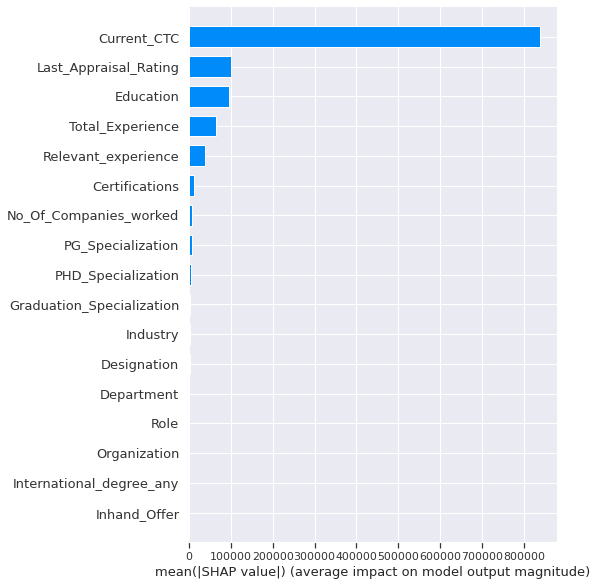

In [1237]:
#calculate shap values
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train,feature_names=X_train.columns,plot_type='bar')

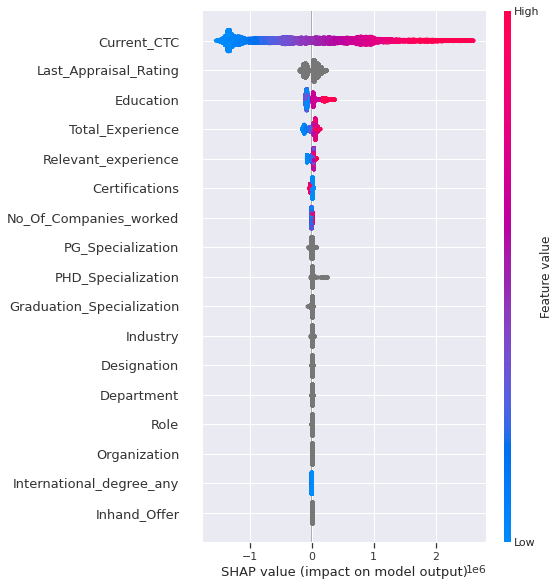

In [1238]:
#Summary plot
shap.summary_plot(shap_values, X_train, feature_names=X_train.columns)

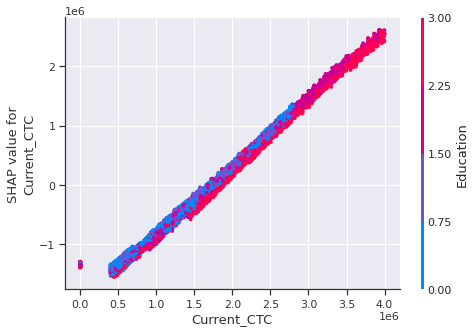

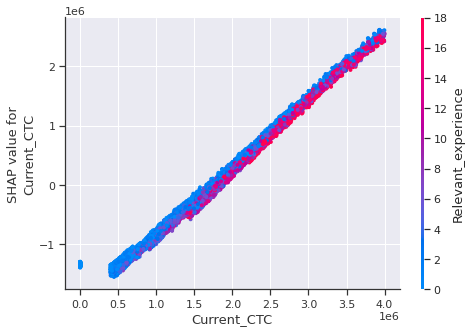

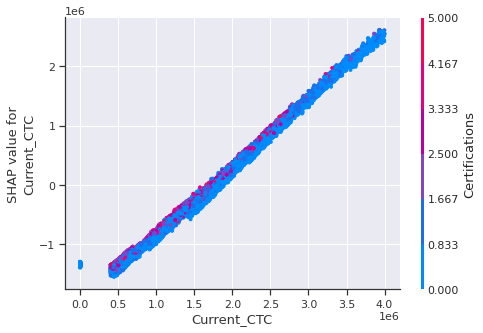

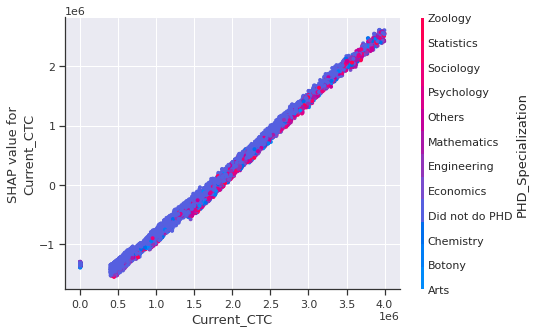

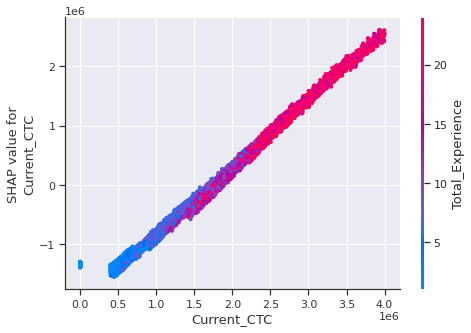

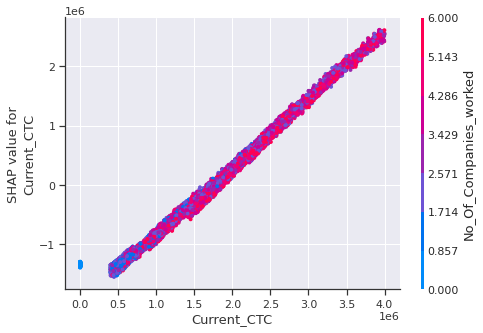

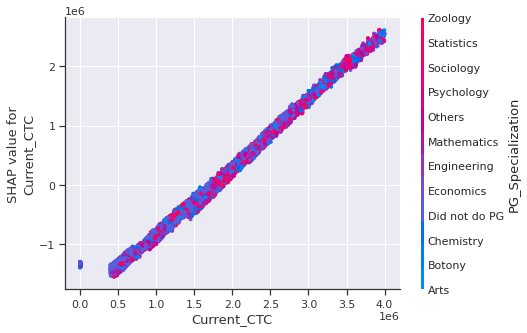

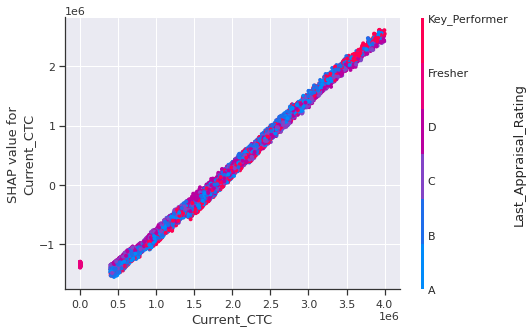

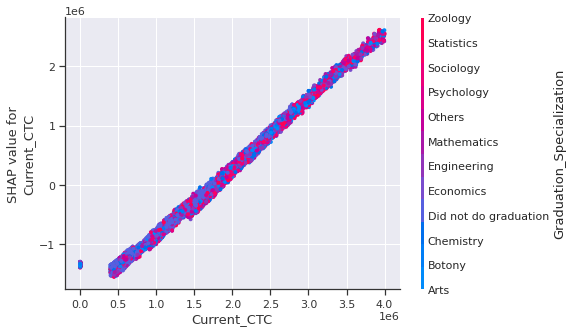

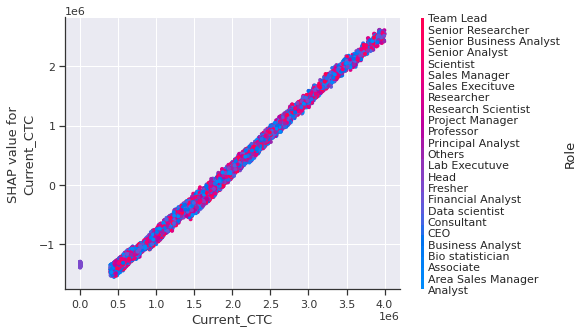

In [1240]:
# we can use shap.approximate_interactions to guess which features
# may interact with a feature
inds = shap.approximate_interactions("Current_CTC", shap_values, X_train)

# make plots colored by each of the top three possible interacting features
for i in range(10):
    shap.dependence_plot("Current_CTC", shap_values, X_train, interaction_index=inds[i])

##### Final conclusions

In [ ]:
#1. As expected, current CTC is the most important predictor for CTC to be offered
#2. Having an international degree doesn’t have any impact on the expected CTC
#3. For PHD level candidates, the impact of current CTC on expected CTC is less for candidates having lower current CTC
#4. It is good to have done certification courses because having done certification courses brings more impact of the current CTC on the expected CTC
#5. It is not expected from high current CTC candidates and/or high total experience candidates to have last appraisal rating received as C or D
#6. If candidate is just a graduate even if the current CTC is very high the impact on expected CTC turns negative
#7. This impact reduces if the candidate has done some certifications
#8. Not having any relevant experience is not much of a concern and will not cause much negative impact on the increment on current CTC
#9.	But to have significant positive impact the candidate must have at least 3 years of relevant experience
#10. PHD candidates are anticipated to have increment in the expected value of CTC to be offered from current CTC whereas the non-PHD candidates are expected to receive decrement in the expected value of CTC
#11.The total experience of the candidates is not of much importance if the candidate is PHD


#### Recommendations to the management

In [ ]:
#1.Certifications could be taken as a potential parameter to judge candidates with relatively lower level of formal education. Evidently, freshers with certifications are able to secure good offer
#2.The distribution of current location and preferred location is spread across many cities while not converging to just one city so company can offer remote location opportunities
#3.Not much impact is being generated by learning the place of university of highest/all level of education. This might create some biasness basis the location so could get away with this feature
#4.Interestingly, 24% of candidates with an offer in hand did not do graduation. Therefore, hiring team can be a bit flexible about the educational level requirements

In [1241]:
import pickle

In [1242]:
pickle.dump(cbr,open('CatBoost_Regressor.pkl','wb'))